**DOMAIN:** Industrial safety. NLP based Chatbot.

**CONTEXT:**

The database comes from one of the biggest industry in Brazil and in the world. It is an urgent need for industries/companies around the globe to understand why employees still suffer some injuries/accidents in plants. Sometimes they also die in such environment.

**DATA DESCRIPTION:**

The database is basically records of accidents from 12 different plants in 03 different countries which every line in the data is an occurrence of an accident.

**Columns description:**

1. **Data:** timestamp or time/date information
2. **Countries:** which country the accident occurred (anonymised)
3. **Local:** the city where the manufacturing plant is located (anonymised)
4. **Industry sector:** which sector the plant belongs to
5. **Accident level:** from I to VI, it registers how severe was the accident (I means not severe but VI means very severe)
6. **Potential Accident Level:** Depending on the Accident Level, the database also registers how severe the accident could have been (due to other factors
involved in the accident)
7. **Genre:** if the person is male of female
8. **Employee or Third Party:** if the injured person is an employee or a third party
9. **Critical Risk:** some description of the risk involved in the accident
10. **Description:** Detailed description of how the accident happened.

Link to download the dataset: https://www.kaggle.com/ihmstefanini/industrial-safety-and-health-analytics-database


**PROJECT OBJECTIVE:**

Design a ML/DL based chatbot utility which can help the professionals to highlight the safety risk as per the incident description.



**PROJECT TASK:**

## **Milestone 1:**

## **Input: Context and Dataset**

### **Import the data**

In [ ]:
# Import necessary python libraries and ignore unnecessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('max_colwidth', None)

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

file_path = '/content/gdrive/My Drive/Capstone_Group10_NLP1/Dataset_Industrial_Safety_and_Health_Database_with_Accidents_description.xlsx'
# Read the Excel file using pandas
ISH_df = pd.read_excel(file_path)

# Display the first few rows of the dataframe
ISH_df.head()

Mounted at /content/gdrive


,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo."
1,1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter."
2,2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury."
3,3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury."
4,4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described."


Shape of Input Dataframe:

In [ ]:
print("Number of rows = {0} and Number of Columns = {1} in the Data frame".format(ISH_df.shape[0], ISH_df.shape[1]))

Number of rows = 425 and Number of Columns = 11 in the Data frame


Datatype of each attribute:

In [ ]:
# Check datatypes
ISH_df.dtypes

,0
Unnamed: 0,int64
Data,datetime64[ns]
Countries,object
Local,object
Industry Sector,object
Accident Level,object
Potential Accident Level,object
Genre,object
Employee or Third Party,object
Critical Risk,object


1. This output shows that most of the columns are of type **'object'**, which typically means they contain **string data**.

2. The **'Data'** column is of type **'datetime64[ns]'**, and **'Unnamed: 0'** is of type **'int64'**.

In [ ]:
# Check Dataframe info
ISH_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Unnamed: 0                425 non-null    int64         
 1   Data                      425 non-null    datetime64[ns]
 2   Countries                 425 non-null    object        
 3   Local                     425 non-null    object        
 4   Industry Sector           425 non-null    object        
 5   Accident Level            425 non-null    object        
 6   Potential Accident Level  425 non-null    object        
 7   Genre                     425 non-null    object        
 8   Employee or Third Party   425 non-null    object        
 9   Critical Risk             425 non-null    object        
 10  Description               425 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 36.6+ KB


In [ ]:
# Missing value count
ISH_df.isnull().sum()

,0
Unnamed: 0,0
Data,0
Countries,0
Local,0
Industry Sector,0
Accident Level,0
Potential Accident Level,0
Genre,0
Employee or Third Party,0
Critical Risk,0


### **Data Cleansing**

In [ ]:
# Dropping Unnecessary Columns:

ISH_df.drop("Unnamed: 0", axis=1, inplace=True)

**Unnamed: 0:** This column appears to be an index column and does not provide any useful information for analysis.

In [ ]:
ISH_df.head()

,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo."
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter."
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury."
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury."
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described."


In [ ]:
# Renaming the columns as per available Data and Description
ISH_df.rename(columns={
    "Data": "Date",
    "Countries": "Country",
    "Local": "City",
    "Genre": "Gender",
    "Employee or Third Party":"Employee Type",
}, inplace=True)

# Modify 'City' column values
ISH_df['City'] = ISH_df['City'].str.replace('Local_', 'City_')

ISH_df.head()

,Date,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description
0,2016-01-01,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo."
1,2016-01-02,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter."
2,2016-01-06,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury."
3,2016-01-08,Country_01,City_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury."
4,2016-01-10,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described."


In [ ]:
# Check for Duplicate rows in the dataset

Duplicate_Rows = ISH_df.duplicated().sum()
print('Number of duplicate rows:', Duplicate_Rows)

Number of duplicate rows: 7


In [ ]:
# View Duplicate records
Duplicates = ISH_df.duplicated()

ISH_df[Duplicates]

,Date,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description
77,2016-04-01,Country_01,City_01,Mining,I,V,Male,Third Party (Remote),Others,"In circumstances that two workers of the Abratech company were doing putty work inside the conditioning tank (5 meters deep and covered by platforms) of metal gratings - grating- in the upper part), two other employees of the HyT company carried out maneuvers transfer of a pump with the help of a manual tick - which worked hooked to a beam H, dragging the pump on the metal gratings (grating), suddenly the pump is hooked with a metal grate (grating) and when trying to release it, the metal grid (grating - 13.0 Kg. (60 cm x 92 cm)) falls inside the tank, hits a diagonal channel inside the tank and then impacts the right arm of one of the workers and rubs the helmet of the second worker that he was crouching. The area where the bomb was being moved was marked with tape and did not have a lookout."
262,2016-12-01,Country_01,City_03,Mining,I,IV,Male,Employee,Others,"During the activity of chuteo of ore in hopper OP5; the operator of the locomotive parks his equipment under the hopper to fill the first car, it is at this moment that when it was blowing out to release the load, a mud flow suddenly appears with the presence of rock fragments; the personnel that was in the direction of the flow was covered with mud."
303,2017-01-21,Country_02,City_02,Mining,I,I,Male,Third Party (Remote),Others,"Employees engaged in the removal of material from the excavation of the well 2 of level 265, using shovel and placing it in the bucket. During the day some of this material fell into the pipes of the employees' boots and the friction between the boot and the calf caused a superficial injury to the legs."
345,2017-03-02,Country_03,City_10,Others,I,I,Male,Third Party,Venomous Animals,"On 02/03/17 during the soil sampling in the region of Sta. the employees Rafael and Danillo da Silva were attacked by a bee test. They rushed away from the place, but the employee Rafael took 4 bites, one on the chin, one on the chest, one on the neck and one on the hand over the glove. The employee took 4 bites, one in his hand over his glove and the other in the head, and the employee Danillo took 2 bites in the left arm over his uniform. At first no one sketched allergy, just swelling at the sting site. The activity was stopped to evaluate the site, after verifying that the test had remained in the line, they left the site."
346,2017-03-02,Country_03,City_10,Others,I,I,Male,Third Party,Venomous Animals,"On 02/03/17 during the soil sampling in the region of Sta. the employees Rafael and Danillo da Silva were attacked by a bee test. They rushed away from the place, but the employee Rafael took 4 bites, one on the chin, one on the chest, one on the neck and one on the hand over the glove. The employee took 4 bites, one in his hand over his glove and the other in the head, and the employee Danillo took 2 bites in the left arm over his uniform. At first no one sketched allergy, just swelling at the sting site. The activity was stopped to evaluate the site, after verifying that the test had remained in the line, they left the site."
355,2017-03-15,Country_03,City_10,Others,I,I,Male,Third Party,Venomous Animals,"Team of the VMS Project performed soil collection on the Xixás target with 3 members. When the teams were moving from one collection point to another, Mr. Fabio was ahead of the team, stinging behind Robson and Manoel da Silva. near the collection point were surprised by a swarm of bees that was inside a I play near the ground, with no visibility in the woods and no hissing noise. Fabio passed by the stump, but Robson and Manoel da Silva were attacked by the bees. Robson had a sting in his left arm over his uniform and Manoel da Silva had a prick in his lip as his screen ripped as he tangled in the branches during the escape."
397,2017-05-23,Country_01,City_04,Mining

In [ ]:
# Remove duplicate rows and save the deduplicated dataset

ISH_df_cleaned = ISH_df.drop_duplicates()

# Save the deduplicated dataset to a new file
ISH_df_cleaned.to_csv('ISH_df_cleaned.csv', index=False)

# Print the number of rows before and after deduplication
print('Number of rows before deduplication:', len(ISH_df))
print('Number of rows after deduplication:', len(ISH_df_cleaned))

Number of rows before deduplication: 425
Number of rows after deduplication: 418


In [ ]:
# Shape of Deduplicated Dataframe 'ISH_df_cleaned'

ISH_df_cleaned.shape
print("Number of rows = {0} and Number of Columns = {1} in the Data frame after removing the duplicates.".format(ISH_df_cleaned.shape[0], ISH_df_cleaned.shape[1]))

Number of rows = 418 and Number of Columns = 10 in the Data frame after removing the duplicates.


In [ ]:
# Check unique values for each column in the deduplicated dataframe

# Check for unique values in each column
Unique_Values = ISH_df_cleaned.nunique()

Unique_Values

,0
Date,287
Country,3
City,12
Industry Sector,3
Accident Level,5
Potential Accident Level,6
Gender,2
Employee Type,3
Critical Risk,33
Description,411


In [ ]:
# Check Cleaned Dataframe info
ISH_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 418 entries, 0 to 424
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      418 non-null    datetime64[ns]
 1   Country                   418 non-null    object        
 2   City                      418 non-null    object        
 3   Industry Sector           418 non-null    object        
 4   Accident Level            418 non-null    object        
 5   Potential Accident Level  418 non-null    object        
 6   Gender                    418 non-null    object        
 7   Employee Type             418 non-null    object        
 8   Critical Risk             418 non-null    object        
 9   Description               418 non-null    object        
dtypes: datetime64[ns](1), object(9)
memory usage: 35.9+ KB


In [ ]:
# Identify numerical and categorical columns
numerical_columns = ISH_df_cleaned.select_dtypes(include=[np.number]).columns.tolist()
categorical_columns = ISH_df_cleaned.select_dtypes(exclude=[np.number]).columns.tolist()

# Exclude 'Data' column from categorical columns
categorical_columns = [col for col in categorical_columns if col != 'Date']
print('Numerical columns:', numerical_columns)
print('Categorical columns:', categorical_columns)

Numerical columns: []
Categorical columns: ['Country', 'City', 'Industry Sector', 'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk', 'Description']


In [ ]:
# Check unique values in the 'Data' column
Unique_Dates = ISH_df_cleaned['Date'].unique()
Unique_Dates

<DatetimeArray>
['2016-01-01 00:00:00', '2016-01-02 00:00:00', '2016-01-06 00:00:00',
 '2016-01-08 00:00:00', '2016-01-10 00:00:00', '2016-01-12 00:00:00',
 '2016-01-16 00:00:00', '2016-01-17 00:00:00', '2016-01-19 00:00:00',
 '2016-01-26 00:00:00',
 ...
 '2017-06-24 00:00:00', '2017-06-20 00:00:00', '2017-06-23 00:00:00',
 '2017-06-19 00:00:00', '2017-06-22 00:00:00', '2017-06-29 00:00:00',
 '2017-07-04 00:00:00', '2017-07-05 00:00:00', '2017-07-06 00:00:00',
 '2017-07-09 00:00:00']
Length: 287, dtype: datetime64[ns]

In [ ]:
# Viewing result in the form of separate dataframes for each attribute

for column in ISH_df_cleaned.columns:
    print(f'\nDataFrame for {column}:')
    if column in categorical_columns:
        df_temp = pd.DataFrame(ISH_df_cleaned[column].value_counts()).reset_index()
        df_temp.columns = [column, 'Count']
        # Calculate percentage
        total = df_temp['Count'].sum()
        df_temp['Percentage'] = (df_temp['Count'] / total * 100).round(2)  # Round off to 2 decimal points
    else:
        df_temp = pd.DataFrame(ISH_df_cleaned[column].describe()).reset_index()
        df_temp.columns = ['Statistic', column]
    display(df_temp)
    print('-' * 50)


DataFrame for Date:


,Statistic,Date
0,count,418
1,mean,2016-09-18 20:50:31.578947328
2,min,2016-01-01 00:00:00
3,25%,2016-04-30 06:00:00
4,50%,2016-09-06 00:00:00
5,75%,2017-02-06 12:00:00
6,max,2017-07-09 00:00:00


--------------------------------------------------

DataFrame for Country:


,Country,Count,Percentage
0,Country_01,248,59.33
1,Country_02,129,30.86
2,Country_03,41,9.81


--------------------------------------------------

DataFrame for City:


,City,Count,Percentage
0,City_03,89,21.29
1,City_05,59,14.11
2,City_01,56,13.40
3,City_04,55,13.16
4,City_06,46,11.00
5,City_10,41,9.81
6,City_08,27,6.46
7,City_02,23,5.50
8,City_07,14,3.35
9,City_12,4,0.96


--------------------------------------------------

DataFrame for Industry Sector:


,Industry Sector,Count,Percentage
0,Mining,237,56.70
1,Metals,134,32.06
2,Others,47,11.24


--------------------------------------------------

DataFrame for Accident Level:


,Accident Level,Count,Percentage
0,I,309,73.92
1,II,40,9.57
2,III,31,7.42
3,IV,30,7.18
4,V,8,1.91


--------------------------------------------------

DataFrame for Potential Accident Level:


,Potential Accident Level,Count,Percentage
0,IV,141,33.73
1,III,106,25.36
2,II,95,22.73
3,I,45,10.77
4,V,30,7.18
5,VI,1,0.24


--------------------------------------------------

DataFrame for Gender:


,Gender,Count,Percentage
0,Male,396,94.74
1,Female,22,5.26


--------------------------------------------------

DataFrame for Employee Type:


,Employee Type,Count,Percentage
0,Third Party,185,44.26
1,Employee,178,42.58
2,Third Party (Remote),55,13.16


--------------------------------------------------

DataFrame for Critical Risk:


,Critical Risk,Count,Percentage
0,Others,229,54.78
1,Pressed,24,5.74
2,Manual Tools,20,4.78
3,Chemical substances,17,4.07
4,Cut,14,3.35
5,Projection,13,3.11
6,Venomous Animals,13,3.11
7,Bees,10,2.39
8,Fall,9,2.15
9,Vehicles and Mobile Equipment,8,1.91


--------------------------------------------------

DataFrame for Description:


,Description,Count,Percentage
0,"During the activity of chuteo of ore in hopper OP5; the operator of the locomotive parks his equipment under the hopper to fill the first car, it is at this moment that when it was blowing out to release the load, a mud flow suddenly appears with the presence of rock fragments; the personnel that was in the direction of the flow was covered with mud.",2,0.48
1,"The employees Márcio and Sérgio performed the pump pipe clearing activity FZ1.031.4 and during the removal of the suction spool flange bolts, there was projection of pulp over them causing injuries.",2,0.48
2,"In the geological reconnaissance activity, in the farm of Mr. Lázaro, the team composed by Felipe and Divino de Morais, in normal activity encountered a ciliary forest, as they needed to enter the forest to verify a rock outcrop which was the front, the Divine realized the opening of the access with machete. At that moment, took a bite from his neck. There were no more attacks, no allergic reaction, and continued work normally. With the work completed, leaving the forest for the same access, the Divine assistant was attacked by a snake and suffered a sting in the forehead. At that moment they moved away from the area. It was verified that there was no type of allergic reaction and returned with normal activities.",2,0.48
3,"At moments when the MAPERU truck of plate F1T 878, returned from the city of Pasco to the Unit transporting a consultant, being 350 meters from the main gate his lane is invaded by a civilian vehicle, making the driver turn sharply to the side right where was staff of the company IMPROMEC doing hot melt work in an 8 ""pipe impacting two collaborators causing the injuries described At the time of the accident the truck was traveling at 37km / h - according to INTHINC -, the width of the road is of 6 meters, the activity had safety cones as a warning on both sides of the road and employees used their respective EPP'S.",2,0.48
4,When starting the activity of removing a coil of electric cables in the warehouse with the help of forklift truck the operator did not notice that there was a beehive in it. Due to the movement of the coil the bees were excited. Realizing the fact the operator turned off the equipment and left the area. People passing by were stung.,2,0.48
...,...,...,...
406,"Being 01:50 p.m. approximately, in the Nv. 1800, in the Tecnomin winery. Mr. Chagua - Bodeguero was alone, cutting wires No. 16 with a grinder, previously he had removed the protection guard from the disk of 4 inches in diameter and adapted a disk of a crosscutter of approximately 8 inches. Originating traumatic amputation of two fingers of the left hand",1,0.24
407,"In circumstances that the collaborator performed the cleaning of the ditch 3570, 0.50 cm deep, removing the pipe of 2 ""HDPE material with an estimated weight of 30 Kg. Together with two collaborators, when pushing the tube to drain the dune, the collaborator is hit on the lower right side lip producing a slight blow to the lip. At the time of the event, the collaborator had a safety helmet, glasses and gloves.",1,0.24
408,"During the process of washing the material (Becker), the tip of the material was broken which caused a cut of the 5th finger of the right hand",1,0.24
409,The clerk was peeling and pulling a sheet came another one that struck in his 5th chirodactile of the left hand tearing his PVC sleeve caused a cut.,1,0.24


--------------------------------------------------


### **Data Exploration Observations:**

**Overall:**
1. The dataset contains information on industrial accidents across different countries, cities, and industry sectors.
2. The time frame of the accidents is captured in the 'Date' column.
3. The severity of accidents is categorized into levels from I to VI.
4. Information about the gender, employee type, critical risk, and a detailed description of the accident is provided.

**Specific Observations:**

1. **Country:** Most accidents occurred in Country_01, followed by Country_02 and Country_03.
2. **City:** The distribution of accidents across cities varies, with some cities having a higher number of incidents than others.
3. **Industry Sector:** The 'Mining' sector has the highest number of accidents, indicating a potentially higher risk in this industry.
4. **Accident Level:** The majority of accidents fall under levels I and II, suggesting that most accidents are relatively minor in severity.
5. **Potential Accident Level:** There's a notable difference between the actual accident level and the potential accident level, highlighting the importance of preventive measures.
6. **Gender:** Male employees are involved in a significantly higher number of accidents compared to females.
7. **Employee Type:** Most accidents involve employees rather than third parties.
8. **Critical Risk:** 'Others' is the most frequent category in critical risk, which might indicate a need for more specific categorization.
9. **Description:** The description column provides detailed narratives of the accidents, which can be valuable for further text analysis and understanding the circumstances leading to accidents.

**Potential Areas for Further Analysis:**
1. Investigate the reasons behind the higher number of accidents in specific countries, cities, and industry sectors.
2. Analyze the factors contributing to the difference between actual and potential accident levels.
3. Explore the reasons for the gender disparity in accident involvement.
4. Deep dive into the 'Others' category in critical risk to identify potential subcategories.
5. Perform text analysis on the 'Description' column to extract insights and patterns related to accident causes.

In [ ]:
ISH_df_cleaned

,Date,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description
0,2016-01-01,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo."
1,2016-01-02,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter."
2,2016-01-06,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury."
3,2016-01-08,Country_01,City_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury."
4,2016-01-10,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described."
...,...,...,...,...,...,...,...,...,...,...
420,2017-07-04,Country_01,City_04,Mining,I,III,Male,Third Party,Others,"Being approximately 5:00 a.m. approximately, when lifting the Kelly HQ towards the pulley of the frame to align it, the assistant Marco that is in the later one is struck the hand against the frame generating the injury."
421,2017-07-04,Country_01,City_03,Mining,I,II,Female,Employee,Others,"The collaborator moved from the infrastructure office (Julio to the toilets, when the pin of the right shoe is hooked on the bra of the left shoe causing not to take the step and fall untimely, causing injury described."
422,2017-07-05,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,"During the environmental monitoring activity in the area, the employee was surprised by a swarming swarm of weevils. During the exit of the place, endured suffering two stings, being one in the face and the other in the middle finger of the left hand."
423,2017-07-06,Country_02,City_05,Metals,I,II,Male,Employee,Cut,"The Employee performed the activity of stripping cathodes, when pulling the cathode sheet his hand hit the side of another cathode, causing a blunt cut on his 2nd finger of the left hand."


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ISH_df_cleaned.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/ISH_df_cleaned.csv', index=False)

Mounted at /content/drive


### **Data Visualization**

### **Univariate Plots**

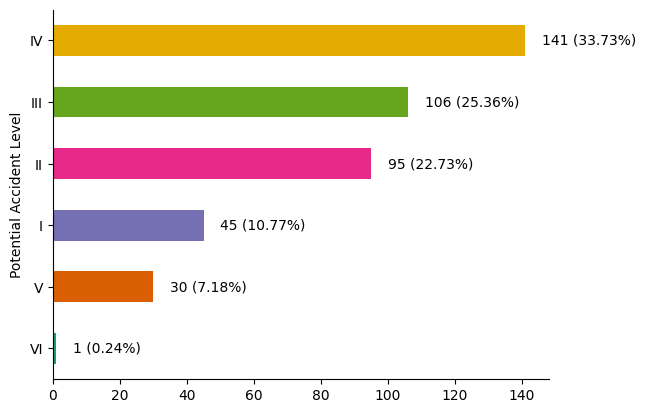

In [ ]:
# @title Potential Accident Level Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('Potential Accident Level').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.show()

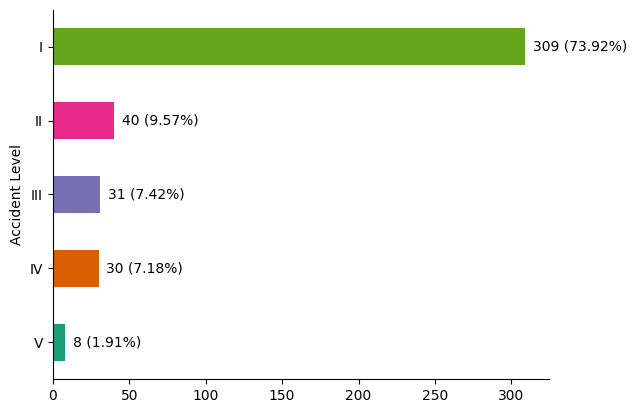

In [ ]:
# @title Accident Level Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('Accident Level').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.show()

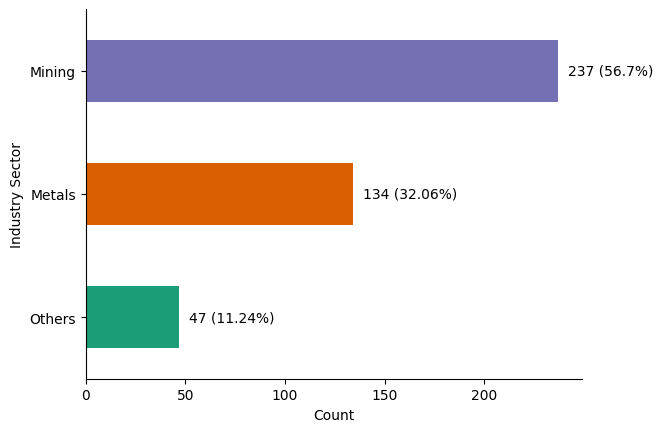

In [ ]:
# @title Industry Sector Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('Industry Sector').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.xlabel('Count')
plt.show()


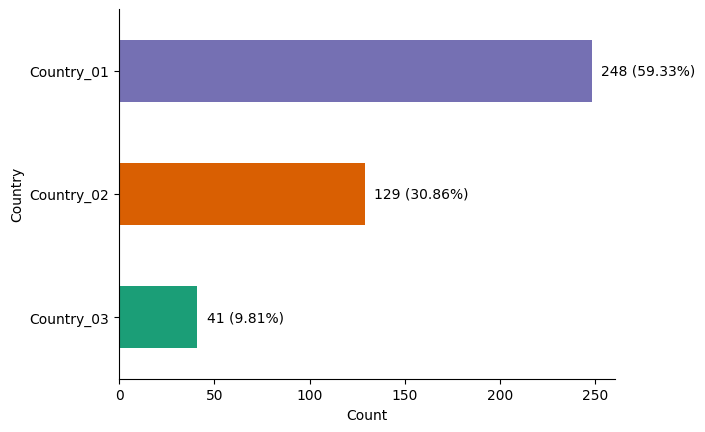

In [ ]:
# @title Country Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('Country').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.xlabel('Count')
plt.show()

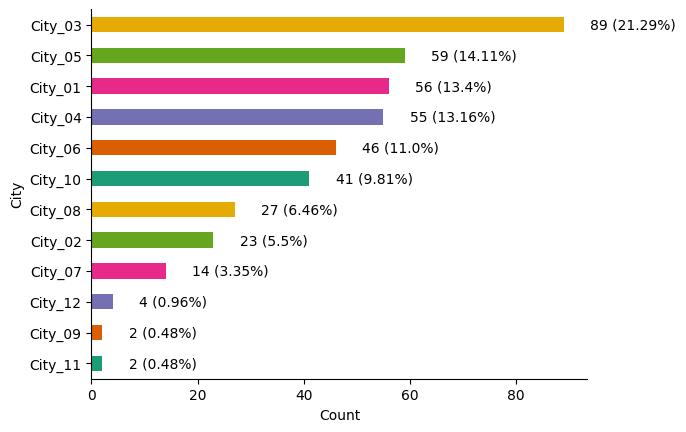

In [ ]:
# @title City Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('City').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.xlabel('Count')
plt.show()

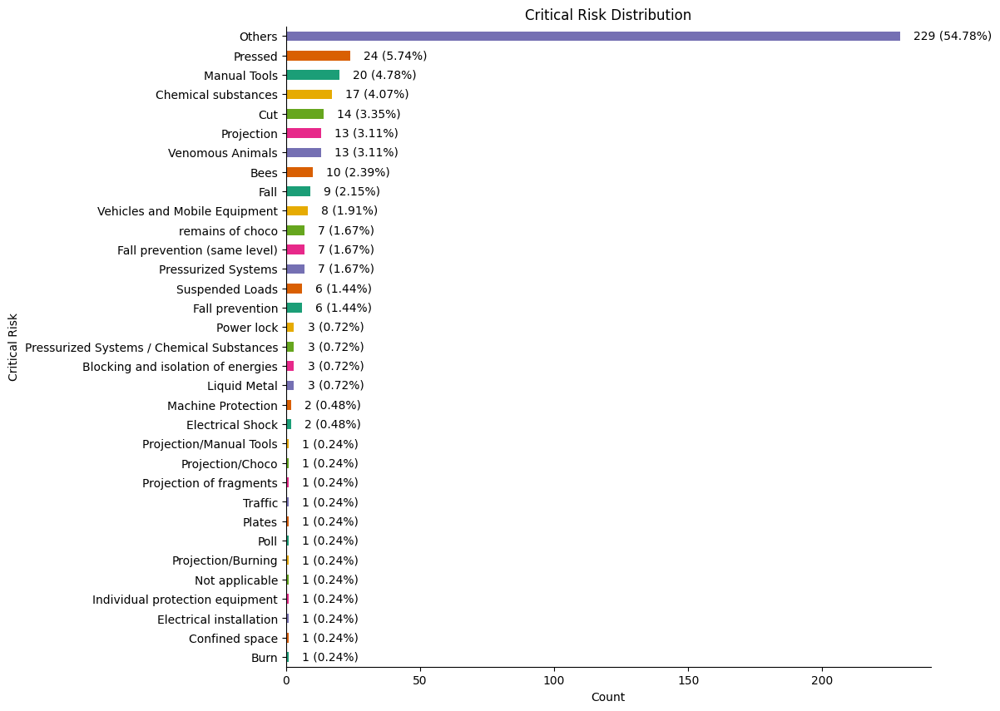

In [ ]:
# @title Critical Risk Distribution

# Calculate counts and percentages
counts = ISH_df_cleaned.groupby('Critical Risk').size().sort_values(ascending=True)
total = counts.sum()
percentages = (counts / total * 100).round(2)

# Create bar plot
plt.figure(figsize=(10, 10))  # Adjust figure size as needed
ax = counts.plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)

# Add count and percentage labels to bars
for i, (count, percentage) in enumerate(zip(counts, percentages)):
  ax.text(count + 5, i, f'{count} ({percentage}%)', va='center')

plt.xlabel('Count')
plt.title('Critical Risk Distribution')
plt.show()


### **Bivariate Plots**

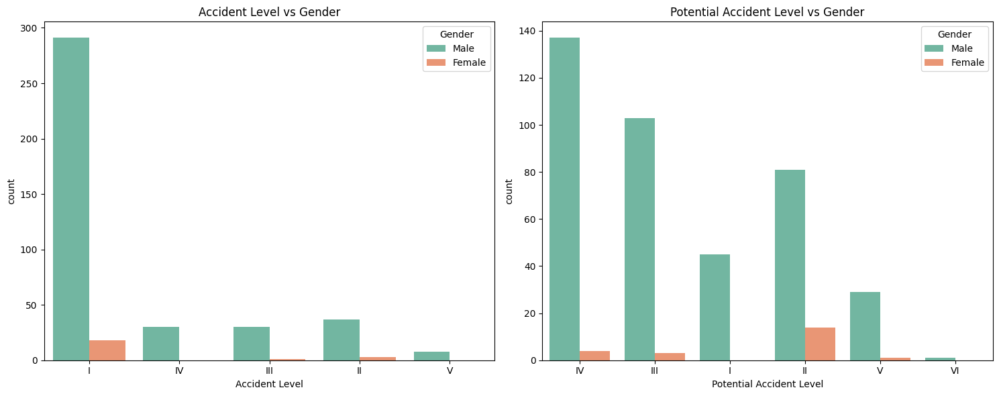

In [ ]:
# @title Accident Level and Potential Accident Level vs Gender

import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot Accident Level vs Gender
sns.countplot(x='Accident Level', hue='Gender', data=ISH_df_cleaned, ax=axes[0], palette='Set2')
axes[0].set_title('Accident Level vs Gender')

# Plot Potential Accident Level vs Gender
sns.countplot(x='Potential Accident Level', hue='Gender', data=ISH_df_cleaned, ax=axes[1], palette='Set2')
axes[1].set_title('Potential Accident Level vs Gender')

# Rotate x-axis labels for better readability
plt.setp(axes[0].get_xticklabels(), rotation=0)
plt.setp(axes[1].get_xticklabels(), rotation=0)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### **Observations:**

**Accident Level vs Gender:**
1. A significantly higher number of males are involved in accidents across all accident levels.
2. The disparity is particularly pronounced in lower accident levels (I and II).

**Potential Accident Level vs Gender:**
1. Similar to the actual accident level, males are more likely to be involved in potential accidents.
2. The difference in potential accident levels between genders is less pronounced compared to actual accidents, suggesting that preventive measures might be more effective for males.

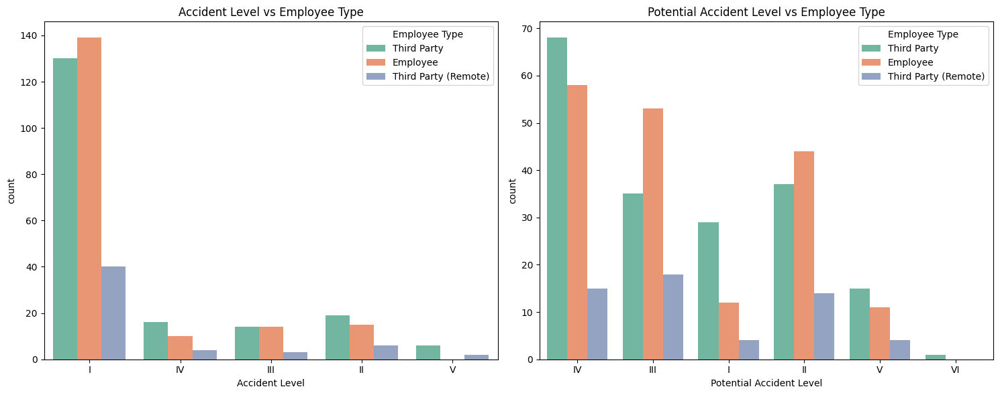

In [ ]:
# @title Accident Level and Potential Accident Level vs Employee Type

import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot Accident Level vs Gender
sns.countplot(x='Accident Level', hue='Employee Type', data=ISH_df_cleaned, ax=axes[0], palette='Set2')
axes[0].set_title('Accident Level vs Employee Type')

# Plot Potential Accident Level vs Gender
sns.countplot(x='Potential Accident Level', hue='Employee Type', data=ISH_df_cleaned, ax=axes[1], palette='Set2')
axes[1].set_title('Potential Accident Level vs Employee Type')

# Rotate x-axis labels for better readability
plt.setp(axes[0].get_xticklabels(), rotation=0)
plt.setp(axes[1].get_xticklabels(), rotation=0)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### **Observations:**

**Accident Level vs Employee Type:**
1. Employees are involved in a significantly higher number of accidents across all accident levels compared to third parties.
2. The difference is particularly pronounced in lower accident levels (I and II).

**Potential Accident Level vs Employee Type:**
1. Similar to the actual accident level, employees are more likely to be involved in potential accidents compared to third parties.
2. The difference in potential accident levels between employee types is less pronounced compared to actual accidents. This suggests that preventive measures might be more effective for employees.

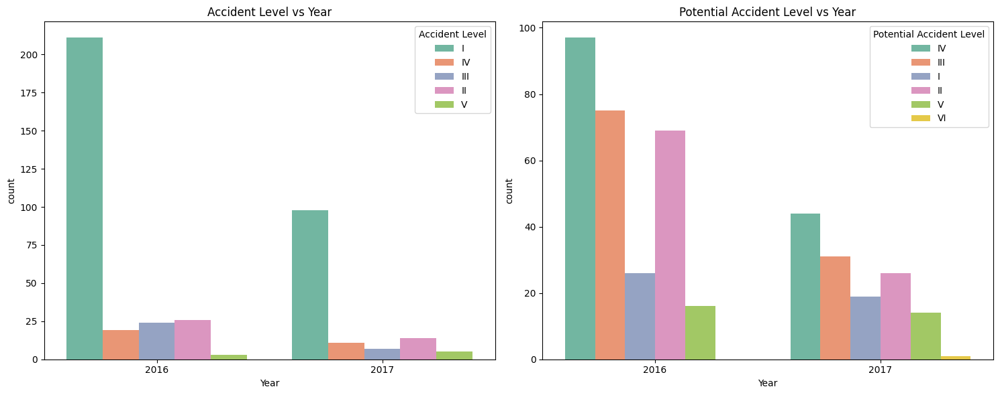

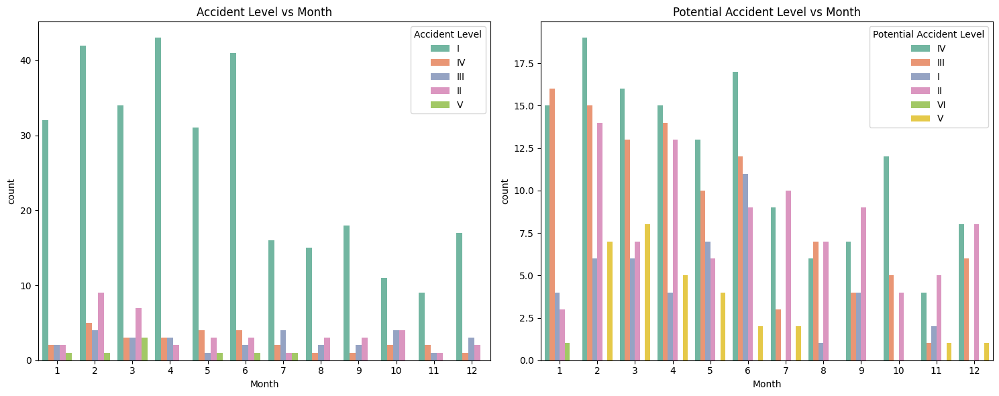

In [ ]:
# @title Accident Level and Potential Accident Over Years and Months

# Extract year and month from the 'Date' column
ISH_df_cleaned['Year'] = ISH_df_cleaned['Date'].dt.year
ISH_df_cleaned['Month'] = ISH_df_cleaned['Date'].dt.month

# Plot Accident Level and Potential Accident Level against Year
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.countplot(x='Year', hue='Accident Level', data=ISH_df_cleaned, ax=axes[0], palette='Set2')
axes[0].set_title('Accident Level vs Year')
sns.countplot(x='Year', hue='Potential Accident Level', data=ISH_df_cleaned, ax=axes[1], palette='Set2')
axes[1].set_title('Potential Accident Level vs Year')
plt.tight_layout()
plt.show()

# Plot Accident Level and Potential Accident Level against Month
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.countplot(x='Month', hue='Accident Level', data=ISH_df_cleaned, ax=axes[0], palette='Set2')
axes[0].set_title('Accident Level vs Month')
sns.countplot(x='Month', hue='Potential Accident Level', data=ISH_df_cleaned, ax=axes[1], palette='Set2')
axes[1].set_title('Potential Accident Level vs Month')
plt.tight_layout()
plt.show()

### **Observations:**

**Accident Level vs Year:**
1. There's a noticeable decrease in the number of accidents across all levels in the later years compared to the initial years.
2. This suggests a positive trend in terms of safety improvements over time.

**Potential Accident Level vs Year:**
1. Similar to the actual accident level, potential accidents also show a decreasing trend over the years.
2. This indicates that preventive measures and safety protocols might be becoming more effective in mitigating potential risks.

**Accident Level vs Month:**
1. There's some variation in accident counts across different months, but no clear seasonal pattern emerges.
2. Further analysis might be needed to identify potential factors influencing these monthly fluctuations.

**Potential Accident Level vs Month:**
1. Similar to the actual accident level, potential accidents also show some monthly variation without a distinct seasonal pattern.
2. This suggests that the factors influencing accident occurrences might not be strongly tied to specific months.


<Figure size 1000x600 with 0 Axes>

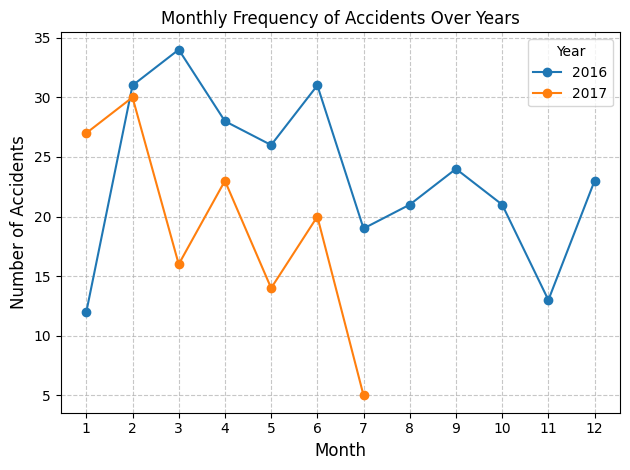

In [ ]:
# @title Monthly Frequency of Accidents Over Years

# Group by year and month and count accidents
monthly_accidents = ISH_df_cleaned.groupby(['Year', 'Month'])['Date'].count().reset_index(name='Accident Count')

# Pivot the table for plotting
monthly_accidents_pivot = monthly_accidents.pivot(index='Month', columns='Year', values='Accident Count')

# Plot the monthly accident frequency for each year
plt.figure(figsize=(10, 6))
monthly_accidents_pivot.plot(kind='line', marker='o')
plt.title('Monthly Frequency of Accidents Over Years', fontsize=12)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(range(1, 13))  # Set x-axis ticks to represent months
plt.legend(title='Year', loc='upper right')
plt.grid(False, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### **Observations:**

**Overall Trend:**
1. There appears to be a general downward trend in the number of accidents over the years.
2. This could suggest that safety measures or interventions implemented over time are having a positive impact.

**Seasonal Variations:**
1. There might be some seasonal variations in accident frequency. For example, there seems to be a slight increase in accidents around the middle of the year (months 5-7) in some years.
2. This could be related to factors like weather conditions, workload, or specific activities happening during those months.

**Year-to-Year Fluctuations:**
1. While the overall trend is downward, there are fluctuations in accident counts from year to year.
2. This highlights the need for continuous monitoring and adjustment of safety protocols to address specific challenges that might arise in different periods.

**Further Analysis:**
1. To gain deeper insights, it would be helpful to analyze the specific causes of accidents in different months and years.
2. This could reveal patterns or contributing factors that can be targeted for further improvement.

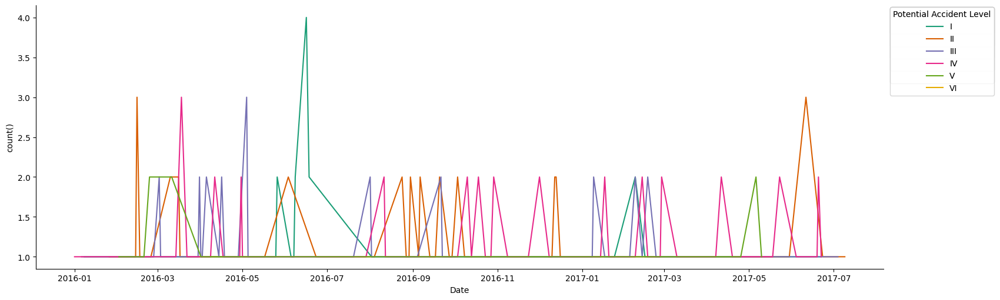

In [ ]:
# @title Date vs Potential Accident Level count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(15, 5), layout='constrained')
df_sorted = ISH_df_cleaned.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Potential Accident Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Potential Accident Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

### **Observations:**

**Trend Over Time:**
1. There is no clear long-term increasing or decreasing trend in the number of accidents for any potential accident level.
2. The counts fluctuate over time, indicating potential seasonality or other factors influencing accident occurrences.

**Potential Accident Level IV:**
1. It consistently shows a lower number of accidents compared to other levels.
2. This suggests that accidents with a high potential severity (level IV) are relatively less frequent.

**Fluctuations and Peaks:**
1. There are noticeable fluctuations in the counts for all potential accident levels.
2. Some periods show peaks in accident occurrences, which might be related to specific events, seasonal changes, or other external factors.

**No Clear Pattern:**
1. There is no consistent pattern in the relationship between the date and the number of accidents for any potential accident level.
2. This suggests that the occurrence of accidents might be influenced by multiple factors that interact in complex ways.


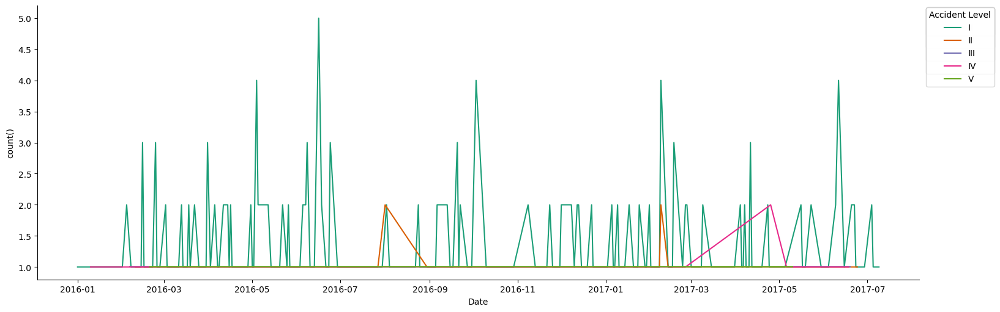

In [ ]:
# @title Date vs Accident Level count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(15, 5), layout='constrained')
df_sorted = ISH_df_cleaned.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Accident Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Accident Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

### **Observations:**

**Trend Over Time:**
1. There is no clear long-term increasing or decreasing trend in the number of accidents for any accident level.
2. The counts fluctuate over time, indicating potential seasonality or other factors influencing accident occurrences.

**Accident Levels I and II:**
1. These levels consistently show a higher number of accidents compared to other levels.
2. This suggests that minor accidents (levels I and II) are more frequent.

**Fluctuations and Peaks:**
1. There are noticeable fluctuations in the counts for all accident levels.
2. Some periods show peaks in accident occurrences, which might be related to specific events, seasonal changes, or other external factors.

**No Clear Pattern:**
1. There is no consistent pattern in the relationship between the date and the number of accidents for any accident level.
2. This suggests that the occurrence of accidents might be influenced by multiple factors that interact in complex ways.

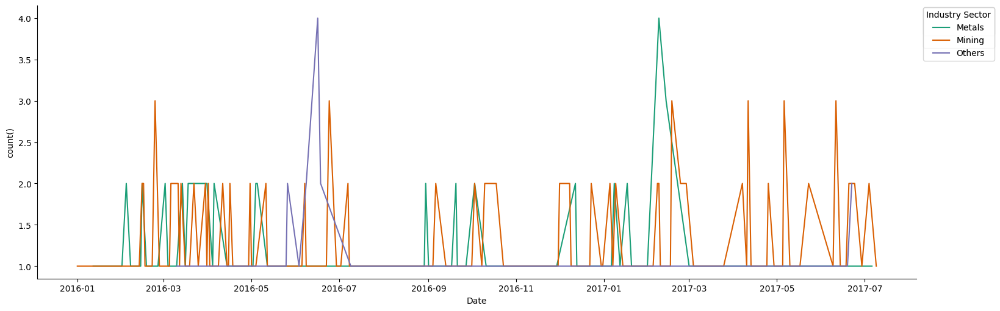

In [ ]:
# @title Date vs Industry Sector count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(15, 5), layout='constrained')
df_sorted = ISH_df_cleaned.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Industry Sector')):
  _plot_series(series, series_name, i)
  fig.legend(title='Industry Sector', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

###  **Observations:**

**Mining Sector:**
1. The Mining sector consistently shows a higher number of accidents compared to other sectors throughout the observed period.
2. This indicates that the Mining industry faces a greater risk of accidents compared to other sectors.

**Fluctuations and Peaks:**
1. All sectors experience fluctuations in the number of accidents over time.
2. Some periods show peaks in accident occurrences, suggesting potential seasonal variations or other external factors influencing accident rates.

**Other Sectors:**
1. Sectors like Metals, Others, and Chemicals show relatively lower but still significant numbers of accidents.
2. The fluctuations in these sectors also suggest the influence of external factors on accident occurrences.

**No Clear Trend:**
1. There is no consistent long-term increasing or decreasing trend in the number of accidents for any sector.
2. This indicates that accident occurrences are likely influenced by multiple interacting factors.

**Importance of Sector-Specific Analysis:**
1. The plot highlights the importance of analyzing accident trends within each sector separately.
2. This allows for a more targeted understanding of the factors contributing to accidents and the development of sector-specific safety interventions.

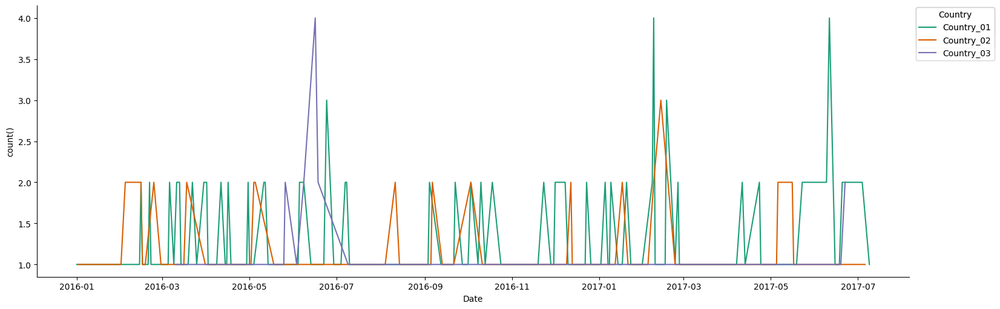

In [ ]:
# @title Date vs Country count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(15, 5), layout='constrained')
df_sorted = ISH_df_cleaned.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Country')):
  _plot_series(series, series_name, i)
  fig.legend(title='Country', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

### **Observations:**

**Country_01:**
1. Consistently shows the highest number of accidents throughout the observed period.
2. This indicates a higher overall accident rate in Country_01 compared to the other two countries.

**Fluctuations and Peaks:**
1. All countries experience fluctuations in the number of accidents over time.
2. Some periods show peaks in accident occurrences, suggesting potential seasonal variations, specific events, or other external factors influencing accident rates.

**Country_02 and Country_03:**
1. These countries generally show lower accident counts compared to Country_01.
2. However, they also experience fluctuations and occasional peaks in accident occurrences.

**No Clear Trend:**
1. There is no consistent long-term increasing or decreasing trend in the number of accidents for any country.
2. This suggests that accident occurrences are likely influenced by multiple interacting factors.

**Country-Specific Factors:**
1. The plot highlights the importance of considering country-specific factors when analyzing accident trends.
2. These factors could include differences in safety regulations, industry practices, cultural attitudes towards safety, and other socio-economic factors.

In [ ]:
# Remove 'Year' and 'Month' columns from the dataframe
ISH_df_cleaned = ISH_df_cleaned.drop(['Year', 'Month'], axis=1)

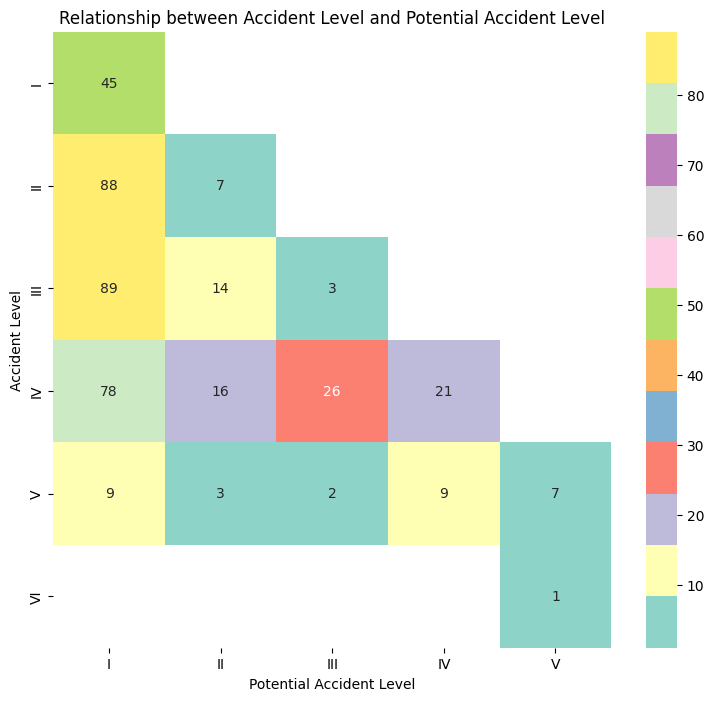

In [ ]:
# @title Accident Level vs Potential Accident Level

# Create a cross-tabulation of Accident Level and Potential Accident Level
df_2dhist = pd.DataFrame({
    x_label: grp['Potential Accident Level'].value_counts()
    for x_label, grp in ISH_df_cleaned.groupby('Accident Level')
})

# Plot a heatmap
plt.figure(figsize=(9, 8))
sns.heatmap(df_2dhist, annot=True, cmap='Set3')
plt.title('Relationship between Accident Level and Potential Accident Level')
plt.xlabel('Potential Accident Level')
plt.ylabel('Accident Level')
plt.show()

### **Observations:**

**Diagonal Dominance:**
1. The heatmap shows a strong diagonal dominance, indicating a positive correlation between Accident Level and Potential Accident Level.
2. This implies that accidents with a higher actual severity level are also more likely to have a higher potential severity level.

**Potential for Worse Outcomes:**
1. There are significant off-diagonal values, especially above the diagonal.
2. This suggests that many accidents that resulted in lower actual severity levels had the potential to be much worse.

**Preventive Measures:**
1. The difference between actual and potential severity highlights the importance of preventive measures and safety protocols.
2. These measures likely played a role in preventing many accidents from escalating to their full potential severity.

**Focus Areas for Improvement:**
1. The heatmap can help identify areas where safety measures can be further improved.
2. For example, focusing on accidents with high potential severity but lower actual severity can lead to more effective prevention strategies.

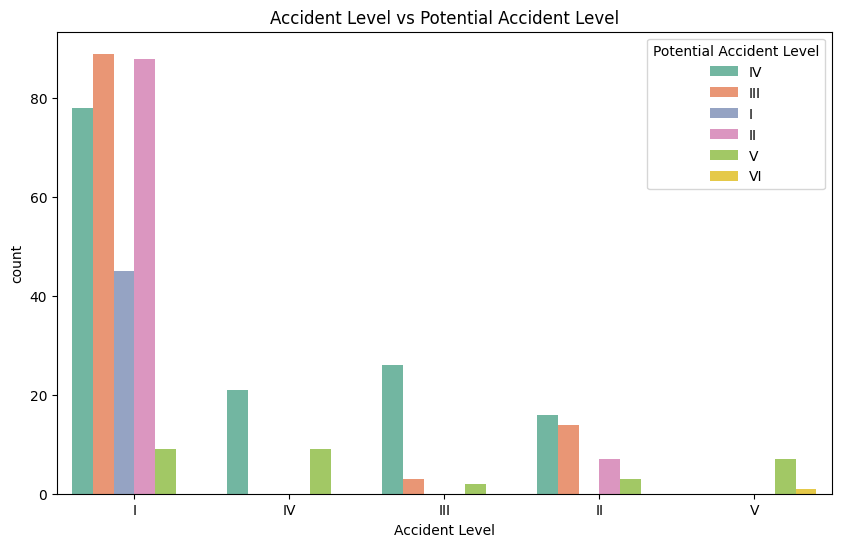

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Accident Level', hue='Potential Accident Level', data=ISH_df_cleaned, palette='Set2')
plt.title('Accident Level vs Potential Accident Level')
plt.show()

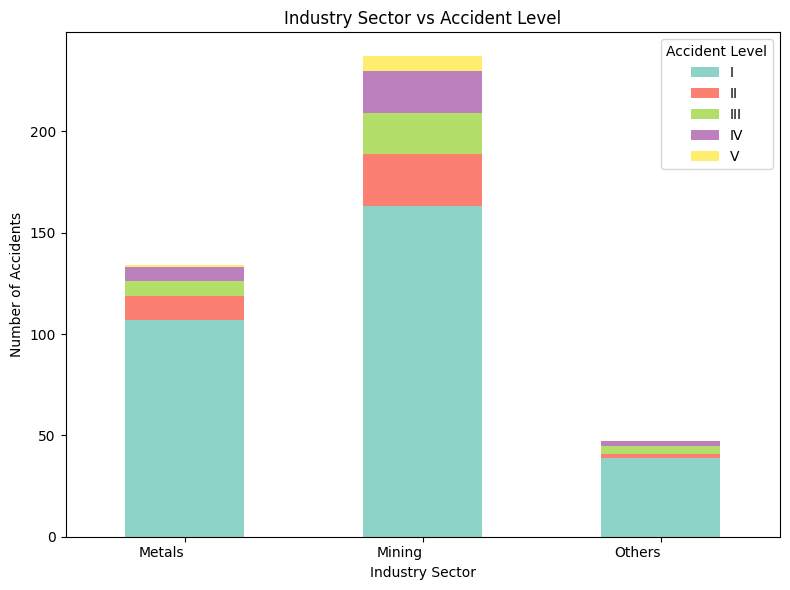

In [ ]:
# @title Industry Sector vs Accident Level

# Group the data by Industry Sector and Accident Level, counting occurrences
grouped_data = ISH_df_cleaned.groupby(['Industry Sector', 'Accident Level'])['Accident Level'].count().unstack().fillna(0)

# Plot a stacked bar chart
grouped_data.plot(kind='bar', stacked=True, figsize=(8, 6),cmap='Set3')
plt.title('Industry Sector vs Accident Level')
plt.xlabel('Industry Sector')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0, ha='right')
plt.legend(title='Accident Level')
plt.tight_layout()
plt.show()

### **Observations:**

**Mining Sector:**
1. The Mining sector stands out with the highest number of accidents across all severity levels.
2. This suggests that the mining industry poses a significant risk to worker safety.

**Other Sectors:**
1. Other sectors like Metals, Others, and Chemicals also show a considerable number of accidents, particularly at lower severity levels.

**Severity Distribution:**
1. Across all sectors, the majority of accidents fall under Level I and Level II, indicating that most incidents are relatively minor.
2. However, the presence of higher-level accidents (Levels III to VI) emphasizes the need for safety measures even in sectors with predominantly minor incidents.

**Focus Areas for Improvement:**
1. The chart highlights the need for targeted safety interventions in the Mining sector and other high-risk industries.
2. Efforts should focus on reducing the overall number of accidents and preventing the escalation of minor incidents to more severe levels.

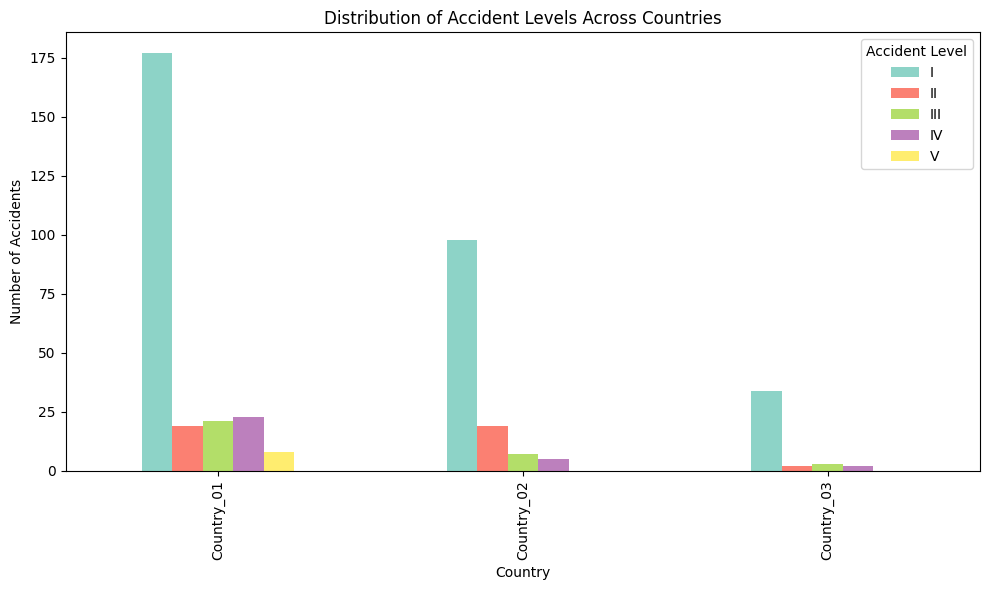

In [ ]:
# @title Distribution of Accident Levels Across Countries

import matplotlib.pyplot as plt

# Assuming 'ISH_df_cleaned' is your DataFrame
city_accident_counts = ISH_df_cleaned.groupby(['Country', 'Accident Level'])['Accident Level'].count().unstack()

city_accident_counts.plot(kind='bar', figsize=(10, 6), cmap='Set3')
plt.xlabel('Country')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accident Levels Across Countries')
plt.xticks(rotation=90)
_ = plt.tight_layout()

### **Observations:**

**Country_01**
1. It consistently shows the highest number of accidents across all accident levels (I to VI).
2. This suggests that Country_01 might have areas for improvement in safety measures compared to the other two countries.

**Country_02**
1. It generally has the second-highest number of accidents, with a notable increase in level III accidents.
2. This could indicate specific risks or practices within Country_02 that contribute to more severe accidents.

**Country_03**
1. It has the lowest number of accidents across most levels, particularly in the more severe categories (IV to VI).
2. This might suggest that Country_03 has relatively better safety protocols in place compared to the other countries.

Across all countries, the number of accidents decreases as the accident level increases. This is expected, as more severe accidents are generally less frequent.

The distribution of accident levels varies across countries, highlighting potential differences in safety regulations, industry practices, or risk factors specific to each country.

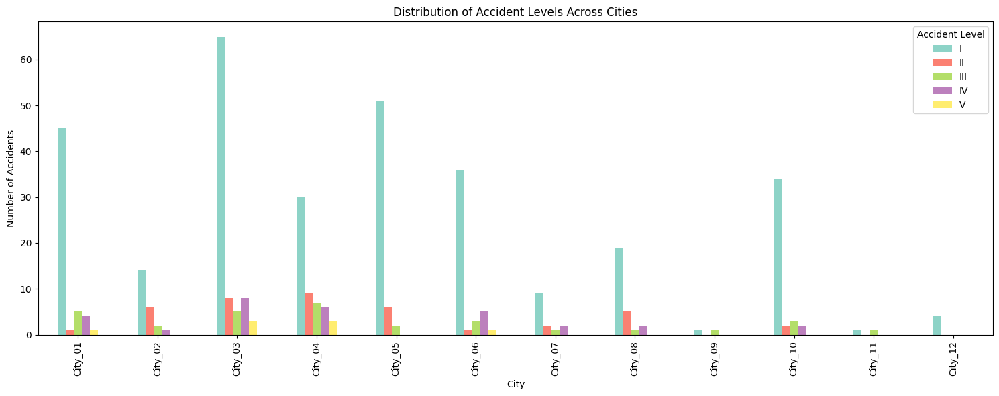

In [ ]:
# @title Distribution of Accident Levels Across Cities

import matplotlib.pyplot as plt

# Assuming 'ISH_df_cleaned' is your DataFrame
city_accident_counts = ISH_df_cleaned.groupby(['City', 'Accident Level'])['Accident Level'].count().unstack()

city_accident_counts.plot(kind='bar', figsize=(15, 6), cmap='Set3')
plt.xlabel('City')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accident Levels Across Cities')
plt.xticks(rotation=90)
_ = plt.tight_layout()

### **Observations:**


**Accident Distribution:**
1. Accidents are not uniformly distributed across cities.
2. Some cities experience a significantly higher number of accidents compared to others.

**Severity Variation:**
1. The distribution of accident levels (I to VI) varies across cities.
2. Certain cities might have a higher proportion of severe accidents (levels IV to VI), while others might predominantly experience minor accidents (levels I and II).

**City-Specific Patterns:**
1. Each city exhibits a unique pattern in terms of accident level distribution. 2. This suggests that factors contributing to accidents might differ from city to city.

**Potential Focus Areas:**
1. Cities with a higher concentration of accidents, especially those with a higher proportion of severe accidents, could be prioritized for further investigation and safety interventions.

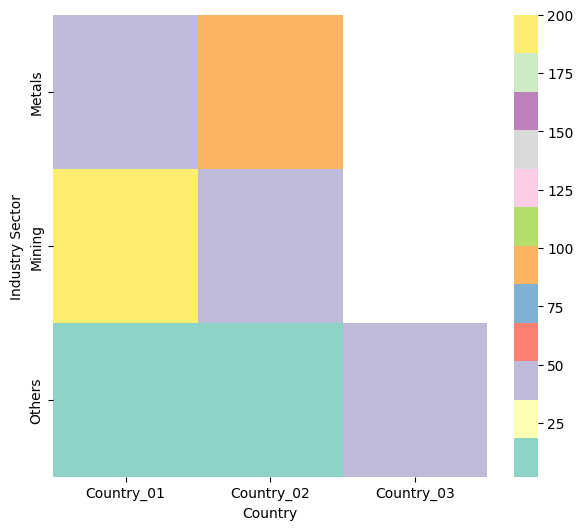

In [ ]:
# @title Country vs Industry Sector

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(7, 6))
df_2dhist = pd.DataFrame({
    x_label: grp['Industry Sector'].value_counts()
    for x_label, grp in ISH_df_cleaned.groupby('Country')
})
sns.heatmap(df_2dhist, cmap='Set3')
plt.xlabel('Country', fontsize=10)
_ = plt.ylabel('Industry Sector')

### **Observations:**

**Country_01:**
1. Highest number of accidents across all industry sectors.
2. Mining is the most accident-prone sector, followed by Metals.
3. Relatively fewer accidents in the Others sector.

**Country_02:**
1. Shows a more balanced distribution of accidents across sectors compared to Country_01.
2. Mining and Metals still have a significant number of accidents.

**Country_03:**
1. Has the lowest number of accidents overall.
2. Mining remains a major concern, but other sectors show a relatively lower number of incidents.

**Overall:**
1. Mining stands out as a high-risk industry across all three countries.
2. Country_01 consistently shows a higher number of accidents compared to the other two countries.
3. The distribution of accidents varies across countries, suggesting potential differences in safety practices or industry compositions.

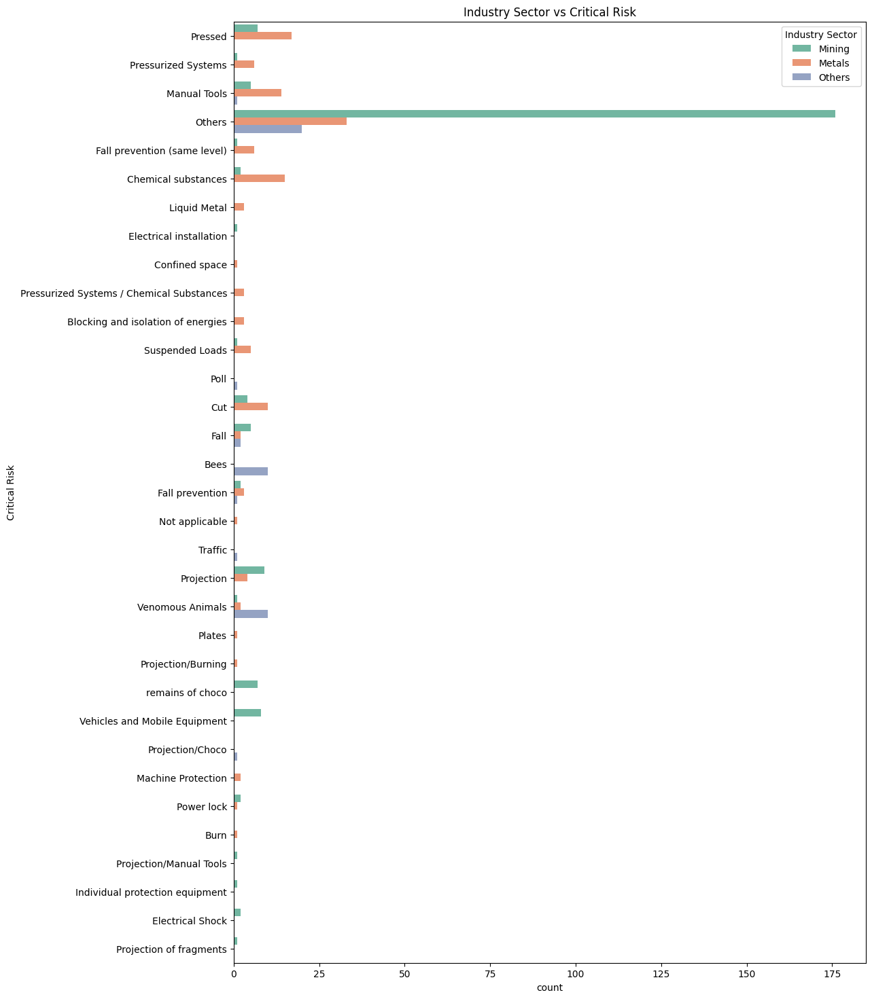

In [ ]:
# @title  Critical Risk vs Industry Sector
plt.figure(figsize=(12, 18))
sns.countplot(y='Critical Risk', hue='Industry Sector', data=ISH_df_cleaned, palette='Set2')
plt.title('Industry Sector vs Critical Risk')
plt.show()

### **Observations:**

**Environmental Risk:**
1. Environmental risk is the most frequently cited critical risk across all industry sectors.
2. This suggests that industries have a significant impact on the environment, and accidents often pose a threat to the surrounding ecosystem.

**Health and Safety Risk:**
1. Health and safety risk is another major concern, particularly in the Mining and Metals sectors.
2. This highlights the importance of worker safety and the potential for accidents to cause injuries or health issues.

**Process Safety Risk:**
1. Process safety risk is prevalent in the Mining, Metals, and Chemicals sectors.
2. This indicates the potential for accidents related to the handling and processing of hazardous materials.

**Other Risks:**
1. Other critical risks, such as Asset Integrity, Security, and Reputation, are also present but less frequent compared to the top three.

**Sector-Specific Risks:**
1. The distribution of critical risks varies across sectors, suggesting that each industry faces unique challenges and potential hazards.

**Focus Areas for Improvement:**
1. The plot highlights the need for targeted risk management strategies in each sector, addressing the most prevalent critical risks.
2. This could involve implementing stricter environmental regulations, enhancing worker safety protocols, and improving process safety measures.

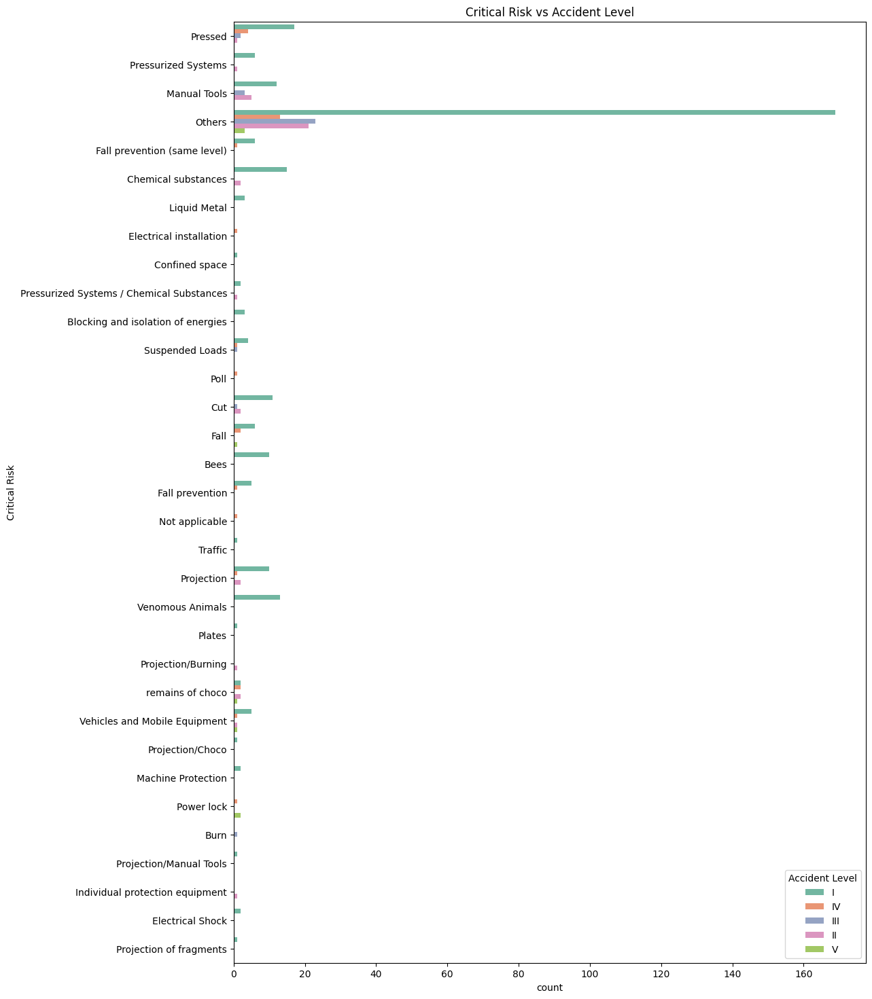

In [ ]:
# @title  Critical Risk vs Accident Level
plt.figure(figsize=(12, 18))
sns.countplot(y='Critical Risk', hue='Accident Level', data=ISH_df_cleaned, palette='Set2')
plt.title('Critical Risk vs Accident Level')
plt.show()

### **Observations:**

**Environmental Risk:**
1. It is the most prevalent critical risk across all accident levels, indicating a consistent concern for environmental impact regardless of accident severity.
2. The number of accidents associated with environmental risk decreases as the accident level increases, suggesting that more severe accidents are less likely to primarily involve environmental concerns.

**Health and Safety Risk:**
1. It is the second most common critical risk, particularly for lower-level accidents (I and II).
2. This suggests that minor accidents often involve risks to worker health and safety.
3. The number of accidents associated with health and safety risk decreases for higher-level accidents, indicating that severe accidents might involve a broader range of critical risks beyond immediate health and safety concerns.

**Process Safety Risk:**
1. It is a significant concern for accidents across all levels, but particularly for levels II and III.
2. This suggests that accidents related to process safety can range in severity.

**Other Risks:**
1. Other critical risks, such as Asset Integrity, Security, and Reputation, are less frequent but still present across different accident levels.
2. This indicates that accidents can have diverse consequences beyond immediate environmental, health, and safety impacts.

**Focus Areas for Improvement:**
1. The plot highlights the need for comprehensive risk management strategies that address all critical risks, regardless of accident severity.
2. Efforts should focus on preventing accidents at all levels and mitigating the specific risks associated with each accident level.

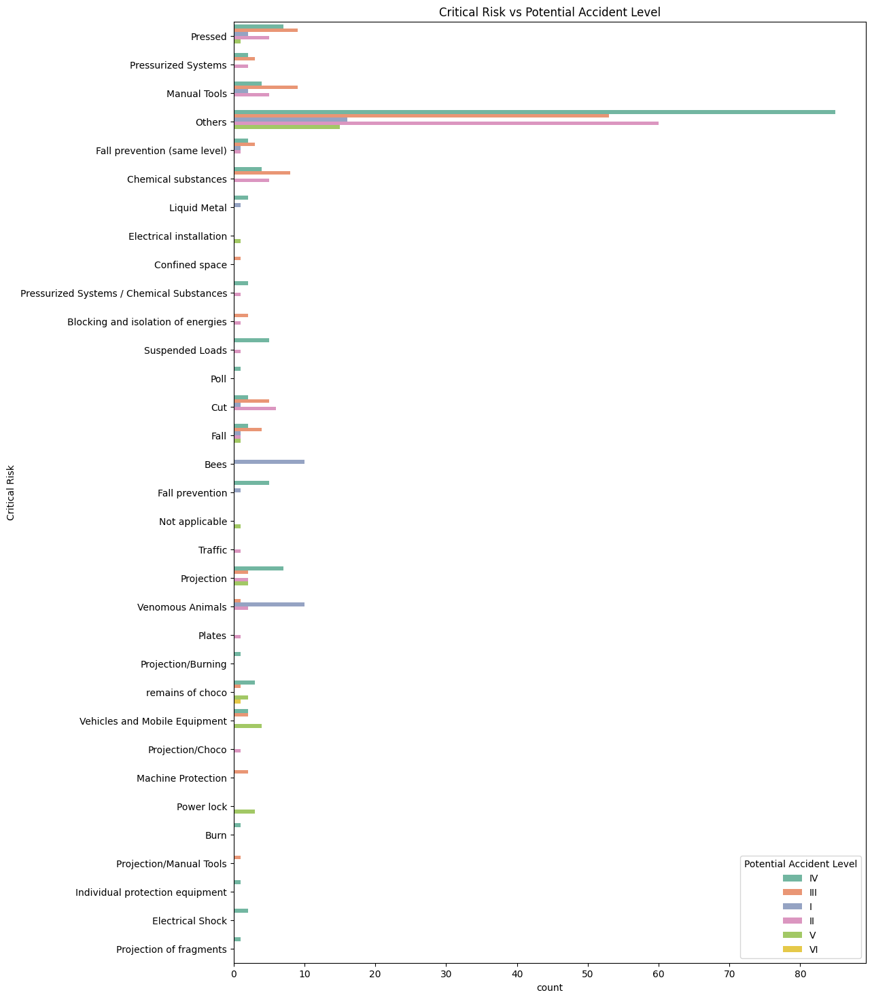

In [ ]:
# @title  Critical Risk vs Potential Accident Level
plt.figure(figsize=(12, 18))
sns.countplot(y='Critical Risk', hue='Potential Accident Level', data=ISH_df_cleaned, palette='Set2')
plt.title('Critical Risk vs Potential Accident Level')
plt.show()

### **Observations:**

**Environmental Risk:**
1. Remains the most frequently cited critical risk across all potential accident levels.
2. This suggests that the potential for environmental damage is a major concern regardless of the potential severity of the accident.

**Health and Safety Risk:**
1. Shows a strong association with higher potential accident levels (III to VI).
2. This indicates that accidents with a higher potential for severity are more likely to pose risks to worker health and safety.

**Process Safety Risk:**
1. Also more prevalent in higher potential accident levels, particularly III and IV.
2. This suggests that inadequate process safety measures can increase the likelihood of more severe accidents.

**Other Risks:**
1. Other critical risks, such as Asset Integrity and Security, are less frequent but still present across different potential accident levels.

**Potential Accident Level and Risk Correlation:**
1. There is a general trend of increasing critical risk with increasing potential accident level.
2. This emphasizes the importance of addressing critical risks to prevent accidents from reaching their full potential severity.

**Focus Areas for Improvement:**
1. The plot highlights the need for proactive risk management strategies that consider the specific critical risks associated with different potential accident levels.
2. This could involve implementing robust preventive measures for environmental risks at all levels, strengthening safety protocols for higher-level potential accidents, and enhancing process safety measures to minimize the risk of severe incidents.

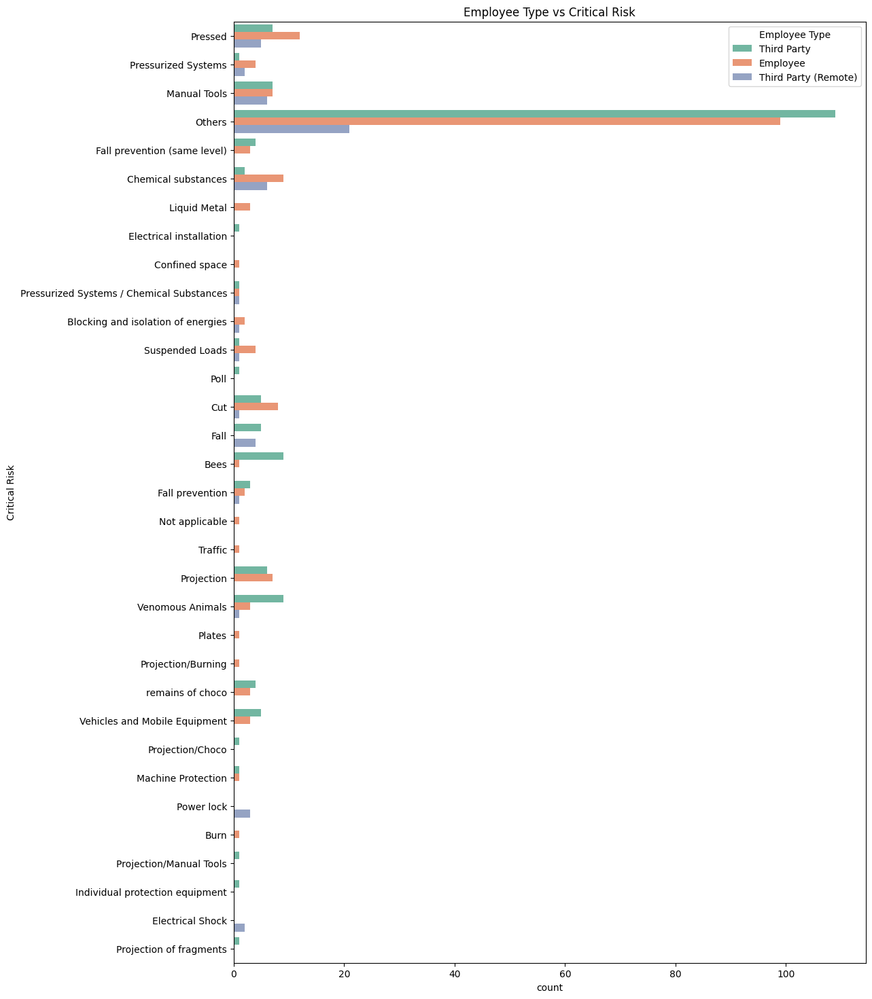

In [ ]:
# @title Critical Risk vs Employee Type
plt.figure(figsize=(12, 18))
sns.countplot(y='Critical Risk', hue='Employee Type', data=ISH_df_cleaned, palette='Set2')
plt.title('Employee Type vs Critical Risk')
plt.show()

### **Observations:**

**Environmental Risk:**
1. It is the most frequently cited critical risk across all employee types.
2. This suggests that environmental impact is a concern regardless of who is involved in the accident.

**Health and Safety Risk:**
1. It is the second most common critical risk, particularly for Employees and Third Parties.
2. This highlights the importance of ensuring the safety of both internal and external personnel.

**Process Safety Risk:**
1. It is more prevalent among Employees, indicating that those directly involved in operational processes are more exposed to this type of risk.

**Other Risks:**
1. Other critical risks, such as Asset Integrity and Security, are less frequent but still present across different employee types.

**Employee Type and Risk Correlation:**
1. The distribution of critical risks varies slightly across employee types, suggesting that different roles and responsibilities might influence the types of risks encountered.

**Focus Areas for Improvement:**
1. The plot emphasizes the need for tailored risk management strategies that consider the specific critical risks associated with different employee types.
2. This could involve providing comprehensive safety training for all employees, implementing strict safety protocols for third-party workers, and enhancing process safety measures to protect those directly involved in operations.

In [ ]:
!pip install holidays

In [ ]:
# Provide list of brazilian holidays in 2016 and 2017

import holidays

# Get Brazilian holidays for 2016 and 2017
brazil_holidays_2016 = holidays.Brazil(years=2016)
brazil_holidays_2017 = holidays.Brazil(years=2017)

# Extract the holidays
holidays_2016 = list(brazil_holidays_2016.items())
holidays_2017 = list(brazil_holidays_2017.items())

# Create dataframes for the holidays
holidays_2016_df = pd.DataFrame(holidays_2016, columns=['Date', 'Holiday'])
holidays_2017_df = pd.DataFrame(holidays_2017, columns=['Date', 'Holiday'])

# Concatenate the two dataframes
all_holidays_df = pd.concat([holidays_2016_df, holidays_2017_df])

# Display the combined dataframe
all_holidays_df

,Date,Holiday
0,2016-01-01,Confraternização Universal
1,2016-03-25,Sexta-feira Santa
2,2016-04-21,Tiradentes
3,2016-05-01,Dia do Trabalhador
4,2016-09-07,Independência do Brasil
5,2016-10-12,Nossa Senhora Aparecida
6,2016-11-02,Finados
7,2016-11-15,Proclamação da República
8,2016-12-25,Natal
0,2017-01-01,Confraternização Universal


In [ ]:
import holidays
from datetime import datetime

# Assuming 'Date' column is in the format 'YYYY-MM-DD'

def add_date_features(df):
  """
  Adds Weekend, Holiday, Season, DayOfWeek, Year, Month, and Day columns to the dataframe.
  Args:
    ISH_df_cleaned: The dataframe to add features to.
  Returns:
    The dataframe with the added features.
  """
  # Create a copy of the dataframe
  ISH_df_preprocess = ISH_df_cleaned.copy()

  # Convert 'Date' to datetime objects
  ISH_df_preprocess['Date'] = pd.to_datetime(ISH_df_preprocess['Date'])

  # Create Brazilian holidays calendar
  br_holidays = holidays.Brazil()

  # Add Weekend feature
  ISH_df_preprocess['Weekend'] = ISH_df_preprocess['Date'].dt.dayofweek.isin([5, 6]).astype(int)

  # Add Holiday feature
  ISH_df_preprocess['Holiday'] = ISH_df_preprocess['Date'].apply(lambda date: 1 if date in br_holidays else 0)

  # Add Season feature
  ISH_df_preprocess['Season'] = ISH_df_preprocess['Date'].dt.month.apply(lambda month:
                                          'Summer' if month in [12, 1, 2] else
                                          'Autumn' if month in [3, 4, 5] else
                                          'Winter' if month in [6, 7, 8] else
                                          'Spring')

  # Add DayOfWeek feature
  ISH_df_preprocess['DayOfWeek'] = ISH_df_preprocess['Date'].dt.dayofweek

  # Split Date into Year, Month, and Day
  ISH_df_preprocess['Year'] = ISH_df_preprocess['Date'].dt.year
  ISH_df_preprocess['Month'] = ISH_df_preprocess['Date'].dt.month
  ISH_df_preprocess['Day'] = ISH_df_preprocess['Date'].dt.day

  # Remove Date column
  ISH_df_preprocess = ISH_df_preprocess.drop('Date', axis=1)

  return ISH_df_preprocess # Return the modified dataframe

# Apply the function to dataframe and store the result
ISH_df_preprocess = add_date_features(ISH_df_cleaned)

ISH_df_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,Weekend,Holiday,Season,DayOfWeek,Year,Month,Day
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",0,1,Summer,4,2016,1,1
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",1,0,Summer,5,2016,1,2
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",0,0,Summer,2,2016,1,6
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury.",0,0,Summer,4,2016,1,8
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described.",1,0,Summer,6,2016,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,Country_01,City_04,Mining,I,III,Male,Third Party,Others,"Being approximately 5:00 a.m. approximately, when lifting the Kelly HQ towards the pulley of the frame to align it, the assistant Marco that is in the later one is struck the hand against the frame generating the injury.",0,0,Winter,1,2017,7,4
421,Country_01,City_03,Mining,I,II,Female,Employee,Others,"The collaborator moved from the infrastructure office (Julio to the toilets, when the pin of the right shoe is hooked on the bra of the left shoe causing not to take the step and fall untimely, causing injury described.",0,0,Winter,1,2017,7,4
422,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,"During the environmental monitoring activity in the area, the employee was surprised by a swarming swarm of weevils. During the exit of the place, endured suffering two stings, being one in the face and the other in the middle finger of the left hand.",0,0,Winter,2,2017,7,5
423,Country_02,City_05,Metals,I,II,Male,Employee,Cut,"The Employee performed the activity of stripping cathodes, when pulling the cathode sheet his hand hit the side of another cathode, causing a blunt cut on his 2nd finger of the left hand.",0,0,Wint

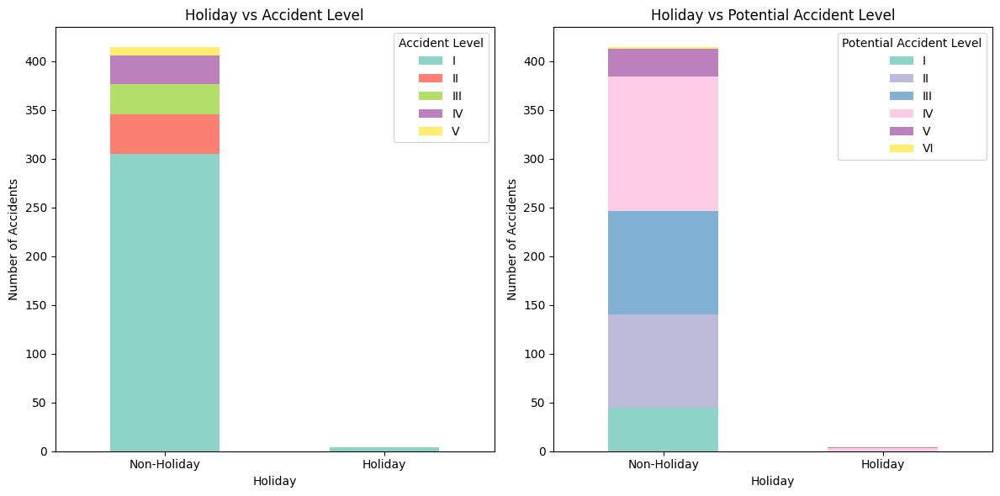

In [ ]:
# @title Accident Level and Potential Accident Level vs Holidays and Non Holidays.

# Group the data and count accidents for each combination
holiday_accidents = ISH_df_preprocess.groupby(['Holiday', 'Accident Level'])['Accident Level'].count().unstack().fillna(0)
holiday_potential_accidents = ISH_df_preprocess.groupby(['Holiday', 'Potential Accident Level'])['Potential Accident Level'].count().unstack().fillna(0)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot Holiday vs Accident Level
holiday_accidents.plot(kind='bar', stacked=True, ax=axes[0], cmap='Set3')
axes[0].set_title('Holiday vs Accident Level')
axes[0].set_xlabel('Holiday')
axes[0].set_ylabel('Number of Accidents')
axes[0].set_xticklabels(['Non-Holiday', 'Holiday'], rotation=0)

# Plot Holiday vs Potential Accident Level
holiday_potential_accidents.plot(kind='bar', stacked=True, ax=axes[1], cmap='Set3')
axes[1].set_title('Holiday vs Potential Accident Level')
axes[1].set_xlabel('Holiday')
axes[1].set_ylabel('Number of Accidents')
axes[1].set_xticklabels(['Non-Holiday', 'Holiday'], rotation=0)

plt.tight_layout()
plt.show()

### **Observations:**

**Holiday vs Accident Level:**
1. The number of accidents is significantly higher on non-holidays compared to holidays.
2. This suggests that work-related activities on regular days contribute more to accidents than activities during holidays.
3. The distribution of accident levels remains similar on both holidays and non-holidays, with Level I accidents being the most frequent.

**Holiday vs Potential Accident Level:**
1. Similar to actual accidents, the potential for accidents is also higher on non-holidays.
2. This reinforces the idea that regular workdays pose a greater risk compared to holidays.
3. The distribution of potential accident levels is consistent across holidays and non-holidays, with Level I being the most common potential level.

**Overall:**

1. Holidays seem to be associated with a lower risk of both actual and potential accidents compared to non-holidays.
2. This could be attributed to reduced work activities, lower traffic, and potentially increased awareness and caution during holidays.


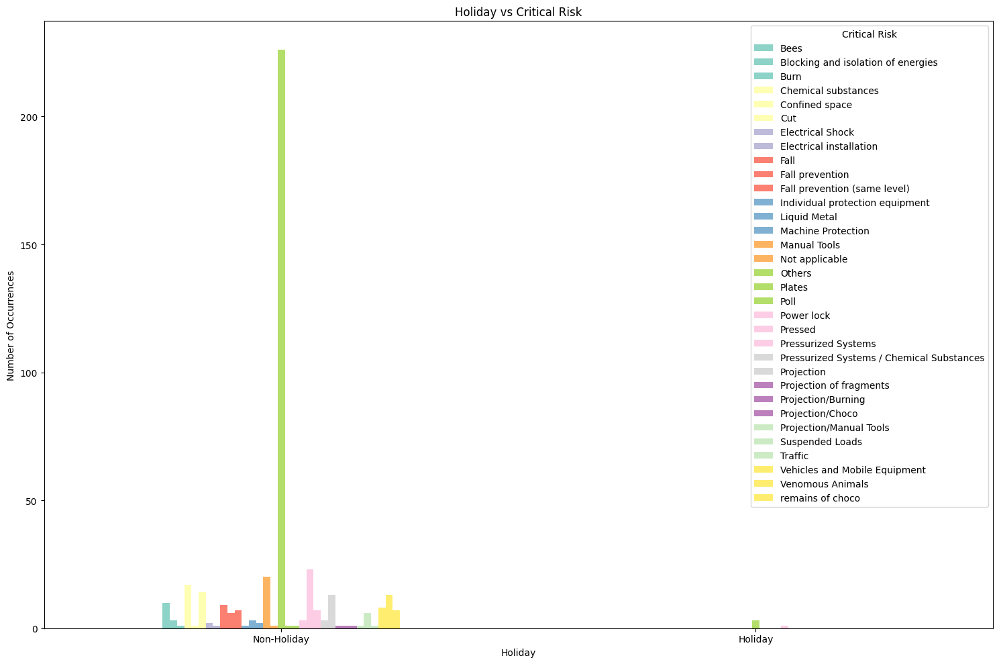

In [ ]:
# @title Critical Risks vs Holidays and Non Holidays.

# Group the data and count accidents for each combination
holiday_critical_risks = ISH_df_preprocess.groupby(['Holiday', 'Critical Risk'])['Critical Risk'].count().unstack().fillna(0)

# Plot Holiday vs Critical Risk using a grouped bar chart
holiday_critical_risks.plot(kind='bar', figsize=(15, 10), cmap='Set3')
plt.title('Holiday vs Critical Risk')
plt.xlabel('Holiday')
plt.ylabel('Number of Occurrences')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'], rotation=0)
plt.tight_layout()
plt.show()

### **Observations:**

**Environmental Risk:**
1. It is the most prevalent critical risk on both holidays and non-holidays, indicating a consistent concern for environmental impact regardless of the day.
2. The number of occurrences is significantly higher on non-holidays, suggesting that regular work activities contribute more to environmental risks.

**Health and Safety Risk:**
1. It is the second most common critical risk, with a higher number of occurrences on non-holidays.
2. This suggests that work-related activities pose a greater risk to health and safety compared to holidays.

**Process Safety Risk:**
1. It shows a similar pattern, with more occurrences on non-holidays, indicating a higher risk associated with regular work processes.

**Other Risks:**
1. Other critical risks, such as Asset Integrity, Security, and Reputation, are less frequent but still present on both holidays and non-holidays.

**Overall:**
1. The plot highlights that holidays generally have a lower number of critical risk occurrences compared to non-holidays.
2. This could be attributed to reduced work activities, lower traffic, and potentially increased awareness and caution during holidays.

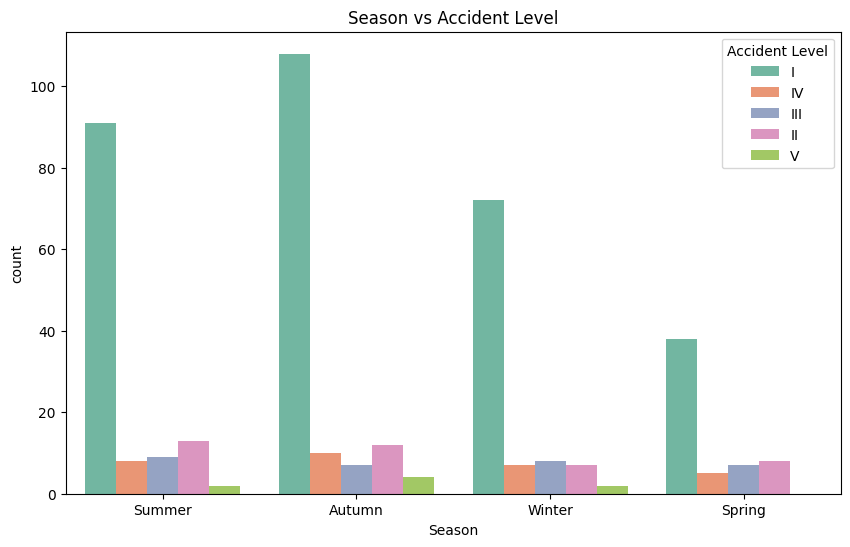

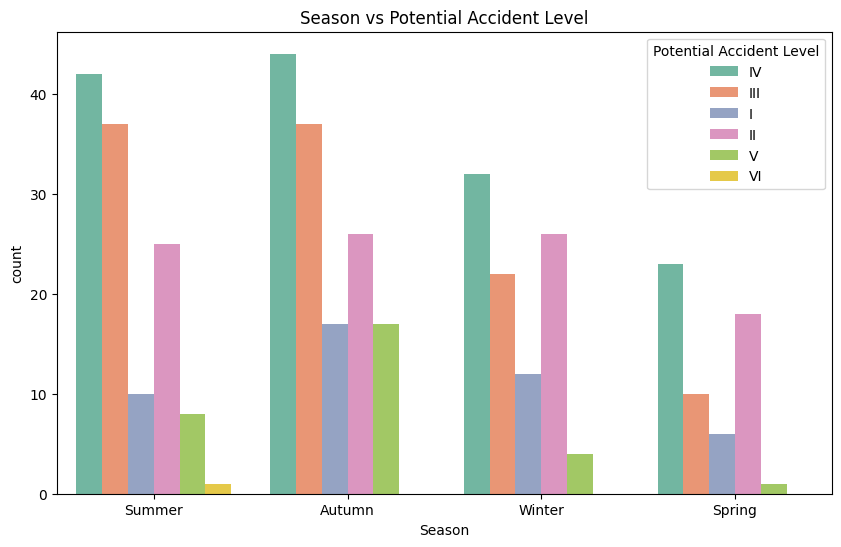

In [ ]:
# @title Season vs Accident Levels, Potential Accident Levels

# Season vs Accident Level
plt.figure(figsize=(10, 6))
sns.countplot(x='Season', hue='Accident Level', data=ISH_df_preprocess, palette='Set2')
plt.title('Season vs Accident Level')
plt.show()

# Season vs Potential Accident Level
plt.figure(figsize=(10, 6))
sns.countplot(x='Season', hue='Potential Accident Level', data=ISH_df_preprocess, palette='Set2')
plt.title('Season vs Potential Accident Level')
plt.show()

### **Observations:**

**Season vs Accident Level:**
1. Accidents seem to be fairly evenly distributed across seasons, with a slight increase in Autumn.
2 This suggests that seasonal factors might not play a major role in the overall occurrence of accidents.
3. However, it's worth investigating if specific types of accidents are more prevalent in certain seasons.

**Season vs Potential Accident Level:**
1. Similar to the previous plot, the distribution of potential accident levels appears relatively consistent across seasons.
2. This indicates that the potential severity of accidents is not strongly influenced by seasonal factors.

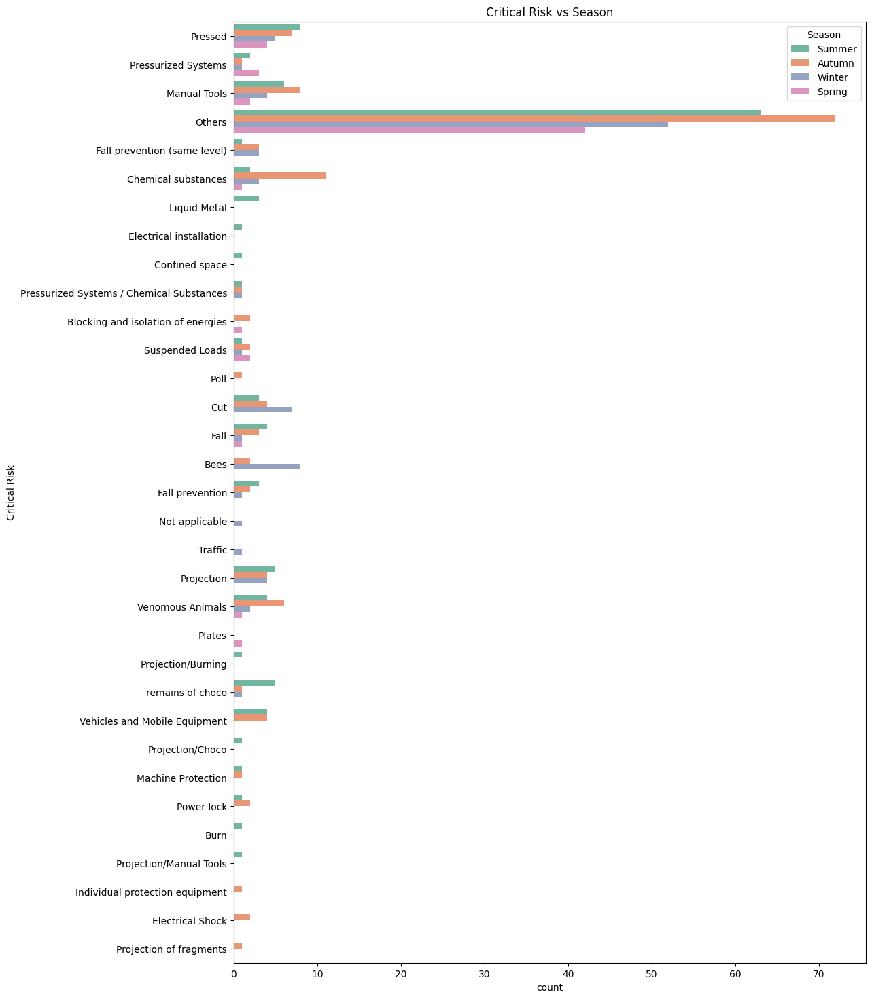

In [ ]:
# @title Season vs Critical Risk
plt.figure(figsize=(12, 18))
sns.countplot(y='Critical Risk', hue='Season', data=ISH_df_preprocess, palette='Set2')
plt.title('Critical Risk vs Season')
plt.show()

### **Observations:**

**Critical Risk vs Season:**
1. Environmental risk remains the most frequently cited critical risk across all seasons.
2. Health and safety risks are slightly more prevalent in Autumn and Winter, potentially due to weather conditions or seasonal activities.
3. Process safety risks show a slight increase in Spring, possibly related to increased production or maintenance activities after the winter period.

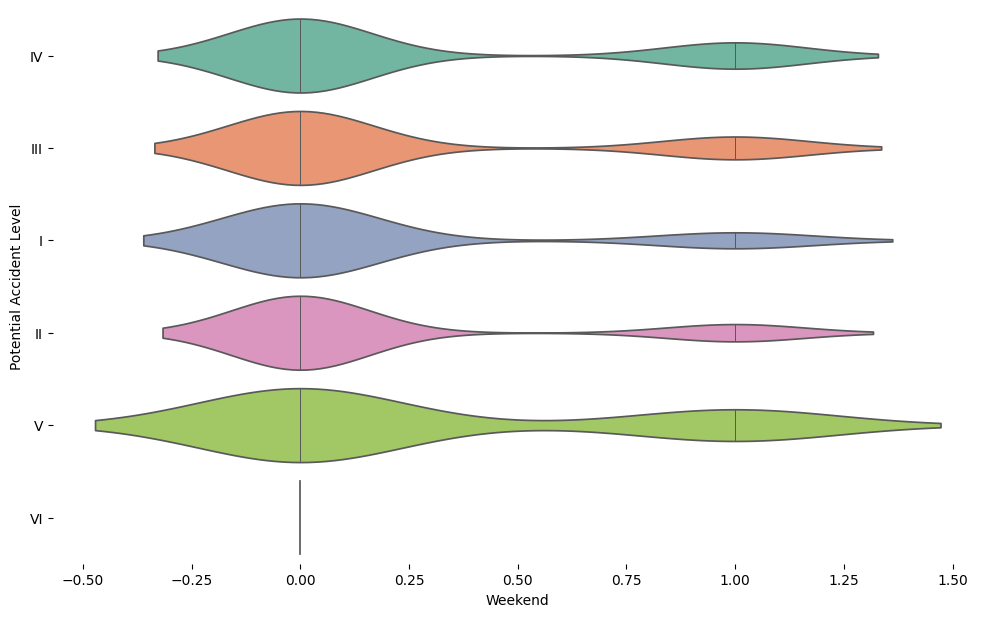

In [ ]:
# @title Potential Accident Level vs Weekend

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(ISH_df_preprocess['Potential Accident Level'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(ISH_df_preprocess, x='Weekend', y='Potential Accident Level', inner='stick', palette='Set2')
sns.despine(top=True, right=True, bottom=True, left=True)

### **Observations:**

**Weekends vs Weekdays:**
1. The distribution of potential accident levels appears relatively similar between weekends and weekdays.
2. There isn't a strong indication that weekends have a significantly higher or lower likelihood of accidents with a certain potential severity level compared to weekdays.

**Potential Accident Level I:**
1. It is the most frequent potential accident level for both weekends and weekdays, suggesting that most incidents, regardless of the day of the week, have a low potential for severe consequences.

**Higher Potential Accident Levels:**
1. Potential accident levels III to VI are less frequent but present on both weekends and weekdays.
2. This indicates that the possibility of more severe accidents exists throughout the week, although the likelihood is generally lower.

**Further Analysis:**
1. While the violin plot provides a general overview, further statistical analysis might be needed to confirm whether there are any statistically significant differences in the distribution of potential accident levels between weekends and weekdays.

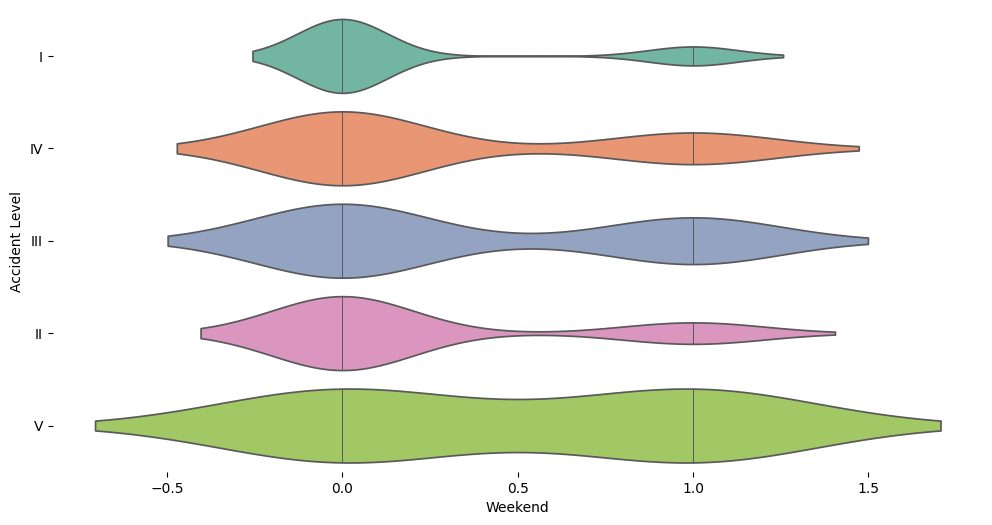

In [ ]:
# @title Accident Level vs Weekend

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(ISH_df_preprocess['Accident Level'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(ISH_df_preprocess, x='Weekend', y='Accident Level', inner='stick', palette='Set2')
sns.despine(top=True, right=True, bottom=True, left=True)

### **Observations:**

**Weekend vs Weekday Accidents:**
1. The distribution of accident levels appears to be relatively similar between weekends (1) and weekdays (0).
2. This suggests that the occurrence of accidents is not significantly influenced by whether it's a weekend or a weekday.

**Consistent Severity:**
1. The spread of accident levels across both weekends and weekdays indicates that accidents of varying severity can happen on any day of the week.

**Potential Factors:**
1. While the day of the week might not be a major determining factor, other factors such as work processes, human behavior, and equipment condition could contribute to accidents regardless of the day.

Based on the provided visualizations and analysis, the following attributes appear to have minimal impact and could potentially be dropped:

1. **Weekend:** The analysis suggests that the occurrence and severity of accidents are not significantly influenced by whether it's a weekend or a weekday.

2. **Season:** While there are some minor variations in critical risks across
seasons, the overall distribution of accidents and their potential severity
appear relatively consistent across seasons.

In [ ]:
# Dropping Season and Weekend

ISH_df_preprocess = ISH_df_preprocess.drop(['Season', 'Weekend', 'Holiday'], axis=1)

In [ ]:
ISH_df_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,DayOfWeek,Year,Month,Day
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",4,2016,1,1
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",5,2016,1,2
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",2,2016,1,6
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury.",4,2016,1,8
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described.",6,2016,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,Country_01,City_04,Mining,I,III,Male,Third Party,Others,"Being approximately 5:00 a.m. approximately, when lifting the Kelly HQ towards the pulley of the frame to align it, the assistant Marco that is in the later one is struck the hand against the frame generating the injury.",1,2017,7,4
421,Country_01,City_03,Mining,I,II,Female,Employee,Others,"The collaborator moved from the infrastructure office (Julio to the toilets, when the pin of the right shoe is hooked on the bra of the left shoe causing not to take the step and fall untimely, causing injury described.",1,2017,7,4
422,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,"During the environmental monitoring activity in the area, the employee was surprised by a swarming swarm of weevils. During the exit of the place, endured suffering two stings, being one in the face and the other in the middle finger of the left hand.",2,2017,7,5
423,Country_02,City_05,Metals,I,II,Male,Employee,Cut,"The Employee performed the activity of stripping cathodes, when pulling the cathode sheet his hand hit the side of another cathode, causing a blunt cut on his 2nd finger of the left hand.",3,2017,7,6


**Pre NLP check for frequently occuring Words and Phrases**

In [ ]:
ISH_df_preprocess.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/ISH_df_preprocess.csv', index=False)

In [ ]:
from collections import Counter
import re
import nltk
from nltk.corpus import stopwords

# Ensure stopwords are downloaded
nltk.download('stopwords')

# Function to clean and tokenize descriptions
def tokenize(text):
    # Use a regular expression to find words that are purely alphabetic
    tokens = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    # Filter out stopwords
    stop_words = set(stopwords.words('english'))
    return [word for word in tokens if word not in stop_words]

# Assuming ISH_df_preprocess['Description'] contains the descriptions
# Tokenize each description and create a flat list of all words
all_words = [word for description in ISH_df_preprocess['Description'] for word in tokenize(description)]

# Count the frequency of each word
word_counts = Counter(all_words)

# Display the most common words to get insights for categorizing accidents
word_counts.most_common(50)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


[('causing', 166),
 ('hand', 163),
 ('employee', 156),
 ('left', 155),
 ('right', 154),
 ('operator', 126),
 ('injury', 104),
 ('time', 101),
 ('activity', 91),
 ('area', 80),
 ('moment', 78),
 ('equipment', 77),
 ('work', 76),
 ('accident', 73),
 ('collaborator', 71),
 ('level', 70),
 ('worker', 70),
 ('assistant', 68),
 ('finger', 68),
 ('pipe', 67),
 ('one', 65),
 ('floor', 65),
 ('support', 58),
 ('mesh', 58),
 ('rock', 54),
 ('safety', 53),
 ('mr', 53),
 ('approximately', 50),
 ('meters', 47),
 ('height', 46),
 ('described', 45),
 ('part', 44),
 ('team', 44),
 ('side', 43),
 ('injured', 42),
 ('truck', 42),
 ('face', 42),
 ('used', 42),
 ('kg', 40),
 ('circumstances', 39),
 ('cut', 39),
 ('gloves', 39),
 ('pump', 38),
 ('hit', 38),
 ('metal', 38),
 ('performing', 37),
 ('medical', 37),
 ('towards', 37),
 ('using', 35),
 ('made', 34)]

In [ ]:
# Function to tokenize descriptions, filtering out numbers and special characters
def tokenize(text):
    # Regular expression to find words that are purely alphabetic
    tokens = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    # Filter out stopwords
    stop_words = set(stopwords.words('english'))
    return [word for word in tokens if word not in stop_words]

# Function to find phrases that might indicate new categories
def find_phrases(text, length=2):
    tokens = tokenize(text)
    return [' '.join(tokens[i:i+length]) for i in range(len(tokens) - length + 1)]

# Assuming ISH_df_preprocess['Description'] contains the descriptions
# Generate bi-grams (two-word phrases) from descriptions
bi_grams = [phrase for description in ISH_df_preprocess['Description'] for phrase in find_phrases(description, 2)]

# Count the frequency of each bi-gram
bi_gram_counts = Counter(bi_grams)

# Display the most common bi-grams to get insights for new categorizing accidents
bi_gram_counts.most_common(50)

[('left hand', 70),
 ('right hand', 57),
 ('time accident', 56),
 ('causing injury', 51),
 ('finger left', 22),
 ('employee reports', 22),
 ('injury described', 18),
 ('medical center', 17),
 ('described injury', 17),
 ('left foot', 15),
 ('injured person', 15),
 ('hand causing', 14),
 ('support mesh', 14),
 ('injury time', 14),
 ('right side', 13),
 ('finger right', 13),
 ('da silva', 13),
 ('allergic reaction', 13),
 ('right leg', 11),
 ('safety gloves', 11),
 ('made use', 10),
 ('fragment rock', 10),
 ('wearing safety', 10),
 ('time event', 10),
 ('right foot', 9),
 ('split set', 9),
 ('upper part', 9),
 ('left leg', 9),
 ('middle finger', 9),
 ('height meters', 9),
 ('ring finger', 9),
 ('left side', 9),
 ('accident employee', 9),
 ('weight kg', 8),
 ('generating injury', 8),
 ('causing cut', 8),
 ('generating described', 8),
 ('metal structure', 8),
 ('work area', 8),
 ('kg weight', 7),
 ('transferred medical', 7),
 ('master loader', 7),
 ('worker wearing', 7),
 ('index finger', 7

In [ ]:
# Function to tokenize descriptions, filtering out numbers and special characters
def tokenize(text):
    # Regular expression to find words that are purely alphabetic
    tokens = re.findall(r'\b[a-zA-Z]+\b', text.lower())
    # Filter out stopwords
    stop_words = set(stopwords.words('english'))
    return [word for word in tokens if word not in stop_words]

# Function to find phrases that might indicate new categories
def find_phrases(text, length=3):  # Adjust length default to 3 for trigrams
    tokens = tokenize(text)
    return [' '.join(tokens[i:i+length]) for i in range(len(tokens) - length + 1)]

# Assuming ISH_df_preprocess['Description'] contains the descriptions
# Generate trigrams (three-word phrases) from descriptions
tri_grams = [phrase for description in ISH_df_preprocess['Description'] for phrase in find_phrases(description)]

# Count the frequency of each trigram
tri_gram_counts = Counter(tri_grams)

# Display the most common trigrams to get insights for new categorizing accidents
tri_gram_counts.most_common(50)

[('finger left hand', 21),
 ('causing injury described', 13),
 ('finger right hand', 13),
 ('injury time accident', 13),
 ('generating described injury', 8),
 ('time accident employee', 8),
 ('hand causing injury', 7),
 ('described time accident', 7),
 ('left hand causing', 6),
 ('right hand causing', 6),
 ('back right hand', 5),
 ('worker wearing safety', 5),
 ('causing described injury', 5),
 ('cm x cm', 5),
 ('causing injury time', 5),
 ('returned normal activities', 5),
 ('manoel da silva', 5),
 ('approximately nv cx', 4),
 ('time accident worker', 4),
 ('accident worker wearing', 4),
 ('wearing safety gloves', 4),
 ('medical center attention', 4),
 ('made use safety', 4),
 ('used safety glasses', 4),
 ('generating injury time', 4),
 ('described injury time', 4),
 ('thermal recovery boiler', 4),
 ('verified type allergic', 4),
 ('type allergic reaction', 4),
 ('allergic reaction returned', 4),
 ('reaction returned normal', 4),
 ('generating lesion described', 4),
 ('place clerk wea

##### Wordclouds for Unigrams, Bigrams and Trigrams for Pre NLP data

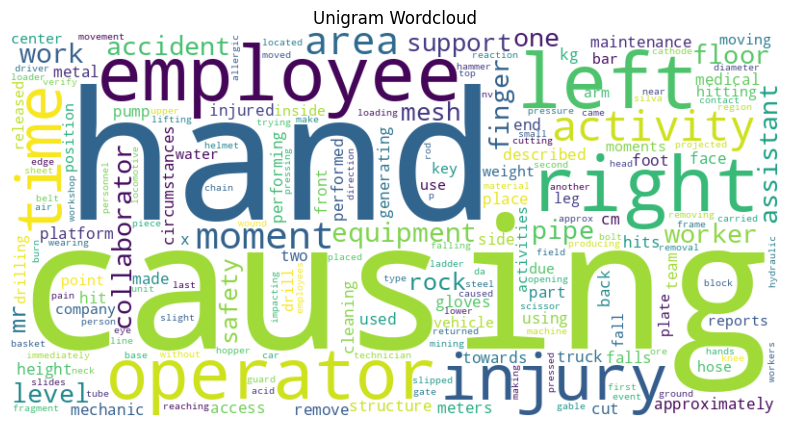

<Figure size 640x480 with 0 Axes>

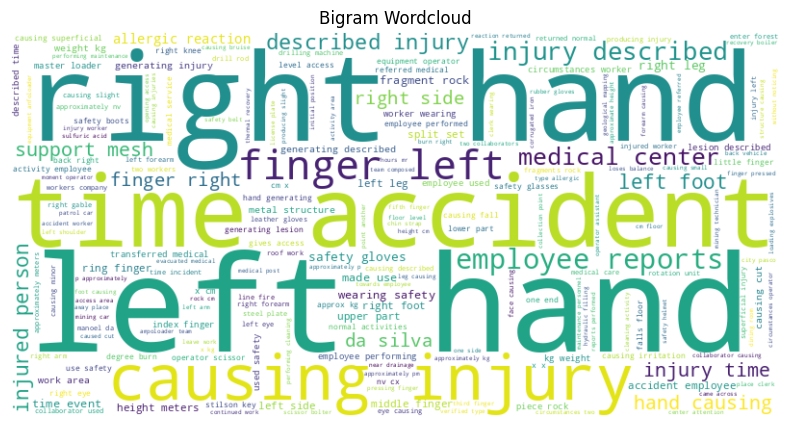

<Figure size 640x480 with 0 Axes>

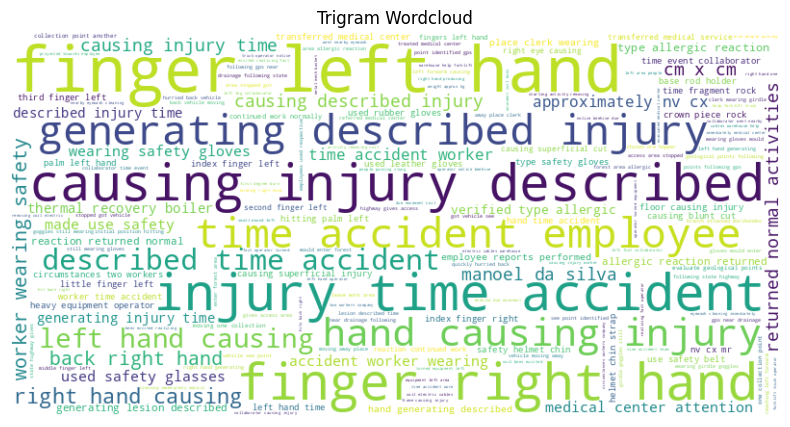

In [ ]:
from wordcloud import WordCloud

# Create wordcloud for unigrams
wordcloud_unigrams = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

# Create wordcloud for bigrams
wordcloud_bigrams = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(bi_gram_counts)

# Create wordcloud for trigrams
wordcloud_trigrams = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(tri_gram_counts)

# Display the generated wordclouds
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_unigrams, interpolation='bilinear')
plt.axis("off")
plt.title("Unigram Wordcloud")
plt.show()

plt.subplots_adjust(hspace=1)  # Adjust vertical spacing

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_bigrams, interpolation='bilinear')
plt.axis("off")
plt.title("Bigram Wordcloud")
plt.show()

plt.subplots_adjust(hspace=1)  # Adjust vertical spacing

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_trigrams, interpolation='bilinear')
plt.axis("off")
plt.title("Trigram Wordcloud")
plt.show()

### **Data preprocessing (NLP Preprocessing techniques)**

In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import string

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
# Load the dataset
ISH_NLP_preprocess = pd.read_csv('/content/drive/My Drive/Capstone_Group10_NLP1/ISH_df_preprocess.csv')

# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()

    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords and lemmatize
    cleaned_tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]

    # Join the tokens back into a string
    cleaned_text = ' '.join(cleaned_tokens)

    return cleaned_text

# Apply preprocessing to the Description column
ISH_NLP_preprocess['Cleaned_Description'] = ISH_NLP_preprocess['Description'].apply(preprocess_text)

# Display the first few rows of the original and cleaned descriptions
ISH_NLP_preprocess[['Description', 'Cleaned_Description']].head()

# Save the number of words before and after cleaning
ISH_NLP_preprocess['Original_Word_Count'] = ISH_NLP_preprocess['Description'].apply(lambda x: len(str(x).split()))
ISH_NLP_preprocess['Cleaned_Word_Count'] = ISH_NLP_preprocess['Cleaned_Description'].apply(lambda x: len(str(x).split()))

In [ ]:
ISH_NLP_preprocess[['Description', 'Cleaned_Description']].head()

,Description,Cleaned_Description
0,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo
1,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter
2,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury
3,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury.",approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury
4,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described.",approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance meter high hit instep right foot worker causing injury described


In [ ]:
ISH_NLP_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,Description,DayOfWeek,Year,Month,Day,Cleaned_Description,Original_Word_Count,Cleaned_Word_Count
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,"While removing the drill rod of the Jumbo 08 for maintenance, the supervisor proceeds to loosen the support of the intermediate centralizer to facilitate the removal, seeing this the mechanic supports one end on the drill of the equipment to pull with both hands the bar and accelerate the removal from this, at this moment the bar slides from its point of support and tightens the fingers of the mechanic between the drilling bar and the beam of the jumbo.",4,2016,1,1,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo,80,37
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,"During the activation of a sodium sulphide pump, the piping was uncoupled and the sulfide solution was designed in the area to reach the maid. Immediately she made use of the emergency shower and was directed to the ambulatory doctor and later to the hospital. Note: of sulphide solution = 48 grams / liter.",5,2016,1,2,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter,54,27
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,"In the sub-station MILPO located at level +170 when the collaborator was doing the excavation work with a pick (hand tool), hitting a rock with the flat part of the beak, it bounces off hitting the steel tip of the safety shoe and then the metatarsal area of ​​the left foot of the collaborator causing the injury.",2,2016,1,6,substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury,57,28
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,"Being 9:45 am. approximately in the Nv. 1880 CX-695 OB7, the personnel begins the task of unlocking the Soquet bolts of the BHB machine, when they were in the penultimate bolt they identified that the hexagonal head was worn, proceeding Mr. Cristóbal - Auxiliary assistant to climb to the platform to exert pressure with your hand on the ""DADO"" key, to prevent it from coming out of the bolt; in those moments two collaborators rotate with the lever in anti-clockwise direction, leaving the key of the bolt, hitting the palm of the left hand, causing the injury.",4,2016,1,8,approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury,97,49
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,"Approximately at 11:45 a.m. in circumstances that the mechanics Anthony (group leader), Eduardo and Eric Fernández-injured-the three of the Company IMPROMEC, performed the removal of the pulley of the motor of the pump 3015 in the ZAF of Marcy. 27 cm / Length: 33 cm / Weight: 70 kg), as it was locked proceed to heating the pulley to loosen it, it comes out and falls from a distance of 1.06 meters high and hits the instep of the right foot of the worker, causing the injury described.",6,2016,1,10,approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance m

In [ ]:
# Calculate and print the average word count before and after cleaning
avg_original = ISH_NLP_preprocess['Original_Word_Count'].mean()
avg_cleaned = ISH_NLP_preprocess['Cleaned_Word_Count'].mean()
print(f"\nAverage word count before cleaning: {avg_original:.2f}")
print(f"Average word count after cleaning: {avg_cleaned:.2f}")
print(f"Reduction in words: {(avg_original - avg_cleaned) / avg_original * 100:.2f}%")


Average word count before cleaning: 65.06
Average word count after cleaning: 32.80
Reduction in words: 49.58%


In [ ]:
# Removing the repetitive and unnecessary columns which is not required for analysis

Unnecessary_Columns = ['Description','Original_Word_Count','Cleaned_Word_Count']

# Drop unnecessary columns
ISH_NLP_preprocess = ISH_NLP_preprocess.drop(Unnecessary_Columns, axis=1)

ISH_NLP_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,Month,Day,Cleaned_Description
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,1,1,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,1,2,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,1,6,substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,1,8,approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,1,10,approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance meter high hit instep right foot worker causing injury described
...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,7,4,approximately approximately lifting kelly hq towards pulley frame align assistant marco later one struck hand frame generating injury
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,7,4,collaborator moved infrastructure office julio toilet pin right shoe hooked bra left shoe causing take step fall untimely causing injury described
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,7,5,environmental monitoring activity area employee surprised swarming swarm weevil exit place endured suffering two sting one face middle finger left hand
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,7,6,employee performed activity stripping cathode pulling cathode sheet hand hit side another cathode causing blunt cut nd finger left hand


In [ ]:
# Rename Cleaned Desription to Description

ISH_NLP_preprocess = ISH_NLP_preprocess.rename(columns={'Cleaned_Description': 'Description'})
ISH_NLP_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,Month,Day,Description
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,1,1,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,1,2,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,1,6,substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,1,8,approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,1,10,approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance meter high hit instep right foot worker causing injury described
...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,7,4,approximately approximately lifting kelly hq towards pulley frame align assistant marco later one struck hand frame generating injury
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,7,4,collaborator moved infrastructure office julio toilet pin right shoe hooked bra left shoe causing take step fall untimely causing injury described
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,7,5,environmental monitoring activity area employee surprised swarming swarm weevil exit place endured suffering two sting one face middle finger left hand
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,7,6,employee performed activity stripping cathode pulling cathode sheet hand hit side another cathode causing blunt cut nd finger left hand


In [ ]:
# Save the preprocessed data
ISH_NLP_preprocess.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/ISH_NLP_preprocess.csv', index=False)

In [ ]:
from collections import Counter

# Load the preprocessed data
ISH_NLP_preprocess = pd.read_csv('/content/drive/My Drive/Capstone_Group10_NLP1/ISH_NLP_preprocess.csv')

# Combine all descriptions into a single string
all_text = ' '.join(ISH_NLP_preprocess['Description'].astype(str))

# Tokenize the combined text
tokens = word_tokenize(all_text)

# Calculate token distribution
token_counts = Counter(tokens)

# Create a dataframe from the most common words
top_words_df = pd.DataFrame(token_counts.most_common(30), columns=['Word', 'Count'])

# Display the dataframe
top_words_df

,Word,Count
0,hand,177
1,employee,172
2,causing,166
3,left,155
4,right,154
5,operator,132
6,activity,117
7,time,112
8,injury,110
9,moment,101


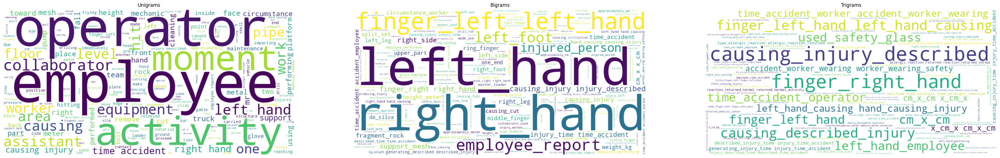

In [ ]:
# @title Wordcloud for N-Grams

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all descriptions into a single string
all_text = ' '.join(ISH_NLP_preprocess['Description'].astype(str))

# Generate word cloud for unigrams
wordcloud_unigrams = WordCloud(width=800, height=400, background_color='white').generate(all_text)

# Generate word cloud for bigrams
bigrams = nltk.bigrams(word_tokenize(all_text))
bigram_text = ' '.join(['_'.join(bigram) for bigram in bigrams])
wordcloud_bigrams = WordCloud(width=800, height=400, background_color='white').generate(bigram_text)

# Generate word cloud for trigrams
trigrams = nltk.trigrams(word_tokenize(all_text))
trigram_text = ' '.join(['_'.join(trigram) for trigram in trigrams])
wordcloud_trigrams = WordCloud(width=800, height=400, background_color='white').generate(trigram_text)

# Display the word clouds
plt.figure(figsize=(45, 15))
plt.subplot(1, 3, 1)
plt.imshow(wordcloud_unigrams, interpolation='bilinear')
plt.title('Unigrams')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(wordcloud_bigrams, interpolation='bilinear')
plt.title('Bigrams')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(wordcloud_trigrams, interpolation='bilinear')
plt.title('Trigrams')
plt.axis('off')

plt.show()

### **Observations:**

**Unigrams:**

1. Key words include "moment," "employee," "floor," "equipment," "assistant," "left," and "hand."
2. These suggest an incident involving an employee and equipment on a specific floor.
3. Words like "collaboration," "injury," and "support" indicate teamwork and possibly injury response.
4. "Left" near "hand" points to a body part, likely in a workplace injury report.
5. This might relate to a safety analysis or accident report in an industrial setting.

**Bigrams:**

1. Frequent bigrams like "left hand" and "right hand" indicate a focus on hand and finger injuries.
2. This suggests frequent hand-related injuries in the analyzed data or reports.
3. Other terms like "left leg" and "left foot" appear but are less common.
4. Phrases like "causing injury" and "employee performing" point to work-related injuries.
5. Terms such as "causing cut" and "causing fall" highlight common injury mechanisms.

**Trigrams:**

1. Trigrams like "left hand causing" and "finger left hand" focus on injuries to the left hand or fingers.
2. Phrases like "used safety glass" suggest the involvement of specific safety measures.
3. The emphasis on hands and fingers shows their vulnerability in the workplace.
The analysis details injury causes and is useful for prevention.
4. Words like "operator" and "employee" next to "accident" and "injury" emphasize roles in safety protocols.

**Overall:**

1. N-grams analysis offers insights into key themes and patterns in incident reports.
2. It identifies accident contributors and areas for safety improvement.
3. The findings could help develop interventions to enhance workplace safety.

In [ ]:
ISH_NLP_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,Month,Day,Description
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,1,1,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,1,2,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,1,6,substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,1,8,approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,1,10,approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance meter high hit instep right foot worker causing injury described
...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,7,4,approximately approximately lifting kelly hq towards pulley frame align assistant marco later one struck hand frame generating injury
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,7,4,collaborator moved infrastructure office julio toilet pin right shoe hooked bra left shoe causing take step fall untimely causing injury described
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,7,5,environmental monitoring activity area employee surprised swarming swarm weevil exit place endured suffering two sting one face middle finger left hand
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,7,6,employee performed activity stripping cathode pulling cathode sheet hand hit side another cathode causing blunt cut nd finger left hand


In [ ]:
import pandas as pd
import re

# Function to preprocess and tokenize descriptions
def preprocess_and_tokenize(description):
    # Convert to lowercase
    description = description.lower()
    # Remove punctuation and non-alphabetic characters
    description = re.sub(r'[^a-z\s]', '', description)
    # Tokenize (split by whitespace)
    words = description.split()
    return words

# Apply the preprocessing function
ISH_NLP_preprocess['tokenized_words'] = ISH_NLP_preprocess['Description'].apply(preprocess_and_tokenize)

In [ ]:
ISH_NLP_preprocess

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,Month,Day,Description,tokenized_words
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,1,1,removing drill rod jumbo maintenance supervisor proceeds loosen support intermediate centralizer facilitate removal seeing mechanic support one end drill equipment pull hand bar accelerate removal moment bar slide point support tightens finger mechanic drilling bar beam jumbo,"[removing, drill, rod, jumbo, maintenance, supervisor, proceeds, loosen, support, intermediate, centralizer, facilitate, removal, seeing, mechanic, support, one, end, drill, equipment, pull, hand, bar, accelerate, removal, moment, bar, slide, point, support, tightens, finger, mechanic, drilling, bar, beam, jumbo]"
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,1,2,activation sodium sulphide pump piping uncoupled sulfide solution designed area reach maid immediately made use emergency shower directed ambulatory doctor later hospital note sulphide solution gram liter,"[activation, sodium, sulphide, pump, piping, uncoupled, sulfide, solution, designed, area, reach, maid, immediately, made, use, emergency, shower, directed, ambulatory, doctor, later, hospital, note, sulphide, solution, gram, liter]"
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,1,6,substation milpo located level collaborator excavation work pick hand tool hitting rock flat part beak bounce hitting steel tip safety shoe metatarsal area left foot collaborator causing injury,"[substation, milpo, located, level, collaborator, excavation, work, pick, hand, tool, hitting, rock, flat, part, beak, bounce, hitting, steel, tip, safety, shoe, metatarsal, area, left, foot, collaborator, causing, injury]"
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,1,8,approximately nv cx ob personnel begin task unlocking soquet bolt bhb machine penultimate bolt identified hexagonal head worn proceeding mr cristbal auxiliary assistant climb platform exert pressure hand dado key prevent coming bolt moment two collaborator rotate lever anticlockwise direction leaving key bolt hitting palm left hand causing injury,"[approximately, nv, cx, ob, personnel, begin, task, unlocking, soquet, bolt, bhb, machine, penultimate, bolt, identified, hexagonal, head, worn, proceeding, mr, cristbal, auxiliary, assistant, climb, platform, exert, pressure, hand, dado, key, prevent, coming, bolt, moment, two, collaborator, rotate, lever, anticlockwise, direction, leaving, key, bolt, hitting, palm, left, hand, causing, injury]"
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,1,10,approximately circumstance mechanic anthony group leader eduardo eric fernndezinjuredthe three company impromec performed removal pulley motor pump zaf marcy cm length cm weight kg locked proceed heating pulley loosen come fall distance meter high hit instep right foot worker causing injury described,"[approximately, circumstance, mechanic, anthony, group, leader, eduardo, eric, fernndezinjuredthe, three, company, impromec, performed, removal, pulley, motor, pump, zaf, marcy, cm, length, cm, weight, kg, locked, proceed, heating, pulley, loosen, come, fall, distance, meter, high, hit, instep, right, foot, worker, causing, injury, described]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,7,4,approximately approximately lifting kelly hq towards pulley frame align assistant marco later one struck hand frame generating injury,"[approximately, approximately, lifting, kelly, hq, towards, pulley, frame, align, assistant, marco, later, one, struck, hand, frame, generating, injury]"
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,7,4,collaborator moved infrastructure office julio toilet pin right shoe hooked bra left shoe causing take step fall untimely causing inj

In [ ]:
ISH_NLP_preprocess.shape

(418, 14)

In [ ]:
ISH_NLP_preprocess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Country                   418 non-null    object
 1   City                      418 non-null    object
 2   Industry Sector           418 non-null    object
 3   Accident Level            418 non-null    object
 4   Potential Accident Level  418 non-null    object
 5   Gender                    418 non-null    object
 6   Employee Type             418 non-null    object
 7   Critical Risk             418 non-null    object
 8   DayOfWeek                 418 non-null    int64 
 9   Year                      418 non-null    int64 
 10  Month                     418 non-null    int64 
 11  Day                       418 non-null    int64 
 12  Description               418 non-null    object
 13  tokenized_words           418 non-null    object
dtypes: int64(4), object(10)
me

In [ ]:
ISH_NLP_preprocess1 = ISH_NLP_preprocess.copy()

Generating Word Embeddings over 'Description' column using **Glove, TFI-DF and Word2Vec**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess

def generate_embedding_dataframes(df):
    df1 = df.copy()
    df2 = df.copy()
    df3 = df.copy()

    # 1. GloVe Embeddings
    def load_glove_model(glove_file):
        embedding_dict = {}
        with open(glove_file, 'r', encoding="utf8") as f:
            for line in f:
                values = line.split()
                word = values[0]
                vector = np.asarray(values[1:], "float32")
                embedding_dict[word] = vector
        return embedding_dict

    def get_average_glove_embeddings(tokenized_words, embedding_dict, embedding_dim=300):
        embeddings = [embedding_dict.get(word, np.zeros(embedding_dim)) for word in tokenized_words]
        return np.mean(embeddings, axis=0) if embeddings else np.zeros(embedding_dim)

    # Load GloVe model and generate GloVe embeddings
    glove_file = '/content/drive/MyDrive/Capstone_Group10_NLP1/glove.6B/glove.6B.300d.txt'
    glove_embeddings = load_glove_model(glove_file)

    glove_embeddings_series = df1['tokenized_words'].apply(lambda words: get_average_glove_embeddings(words, glove_embeddings))
    ISH_NLP_Glove_df = pd.concat([df1.drop(columns=['tokenized_words']), pd.DataFrame(glove_embeddings_series.tolist(), columns=[f'GloVe_{i}' for i in range(300)])], axis=1)

    # 2. TF-IDF Features
    tfidf_vectorizer = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False, token_pattern=None)
    tfidf_matrix = tfidf_vectorizer.fit_transform(df2['tokenized_words'])

    # Create a DataFrame with TF-IDF features
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
    ISH_NLP_TFIDF_df = pd.concat([df2.drop(columns=['tokenized_words']), tfidf_df], axis=1)

    # 3. Word2Vec Embeddings
    word2vec_model = Word2Vec(sentences=df3['tokenized_words'], vector_size=300, window=5, min_count=1, workers=4)

    def get_average_word2vec_embeddings(tokenized_words, model, embedding_dim=300):
        embeddings = [model.wv[word] for word in tokenized_words if word in model.wv]
        return np.mean(embeddings, axis=0) if embeddings else np.zeros(embedding_dim)

    word2vec_embeddings_series = df3['tokenized_words'].apply(lambda words: get_average_word2vec_embeddings(words, word2vec_model))
    ISH_NLP_Word2Vec_df = pd.concat([df3.drop(columns=['tokenized_words']), pd.DataFrame(word2vec_embeddings_series.tolist(), columns=[f'Word2Vec_{i}' for i in range(300)])], axis=1)

    return ISH_NLP_Glove_df, ISH_NLP_TFIDF_df, ISH_NLP_Word2Vec_df

# Use the function to generate the DataFrames
ISH_NLP_Glove_df, ISH_NLP_TFIDF_df, ISH_NLP_Word2Vec_df = generate_embedding_dataframes(ISH_NLP_preprocess1)

In [ ]:
ISH_NLP_Glove_df

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,...,GloVe_290,GloVe_291,GloVe_292,GloVe_293,GloVe_294,GloVe_295,GloVe_296,GloVe_297,GloVe_298,GloVe_299
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,...,-0.034536,-0.110637,-0.085788,-0.031955,0.008084,0.205297,-0.001389,-0.296468,-0.061921,-0.003529
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,...,-0.412660,-0.135541,0.049905,0.032907,0.103431,-0.155970,0.078383,-0.218822,-0.099618,-0.053435
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,...,0.005927,-0.135486,-0.016369,0.125184,0.149826,0.194006,0.028868,-0.159949,0.032494,-0.110724
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,...,-0.037377,-0.070661,0.078244,-0.019498,-0.035796,0.246286,-0.105964,-0.115616,-0.050545,-0.049797
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,...,0.103048,-0.080292,0.028120,-0.075642,0.116875,0.247585,-0.008106,-0.106944,-0.074254,-0.087914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,...,-0.048683,-0.039020,-0.071929,-0.091603,0.107000,0.385754,-0.140584,-0.078597,0.143009,-0.130202
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,...,0.049501,-0.147315,0.041269,0.039820,0.083148,0.199192,-0.086235,-0.224753,0.005231,-0.024155
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,...,0.058225,-0.122102,-0.121571,0.074627,0.131929,0.145566,0.031812,0.011314,-0.088791,-0.089753
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,...,-0.095062,-0.107262,0.079336,0.124554,0.068740,0.040127,0.048653,-0.123861,0.090110,-0.117909


In [ ]:
ISH_NLP_TFIDF_df

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,...,yolk,young,z,zaf,zamac,zero,zinc,zinco,zn,zone
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,...,0.0,0.0,0.0,0.200191,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
ISH_NLP_Word2Vec_df

,Country,City,Industry Sector,Accident Level,Potential Accident Level,Gender,Employee Type,Critical Risk,DayOfWeek,Year,...,Word2Vec_290,Word2Vec_291,Word2Vec_292,Word2Vec_293,Word2Vec_294,Word2Vec_295,Word2Vec_296,Word2Vec_297,Word2Vec_298,Word2Vec_299
0,Country_01,City_01,Mining,I,IV,Male,Third Party,Pressed,4,2016,...,-0.000184,0.008809,0.006719,-0.000653,0.008435,0.008823,-0.002145,-0.005005,0.004047,-0.001308
1,Country_02,City_02,Mining,I,IV,Male,Employee,Pressurized Systems,5,2016,...,-0.000224,0.003050,0.002841,-0.000295,0.002847,0.003351,-0.000023,-0.001519,0.001563,0.000062
2,Country_01,City_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,2,2016,...,0.000299,0.009057,0.007054,-0.000644,0.007221,0.010194,-0.001305,-0.004769,0.003950,-0.001413
3,Country_01,City_04,Mining,I,I,Male,Third Party,Others,4,2016,...,-0.000157,0.006961,0.005656,-0.000583,0.006393,0.007921,-0.000922,-0.004311,0.003201,-0.001234
4,Country_01,City_04,Mining,IV,IV,Male,Third Party,Others,6,2016,...,-0.000690,0.007071,0.005584,-0.000388,0.005998,0.007630,-0.001644,-0.003608,0.003611,-0.000547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,Country_01,City_04,Mining,I,III,Male,Third Party,Others,1,2017,...,-0.000250,0.009238,0.005928,-0.000045,0.007040,0.008480,-0.001309,-0.004440,0.003802,-0.001885
414,Country_01,City_03,Mining,I,II,Female,Employee,Others,1,2017,...,0.000451,0.007068,0.005498,-0.001052,0.006713,0.007056,-0.000784,-0.003366,0.003225,-0.000547
415,Country_02,City_09,Metals,I,II,Male,Employee,Venomous Animals,2,2017,...,0.000086,0.008377,0.006045,-0.000146,0.008351,0.009401,-0.001291,-0.005152,0.003886,-0.000631
416,Country_02,City_05,Metals,I,II,Male,Employee,Cut,3,2017,...,-0.001133,0.011386,0.007921,-0.000351,0.011003,0.013270,-0.001504,-0.005928,0.005737,-0.001309


In [ ]:
ISH_NLP_preprocess1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Country                   418 non-null    object
 1   City                      418 non-null    object
 2   Industry Sector           418 non-null    object
 3   Accident Level            418 non-null    object
 4   Potential Accident Level  418 non-null    object
 5   Gender                    418 non-null    object
 6   Employee Type             418 non-null    object
 7   Critical Risk             418 non-null    object
 8   DayOfWeek                 418 non-null    int64 
 9   Year                      418 non-null    int64 
 10  Month                     418 non-null    int64 
 11  Day                       418 non-null    int64 
 12  Description               418 non-null    object
 13  tokenized_words           418 non-null    object
dtypes: int64(4), object(10)
me

In [ ]:
# Print shapes to confirm
print(ISH_NLP_Glove_df.shape)
print(ISH_NLP_TFIDF_df.shape)
print(ISH_NLP_Word2Vec_df.shape)

(418, 313)
(418, 2827)
(418, 313)


##### Check for columns with various datatypes in **ISH_NLP_Glove_df, ISH_NLP_TFIDF_df & ISH_NLP_Word2Vec_df**

In [ ]:
for dtype in ISH_NLP_Glove_df.dtypes.unique():
  print(f"Columns of type {dtype}:")
  print(ISH_NLP_Glove_df.select_dtypes(include=[dtype]).columns.tolist())
  print()

Columns of type object:
['Country', 'City', 'Industry Sector', 'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk', 'Description']

Columns of type int64:
['DayOfWeek', 'Year', 'Month', 'Day']

Columns of type float64:
['GloVe_0', 'GloVe_1', 'GloVe_2', 'GloVe_3', 'GloVe_4', 'GloVe_5', 'GloVe_6', 'GloVe_7', 'GloVe_8', 'GloVe_9', 'GloVe_10', 'GloVe_11', 'GloVe_12', 'GloVe_13', 'GloVe_14', 'GloVe_15', 'GloVe_16', 'GloVe_17', 'GloVe_18', 'GloVe_19', 'GloVe_20', 'GloVe_21', 'GloVe_22', 'GloVe_23', 'GloVe_24', 'GloVe_25', 'GloVe_26', 'GloVe_27', 'GloVe_28', 'GloVe_29', 'GloVe_30', 'GloVe_31', 'GloVe_32', 'GloVe_33', 'GloVe_34', 'GloVe_35', 'GloVe_36', 'GloVe_37', 'GloVe_38', 'GloVe_39', 'GloVe_40', 'GloVe_41', 'GloVe_42', 'GloVe_43', 'GloVe_44', 'GloVe_45', 'GloVe_46', 'GloVe_47', 'GloVe_48', 'GloVe_49', 'GloVe_50', 'GloVe_51', 'GloVe_52', 'GloVe_53', 'GloVe_54', 'GloVe_55', 'GloVe_56', 'GloVe_57', 'GloVe_58', 'GloVe_59', 'GloVe_60', 'GloVe_61', 'GloVe_62

In [ ]:
for dtype in ISH_NLP_TFIDF_df.dtypes.unique():
  print(f"Columns of type {dtype}:")
  print(ISH_NLP_TFIDF_df.select_dtypes(include=[dtype]).columns.tolist())
  print()

Columns of type object:
['Country', 'City', 'Industry Sector', 'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk', 'Description']

Columns of type int64:
['DayOfWeek', 'Year', 'Month', 'Day']

Columns of type float64:
['abb', 'abdomen', 'able', 'abratech', 'abrupt', 'abruptly', 'absorbent', 'absorbing', 'abutment', 'acc', 'accelerate', 'access', 'accessing', 'accessory', 'accident', 'accidentally', 'accidently', 'accommodate', 'accommodated', 'accompanied', 'accompanying', 'according', 'accretion', 'accumulated', 'accumulates', 'accumulating', 'accumulation', 'achieving', 'acid', 'acl', 'acquisition', 'across', 'acted', 'action', 'activated', 'activates', 'activation', 'activity', 'actuating', 'adapted', 'adapter', 'addition', 'additive', 'ademir', 'adhered', 'adhesion', 'adjoining', 'adjusted', 'adjusting', 'adjustment', 'adjutant', 'administrative', 'advance', 'advancing', 'aeq', 'aerial', 'affected', 'affecting', 'afo', 'aforementioned', 'aftern

In [ ]:
for dtype in ISH_NLP_Word2Vec_df.dtypes.unique():
  print(f"Columns of type {dtype}:")
  print(ISH_NLP_Word2Vec_df.select_dtypes(include=[dtype]).columns.tolist())
  print()

Columns of type object:
['Country', 'City', 'Industry Sector', 'Accident Level', 'Potential Accident Level', 'Gender', 'Employee Type', 'Critical Risk', 'Description']

Columns of type int64:
['DayOfWeek', 'Year', 'Month', 'Day']

Columns of type float32:
['Word2Vec_0', 'Word2Vec_1', 'Word2Vec_2', 'Word2Vec_3', 'Word2Vec_4', 'Word2Vec_5', 'Word2Vec_6', 'Word2Vec_7', 'Word2Vec_8', 'Word2Vec_9', 'Word2Vec_10', 'Word2Vec_11', 'Word2Vec_12', 'Word2Vec_13', 'Word2Vec_14', 'Word2Vec_15', 'Word2Vec_16', 'Word2Vec_17', 'Word2Vec_18', 'Word2Vec_19', 'Word2Vec_20', 'Word2Vec_21', 'Word2Vec_22', 'Word2Vec_23', 'Word2Vec_24', 'Word2Vec_25', 'Word2Vec_26', 'Word2Vec_27', 'Word2Vec_28', 'Word2Vec_29', 'Word2Vec_30', 'Word2Vec_31', 'Word2Vec_32', 'Word2Vec_33', 'Word2Vec_34', 'Word2Vec_35', 'Word2Vec_36', 'Word2Vec_37', 'Word2Vec_38', 'Word2Vec_39', 'Word2Vec_40', 'Word2Vec_41', 'Word2Vec_42', 'Word2Vec_43', 'Word2Vec_44', 'Word2Vec_45', 'Word2Vec_46', 'Word2Vec_47', 'Word2Vec_48', 'Word2Vec_49', 'Wo

Label encode Accident level and Potential Accident Level in all the 3 dataframes

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode 'Accident Level' and 'Potential Accident Level' in ISH_NLP_Glove_df
ISH_NLP_Glove_df['Accident Level'] = label_encoder.fit_transform(ISH_NLP_Glove_df['Accident Level'])
ISH_NLP_Glove_df['Potential Accident Level'] = label_encoder.fit_transform(ISH_NLP_Glove_df['Potential Accident Level'])

# Encode 'Accident Level' and 'Potential Accident Level' in ISH_NLP_TFIDF_df
ISH_NLP_TFIDF_df['Accident Level'] = label_encoder.fit_transform(ISH_NLP_TFIDF_df['Accident Level'])
ISH_NLP_TFIDF_df['Potential Accident Level'] = label_encoder.fit_transform(ISH_NLP_TFIDF_df['Potential Accident Level'])

# Encode 'Accident Level' and 'Potential Accident Level' in ISH_NLP_Word2Vec_df
ISH_NLP_Word2Vec_df['Accident Level'] = label_encoder.fit_transform(ISH_NLP_Word2Vec_df['Accident Level'])
ISH_NLP_Word2Vec_df['Potential Accident Level'] = label_encoder.fit_transform(ISH_NLP_Word2Vec_df['Potential Accident Level'])

In [ ]:
# Columns to drop
columns_to_drop = ['Year', 'Month', 'Day', 'Potential Accident Level', 'Description']

# Drop columns from each DataFrame
ISH_NLP_Glove_df = ISH_NLP_Glove_df.drop(columns_to_drop, axis=1)
ISH_NLP_TFIDF_df = ISH_NLP_TFIDF_df.drop(columns_to_drop, axis=1)
ISH_NLP_Word2Vec_df = ISH_NLP_Word2Vec_df.drop(columns_to_drop, axis=1)

In [ ]:
# Calculate target variable distribution for each DataFrame
glove_target_dist = ISH_NLP_Glove_df['Accident Level'].value_counts(normalize=False)
tfidf_target_dist = ISH_NLP_TFIDF_df['Accident Level'].value_counts(normalize=False)
word2vec_target_dist = ISH_NLP_Word2Vec_df['Accident Level'].value_counts(normalize=False)

# Create a DataFrame to display the distributions
target_distribution_df = pd.DataFrame({
    'Glove': glove_target_dist,
    'TF-IDF': tfidf_target_dist,
    'Word2Vec': word2vec_target_dist
})

# Print the DataFrame
target_distribution_df

,Glove,TF-IDF,Word2Vec
Accident Level,,,
0,309,309,309
1,40,40,40
2,31,31,31
3,30,30,30
4,8,8,8


### **Observations:**

**Target Variable Distribution:**

1. Across all three embedding methods (GloVe, TF-IDF, Word2Vec), the distribution of the target variable "Accident Level" remains consistent.
2. This indicates that the embedding process itself doesn't significantly alter the representation of the target variable.
3. The majority of instances fall under a specific "Accident Level" (likely the most common type of accident), highlighting the imbalanced nature of the dataset.

**Implications for Modeling:**

1. The imbalanced target distribution suggests the need for addressing class imbalance during model training.
2. Techniques like oversampling, undersampling, or using weighted loss functions might be necessary to improve model performance on minority classes.
3. Careful evaluation metrics (precision, recall, F1-score) should be used to assess model performance on all classes, not just the majority class.

In [ ]:
!pip install imblearn

In [ ]:
# Balance 'Accident Level' using SMOTE. for all the 3 dataframes.
# Converting categorical features to numerical using one-hot encoding

import pandas as pd
from imblearn.over_sampling import SMOTE

# Function to balance data and one-hot encode categorical features
def balance_and_encode(df):
  # Separate features and target variable
  X = df.drop('Accident Level', axis=1)
  y = df['Accident Level']

  # One-hot encode categorical features (if any)
  categorical_features = X.select_dtypes(include=['object']).columns
  if categorical_features.any():
    X_encoded = pd.get_dummies(X, columns=categorical_features, dtype=int, drop_first=True)
  else:
    X_encoded = X

  # One-hot encode 'DayOfWeek'
  X_encoded = pd.get_dummies(X_encoded, columns=['DayOfWeek'], dtype=int, drop_first=True)

  # Apply SMOTE to balance the dataset
  smote = SMOTE(random_state=42)
  X_resampled, y_resampled = smote.fit_resample(X_encoded, y)

  # Combine balanced features and target
  balanced_df = pd.concat([X_resampled, y_resampled], axis=1)

  return balanced_df

# Apply the function to each DataFrame
ISH_NLP_Glove_df_Bal = balance_and_encode(ISH_NLP_Glove_df)
ISH_NLP_TFIDF_df_Bal = balance_and_encode(ISH_NLP_TFIDF_df)
ISH_NLP_Word2Vec_df_Bal = balance_and_encode(ISH_NLP_Word2Vec_df)

# Calculate balanced target variable distribution for each DataFrame
glove_balanced_dist = ISH_NLP_Glove_df_Bal['Accident Level'].value_counts(normalize=False)
tfidf_balanced_dist = ISH_NLP_TFIDF_df_Bal['Accident Level'].value_counts(normalize=False)
word2vec_balanced_dist = ISH_NLP_Word2Vec_df_Bal['Accident Level'].value_counts(normalize=False)

# Create a DataFrame to display the balanced distributions
Balanced_Distribution_df = pd.DataFrame({
    'Glove (Balanced)': glove_balanced_dist,
    'TF-IDF (Balanced)': tfidf_balanced_dist,
    'Word2Vec (Balanced)': word2vec_balanced_dist
})

# Print the DataFrame
Balanced_Distribution_df

,Glove (Balanced),TF-IDF (Balanced),Word2Vec (Balanced)
Accident Level,,,
0,309,309,309
3,309,309,309
2,309,309,309
1,309,309,309
4,309,309,309


In [ ]:
ISH_NLP_Glove_df_Bal

,GloVe_0,GloVe_1,GloVe_2,GloVe_3,GloVe_4,GloVe_5,GloVe_6,GloVe_7,GloVe_8,GloVe_9,...,Critical Risk_Vehicles and Mobile Equipment,Critical Risk_Venomous Animals,Critical Risk_remains of choco,DayOfWeek_1,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,Accident Level
0,0.057628,0.065342,-0.019501,-0.264583,-0.140774,-0.060398,0.111248,-0.036066,0.015840,-0.905868,...,0,0,0,0,0,0,1,0,0,0
1,-0.068634,0.120895,-0.046153,-0.168422,0.020937,-0.106742,0.030717,-0.097282,0.066715,-0.921388,...,0,0,0,0,0,0,0,1,0,0
2,-0.038172,0.206443,-0.202828,-0.156088,-0.007283,-0.034272,-0.191986,-0.048705,0.003676,-0.814817,...,0,0,0,0,1,0,0,0,0,0
3,-0.017094,0.038141,0.013703,-0.171292,-0.056809,-0.101380,-0.077591,0.000560,-0.030361,-0.761708,...,0,0,0,0,0,0,1,0,0,0
4,-0.099225,0.095072,-0.123143,-0.069148,-0.095534,-0.048877,0.106987,0.047991,0.026990,-0.772863,...,0,0,0,0,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1540,-0.006937,0.090132,-0.034344,-0.150909,-0.163116,-0.082174,0.009945,0.011470,0.030997,-0.899795,...,0,0,0,0,0,0,0,0,0,4
1541,-0.012192,0.077488,-0.016162,-0.124923,-0.112004,-0.074769,0.085889,-0.023623,0.019261,-0.951245,...,0,0,0,0,0,0,0,0,0,4
1542,-0.038209,0.004577,0.033985,-0.147681,-0.042825,0.000638,-0.011167,-0.056092,-0.022267,-0.890274,...,0,0,0,0,0,0,0,0,0,4
1543,-0.107909,0.058875,-0.044034,-0.162590,-0.082601,-0.041802,0.060897,0.049642,0.067454,-0.808875,...,0,0,0,0,0,0,0,1,0,4


In [ ]:
ISH_NLP_TFIDF_df_Bal

,abb,abdomen,able,abratech,abrupt,abruptly,absorbent,absorbing,abutment,acc,...,Critical Risk_Vehicles and Mobile Equipment,Critical Risk_Venomous Animals,Critical Risk_remains of choco,DayOfWeek_1,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,Accident Level
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1540,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,4
1541,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,4
1542,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,4
1543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,4


In [ ]:
ISH_NLP_Word2Vec_df_Bal

,Word2Vec_0,Word2Vec_1,Word2Vec_2,Word2Vec_3,Word2Vec_4,Word2Vec_5,Word2Vec_6,Word2Vec_7,Word2Vec_8,Word2Vec_9,...,Critical Risk_Vehicles and Mobile Equipment,Critical Risk_Venomous Animals,Critical Risk_remains of choco,DayOfWeek_1,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,Accident Level
0,0.000083,0.009217,0.000322,0.003347,0.001474,-0.008945,0.005879,0.016230,0.003878,-0.002858,...,0,0,0,0,0,0,1,0,0,0
1,0.000170,0.003141,0.001116,0.001657,0.000701,-0.003123,0.001844,0.006504,0.000751,-0.000125,...,0,0,0,0,0,0,0,1,0,0
2,0.000277,0.009596,0.000995,0.003688,0.000974,-0.009674,0.005705,0.017936,0.003464,-0.002458,...,0,0,0,0,1,0,0,0,0,0
3,0.000118,0.007303,0.000819,0.003142,0.000470,-0.007395,0.004152,0.014255,0.003106,-0.001568,...,0,0,0,0,0,0,1,0,0,0
4,0.000297,0.007635,0.000646,0.002531,0.001687,-0.006660,0.004018,0.013523,0.002996,-0.002194,...,0,0,0,0,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1540,0.000552,0.005437,0.000652,0.002136,0.001072,-0.005427,0.002989,0.009372,0.002120,-0.001324,...,0,0,0,0,0,0,0,0,0,4
1541,0.000323,0.007228,0.000444,0.003578,0.001426,-0.007101,0.003694,0.012829,0.002882,-0.001772,...,0,0,0,0,0,0,0,0,0,4
1542,-0.000117,0.004237,0.000335,0.001822,0.001081,-0.004363,0.002500,0.007899,0.001784,-0.001523,...,0,0,0,0,0,0,0,0,0,4
1543,0.000525,0.007563,0.000523,0.003714,0.001145,-0.007065,0.003433,0.012680,0.002816,-0.001937,...,0,0,0,0,0,0,0,1,0,4


In [ ]:
#Check for Missing values and duplicates in all the 3 dataframes

# Function to check for missing values and duplicates
def check_data_quality(df, df_name):
  missing_values = df.isnull().sum()
  duplicates = df.duplicated().sum()
  return pd.DataFrame({
      'DataFrame': [df_name],
      'Missing Values': [missing_values.sum()],
      'Duplicates': [duplicates]
  })

# Check data quality for each DataFrame
glove_quality = check_data_quality(ISH_NLP_Glove_df_Bal, 'ISH_NLP_Glove_df_Bal')
tfidf_quality = check_data_quality(ISH_NLP_TFIDF_df_Bal, 'ISH_NLP_TFIDF_df_Bal')
word2vec_quality = check_data_quality(ISH_NLP_Word2Vec_df_Bal, 'ISH_NLP_Word2Vec_df_Bal')

# Concatenate results into a single DataFrame
data_quality_summary = pd.concat([glove_quality, tfidf_quality, word2vec_quality], ignore_index=True)

# Display the summary
data_quality_summary

,DataFrame,Missing Values,Duplicates
0,ISH_NLP_Glove_df_Bal,0,0
1,ISH_NLP_TFIDF_df_Bal,0,0
2,ISH_NLP_Word2Vec_df_Bal,0,0


### **Data preparation - Cleansed data in .xlsx or .csv file**

In [ ]:
#Rename the final dataframes as Final_NLP_Glove_df, Final_NLP_TFIDF_df & Final_NLP_Word2Vec

Final_NLP_Glove_df = ISH_NLP_Glove_df_Bal.copy()
Final_NLP_TFIDF_df = ISH_NLP_TFIDF_df_Bal.copy()
Final_NLP_Word2Vec_df = ISH_NLP_Word2Vec_df_Bal.copy()

In [ ]:
!pip install openpyxl

In [ ]:
# Export the 3 dataframes in csv and xlsx

# Export to CSV
Final_NLP_Glove_df.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_Glove_df.csv', index=False)
Final_NLP_TFIDF_df.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_TFIDF_df.csv', index=False)
Final_NLP_Word2Vec_df.to_csv('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_Word2Vec_df.csv', index=False)


# Export to Excel
Final_NLP_Glove_df.to_excel('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_Glove_df.xlsx', index=False)
Final_NLP_TFIDF_df.to_excel('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_TFIDF_df.xlsx', index=False)
Final_NLP_Word2Vec_df.to_excel('/content/drive/My Drive/Capstone_Group10_NLP1/Final_NLP_Word2Vec_df.xlsx', index=False)

### **Design train and test Basic Machine Learning classifiers**

##### **Base ML Classifiers**

In [ ]:
# Initialise all the known classifiers and  to run model on the 3 dataframes

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import time

# Initialize classifiers
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Support Vector Machine": SVC(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XG Boost": XGBClassifier(),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier()
}

# Function to train and evaluate models
def train_and_evaluate(df):
    X = df.drop('Accident Level', axis=1)
    y = df['Accident Level']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    results = []
    for name, clf in classifiers.items():
        start_time = time.time()
        clf.fit(X_train, y_train)
        training_time = time.time() - start_time

        # Train metrics
        y_train_pred = clf.predict(X_train)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        train_precision = precision_score(y_train, y_train_pred, average='weighted')
        train_recall = recall_score(y_train, y_train_pred, average='weighted')
        train_f1 = f1_score(y_train, y_train_pred, average='weighted')

        start_time = time.time()
        y_test_pred = clf.predict(X_test)
        prediction_time = time.time() - start_time

        # Test metrics
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_precision = precision_score(y_test, y_test_pred, average='weighted')
        test_recall = recall_score(y_test, y_test_pred, average='weighted')
        test_f1 = f1_score(y_test, y_test_pred, average='weighted')

        results.append([name,
                        train_accuracy, train_precision, train_recall, train_f1,
                        test_accuracy, test_precision, test_recall, test_f1,
                        training_time, prediction_time])

    return results

# Train and evaluate on each DataFrame
glove_results = train_and_evaluate(Final_NLP_Glove_df)
tfidf_results = train_and_evaluate(Final_NLP_TFIDF_df)
word2vec_results = train_and_evaluate(Final_NLP_Word2Vec_df)

# Create DataFrames for results
columns = ['Classifier',
           'Train Accuracy', 'Train Precision', 'Train Recall', 'Train F1-score',
           'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1-score',
           'Training Time', 'Prediction Time']

glove_df = pd.DataFrame(glove_results, columns=columns)
tfidf_df = pd.DataFrame(tfidf_results, columns=columns)
word2vec_df = pd.DataFrame(word2vec_results, columns=columns)

In [ ]:
print("Classification matrix for Glove")
glove_df

Classification matrix for Glove


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.963592,0.963436,0.963592,0.963494,0.928803,0.933631,0.928803,0.929641,0.126808,0.005065
1,Support Vector Machine,0.962783,0.963127,0.962783,0.962850,0.912621,0.925272,0.912621,0.914822,0.208429,0.093478
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.883495,0.880778,0.883495,0.878947,0.440358,0.003123
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.990291,0.990464,0.990291,0.990265,1.671161,0.013798
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.970874,0.971015,0.970874,0.970540,74.470469,0.007030
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.974110,0.974697,0.974110,0.973937,2.941567,0.069770
6,Naive Bayes,0.576052,0.686802,0.576052,0.555990,0.576052,0.619135,0.576052,0.560298,0.009056,0.005299
7,K-Nearest Neighbors,0.850324,0.875346,0.850324,0.825762,0.838188,0.862608,0.838188,0.798293,0.004603,0.019504


In [ ]:
print("Classification matrix for TFIDF")
tfidf_df

Classification matrix for TFIDF


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.983819,0.983927,0.983819,0.983854,0.948220,0.954307,0.948220,0.949603,15.831049,0.048633
1,Support Vector Machine,0.979773,0.980294,0.979773,0.979849,0.925566,0.943783,0.925566,0.929372,1.348215,0.619280
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.860841,0.863785,0.860841,0.861183,0.224136,0.016699
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.977346,0.979500,0.977346,0.977712,0.622928,0.028605
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.919094,0.929961,0.919094,0.922106,28.802572,0.021820
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.944984,0.955475,0.944984,0.946983,5.141534,0.517637
6,Naive Bayes,0.999191,0.999194,0.999191,0.999191,0.970874,0.973284,0.970874,0.971391,0.067816,0.033026
7,K-Nearest Neighbors,0.859223,0.881303,0.859223,0.841769,0.844660,0.845034,0.844660,0.821537,0.034786,0.045716


In [ ]:
print("Classification matrix for Wor2Vec")
word2vec_df

Classification matrix for Wor2Vec


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.679612,0.678206,0.679612,0.675876,0.644013,0.639175,0.644013,0.632709,0.162962,0.005017
1,Support Vector Machine,0.757282,0.760561,0.757282,0.752859,0.692557,0.705498,0.692557,0.683242,0.207278,0.095707
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.815534,0.804061,0.815534,0.805937,0.494382,0.003046
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.961165,0.961158,0.961165,0.961090,1.732327,0.014183
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.961165,0.961879,0.961165,0.959731,72.054121,0.007030
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.964401,0.964198,0.964401,0.963557,4.281512,0.072283
6,Naive Bayes,0.529935,0.593576,0.529935,0.513007,0.537217,0.579248,0.537217,0.527450,0.008865,0.005488
7,K-Nearest Neighbors,0.839806,0.850000,0.839806,0.829815,0.770227,0.759622,0.770227,0.757096,0.004843,0.019435


**GloVe Embedding:**
1. Logistic Regression shows strong performance with a Train Accuracy of 0.96352 and Test Accuracy of 0.92803, indicating good generalization.
2. Support Vector Machine (SVM) and Gradient Boosting also exhibit high accuracy and precision, both in training and testing phases.
3. Random Forest and XG Boost have perfect training metrics (1.0 for accuracy, precision, recall, and F1-score), but slightly lower test scores, suggesting potential overfitting.
4. K-Nearest Neighbors (KNN) has the lowest performance among the classifiers for GloVe, with a Test Accuracy of 0.86208.

**TFIDF Features:**
1. Logistic Regression and SVM again perform well, with Logistic Regression achieving a Test Accuracy of 0.94820 and SVM achieving 0.92556.
2. Random Forest, Gradient Boosting, and XG Boost continue to show perfect training scores but have a slight drop in test scores compared to their performance with GloVe.
3. KNN shows improvement over its performance with GloVe, achieving a Test Accuracy of 0.84460.

**Word2Vec Embedding:**
1. Logistic Regression has a lower performance compared to the other two embeddings, with a Test Accuracy of 0.64013.
2. SVM and Gradient Boosting show better adaptability with Word2Vec, maintaining relatively high test accuracies of 0.69257 and 0.95731, respectively.
3. Random Forest and XG Boost maintain high training scores but experience a drop in test accuracy, indicating a stronger tendency to overfit with this embedding.
4. KNN shows the least performance drop among the classifiers when using Word2Vec, suggesting it handles the nuances of Word2Vec better than some more complex models.

**Insights:**
1. **Overfitting:** Models like Random Forest and XG Boost tend to overfit with perfect training scores but lower test scores, especially noticeable with Word2Vec.
2. **General Performance:** Logistic Regression and SVM generally offer robust performance across different embeddings, making them good baseline models for text classification tasks.
3. **Embedding Suitability:** GloVe and TFIDF generally provide better results across most classifiers compared to Word2Vec, which might require more tuning or different model architectures to achieve comparable performance.
4. **Model Complexity vs Performance:** Simpler models like Logistic Regression sometimes outperform more complex ones, especially in scenarios where overfitting is a risk (notably with Word2Vec).

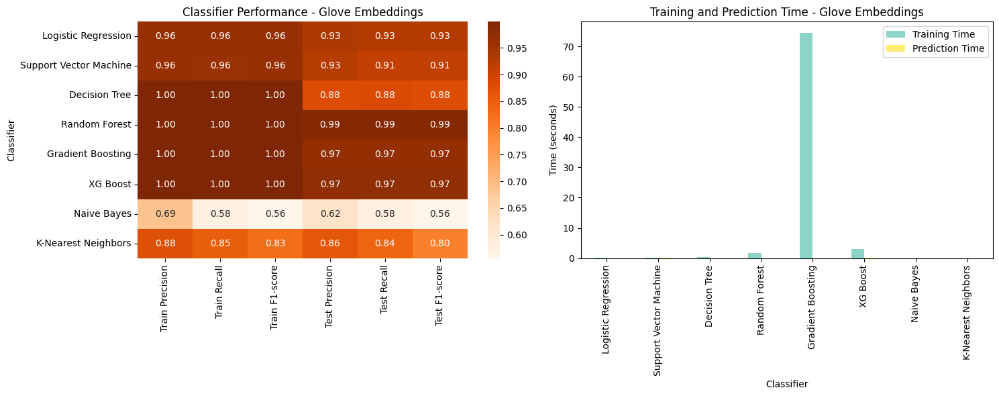

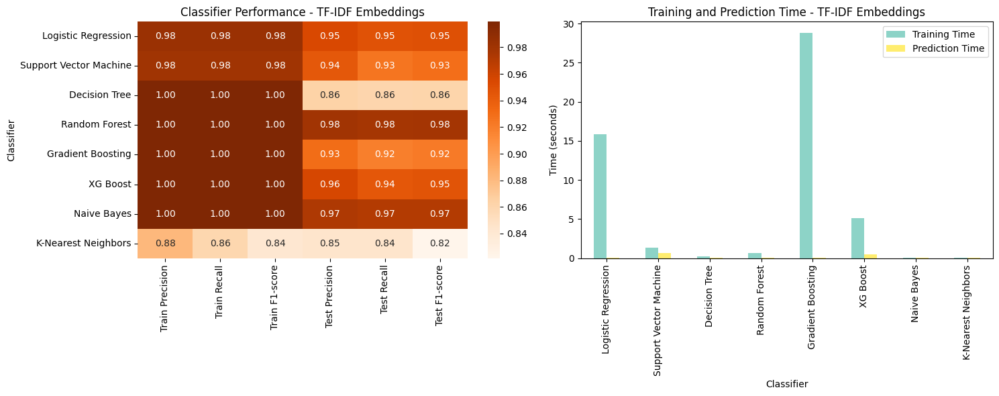

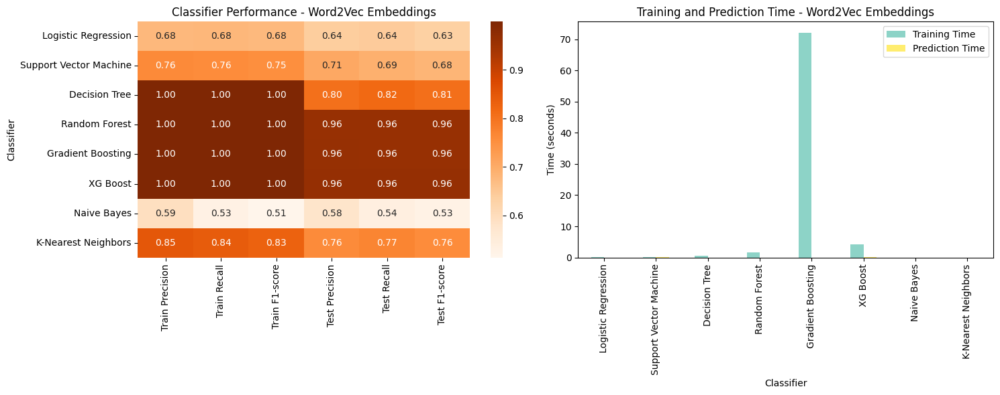

In [ ]:
# Plotting the classification report for all the ML classifers with training and prediction time comparisions.

import time
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot classification report and training/prediction times
def plot_results(df, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Classification report heatmap
    report_data = df[['Classifier', 'Train Precision', 'Train Recall', 'Train F1-score',
                       'Test Precision', 'Test Recall', 'Test F1-score']].set_index('Classifier')
    sns.heatmap(report_data, annot=True, cmap='Oranges', fmt='.2f', ax=ax1)
    ax1.set_title(f'Classifier Performance - {title}')

    # Training and prediction time comparison
    df.plot(x='Classifier', y=['Training Time', 'Prediction Time'], kind='bar', ax=ax2, cmap='Set3')
    ax2.set_title(f'Training and Prediction Time - {title}')
    ax2.set_ylabel('Time (seconds)')
    plt.tight_layout()
    plt.show()

# Plot results for each DataFrame
plot_results(glove_df, 'Glove Embeddings')
plot_results(tfidf_df, 'TF-IDF Embeddings')
plot_results(word2vec_df, 'Word2Vec Embeddings')

In [ ]:
# Function to plot confusion matrix against all classifiers with word embeddings generated using Glove, TF-IDF, Word2Vec:

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrices(df, df_name):
  X = df.drop('Accident Level', axis=1)
  y = df['Accident Level']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

  fig, axes = plt.subplots(2, 4, figsize=(20, 10))
  fig.suptitle(f'Confusion Matrices for {df_name}', fontsize=16)

  for i, (name, clf) in enumerate(classifiers.items()):
    row = i // 4
    col = i % 4
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    disp.plot(ax=axes[row, col], cmap='Oranges')
    axes[row, col].set_title(name)

  plt.tight_layout()
  plt.show()

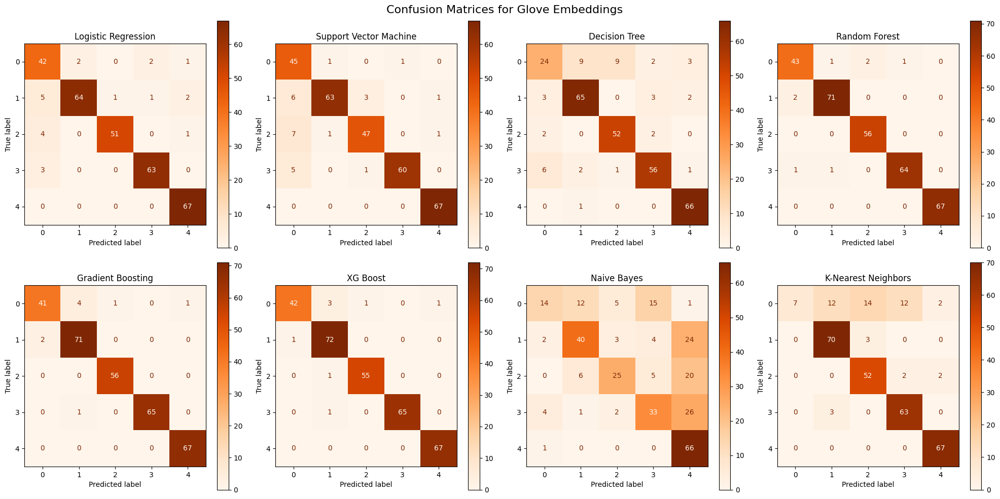

In [ ]:
plot_confusion_matrices(Final_NLP_Glove_df, 'Glove Embeddings')

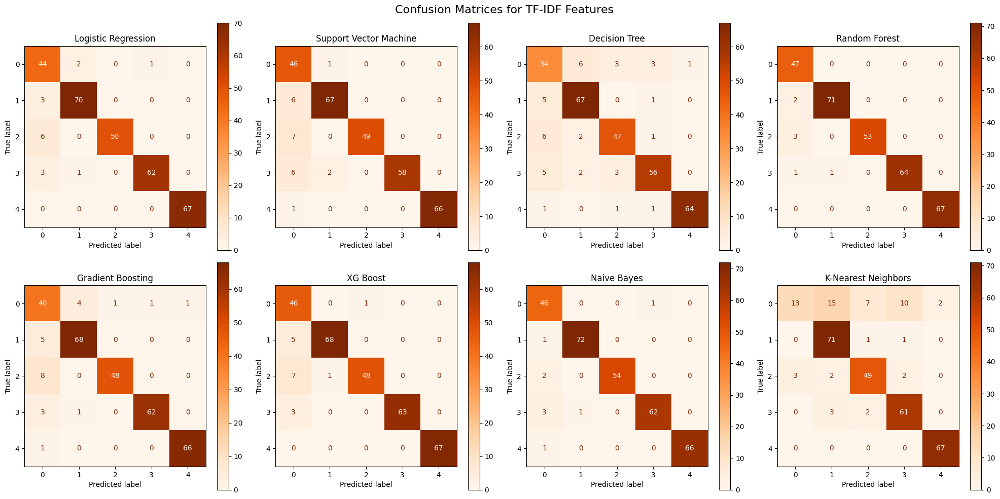

In [ ]:
plot_confusion_matrices(Final_NLP_TFIDF_df, 'TF-IDF Features')

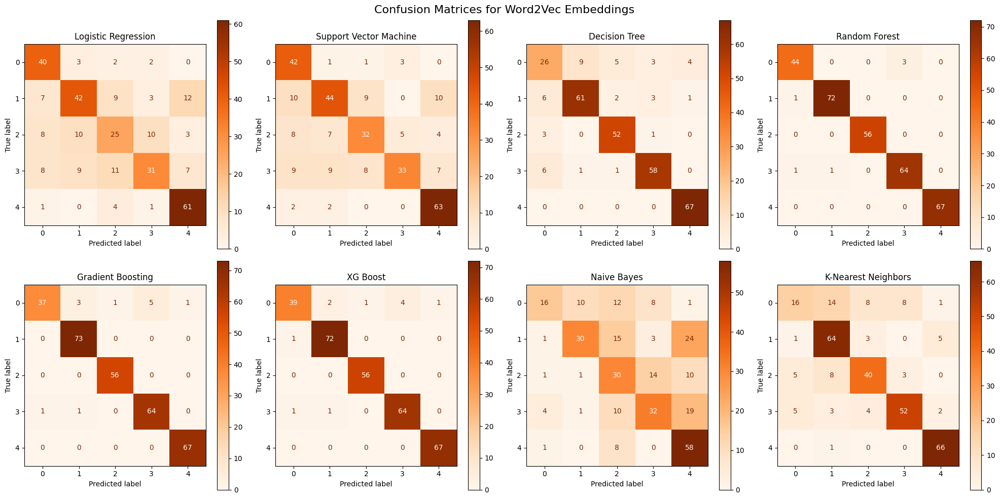

In [ ]:
plot_confusion_matrices(Final_NLP_Word2Vec_df, 'Word2Vec Embeddings')

#### **Confusion Matrix Observations: (Base Classifiers)**

**Overall Performance:**

1. Across all embeddings, Random Forest and XG Boost consistently perform well, showing high accuracy across most classes.
2. Naive Bayes generally performs the poorest, especially with Glove and Word2Vec embeddings.

**Glove Embeddings:**

1. Most classifiers perform well, with Random Forest, XG Boost, and Gradient Boosting showing particularly strong results.
2. The Decision Tree has more misclassifications compared to other top-performing classifiers.
3. K-Nearest Neighbors shows moderate performance but struggles more with class 0 compared to other classifiers.

**TF-IDF Features:**

1. Overall, the performance seems slightly better than with Glove embeddings.
2. Logistic Regression and Support Vector Machine show improved performance compared to their Glove counterpart.
3. K-Nearest Neighbors still struggles with class 0 but performs better in other classes.

**Word2Vec Embeddings:**

1. Performance is generally lower compared to Glove and TF-IDF, especially for simpler models.
2. Random Forest, Gradient Boosting, and XG Boost maintain strong performance.
3. Logistic Regression and Support Vector Machine show a notable decrease in accuracy, especially for classes 1, 2, and 3.
4. Naive Bayes and K-Nearest Neighbors struggle significantly with this embedding.

**Class-specific observations:**

1. Class 4 is consistently well-classified across all embeddings and most classifiers.
2. Classes 0 and 1 often see more misclassifications, especially in Word2Vec embeddings.
3. The middle classes (1, 2, 3) tend to have more confusion between them, particularly in Word2Vec.

**Model Complexity:**

1. More complex models (Random Forest, XG Boost, Gradient Boosting) generally perform better across all embeddings.
2. Simpler models like Logistic Regression and SVM are more sensitive to the choice of embedding.

**Embedding Effectiveness:**

1. TF-IDF features seem to provide the most consistent performance across different classifiers.
2. Glove embeddings perform well, especially with more complex models.
3. Word2Vec embeddings appear less effective for this particular classification task, especially with simpler models.

**Conclusion:**
1. The choice of both classifier and embedding has a significant impact on performance.
2. For this particular task, ensemble methods like Random Forest and boosting algorithms seem most robust across different embeddings.
3. TF-IDF features provide good overall performance, while Word2Vec embeddings might require more complex models to achieve comparable results.
4. The effectiveness of different embeddings suggests that the nature of the text data and the specific classification task play a crucial role in determining the most suitable approach.

Train vs Test Confusion Matrices for all Base ML classifiers


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

def plot_train_test_confusion_matrices(df, df_name):
    X = df.drop('Accident Level', axis=1)
    y = df['Accident Level']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    fig, axes = plt.subplots(8, 2, figsize=(20, 40))
    fig.suptitle(f'Train and Test Confusion Matrices for {df_name}', fontsize=15, y=0.98)

    for i, (name, clf) in enumerate(classifiers.items()):
        clf.fit(X_train, y_train)

        # Train confusion matrix
        y_train_pred = clf.predict(X_train)
        cm_train = confusion_matrix(y_train, y_train_pred)
        disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=clf.classes_)
        disp_train.plot(ax=axes[i, 0], cmap='Oranges')
        axes[i, 0].set_title(f'{name} (Train)', fontsize=12)

        # Test confusion matrix
        y_test_pred = clf.predict(X_test)
        cm_test = confusion_matrix(y_test, y_test_pred)
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=clf.classes_)
        disp_test.plot(ax=axes[i, 1], cmap='Oranges')
        axes[i, 1].set_title(f'{name} (Test)', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

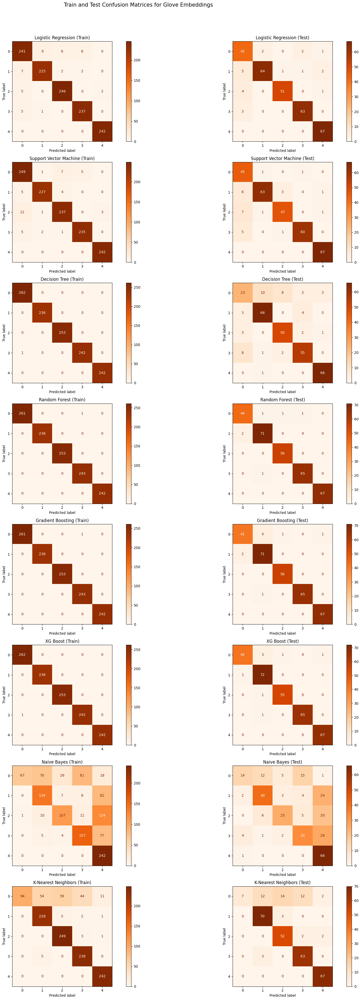

In [ ]:
plot_train_test_confusion_matrices(Final_NLP_Glove_df, 'Glove Embeddings')

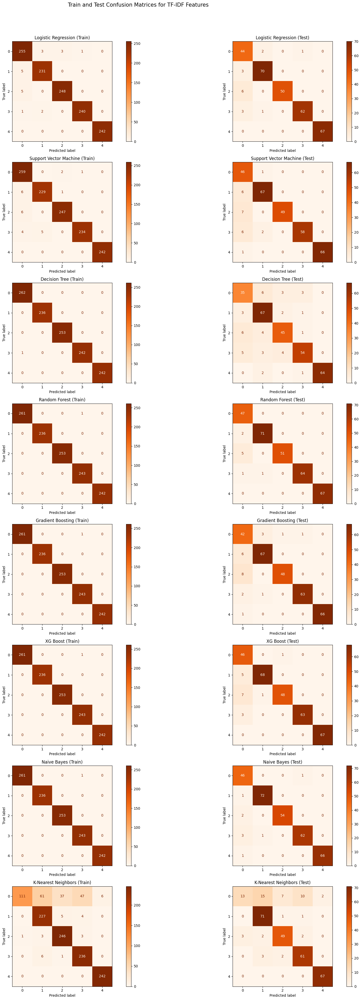

In [ ]:
plot_train_test_confusion_matrices(Final_NLP_TFIDF_df, 'TF-IDF Features')

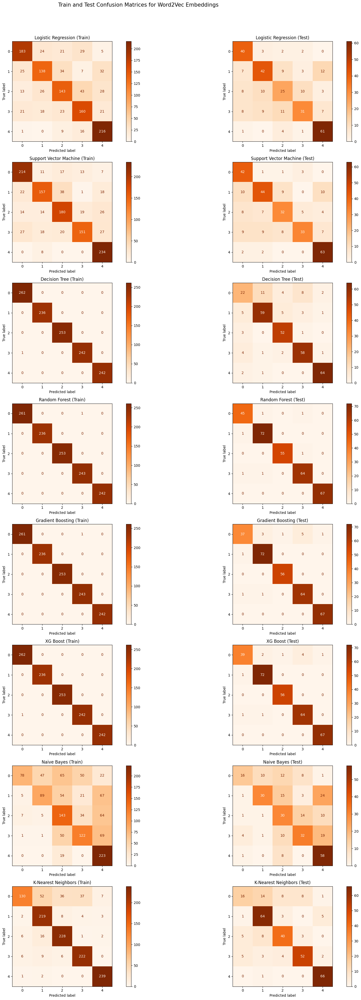

In [ ]:
plot_train_test_confusion_matrices(Final_NLP_Word2Vec_df, 'Word2Vec Embeddings')

##### **Base ML Classifiers + PCA**

In [ ]:
# Apply PCA and scaling

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

def apply_pca_and_split(df, n_components=0.99):
  X = df.drop('Accident Level', axis=1)
  y = df['Accident Level']

  # Scaling
  scaler = StandardScaler()
  X_scaled = scaler.fit_transform(X)

  # PCA
  if n_components < 1:
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)
  else:
    X_pca = X_scaled

  # Splitting
  X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

  return X_train, X_test, y_train, y_test

# Apply to each dataframe
X_train_glove, X_test_glove, y_train_glove, y_test_glove = apply_pca_and_split(Final_NLP_Glove_df)
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = apply_pca_and_split(Final_NLP_TFIDF_df)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = apply_pca_and_split(Final_NLP_Word2Vec_df)

In [ ]:
# Function to print explained variance rtio and cumulative explained variance for all 3 embeddings

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def print_pca_variance(df, df_name):
  X = df.drop('Accident Level', axis=1)

  # Scaling
  scaler = StandardScaler()
  X_scaled = scaler.fit_transform(X)

  # PCA
  pca = PCA()
  pca.fit(X_scaled)

  # Explained variance ratio and cumulative explained variance
  explained_variance_ratio = pca.explained_variance_ratio_
  cumulative_explained_variance = np.cumsum(explained_variance_ratio)

  print(f"----- PCA Variance for {df_name} -----")
  print("Explained Variance Ratio:", explained_variance_ratio)
  print("Cumulative Explained Variance:", cumulative_explained_variance)

# Print PCA variance for each dataframe
print_pca_variance(Final_NLP_Glove_df, 'Glove Embeddings')
print_pca_variance(Final_NLP_TFIDF_df, 'TF-IDF Features')
print_pca_variance(Final_NLP_Word2Vec_df, 'Word2Vec Embeddings')

----- PCA Variance for Glove Embeddings -----
Explained Variance Ratio: [7.20317111e-02 4.65175696e-02 4.19325297e-02 3.78570967e-02
 3.43278728e-02 2.76109930e-02 2.40981168e-02 2.32083296e-02
 2.10781865e-02 1.96841542e-02 1.79640688e-02 1.71660976e-02
 1.66113876e-02 1.62398730e-02 1.56111610e-02 1.40997594e-02
 1.33395325e-02 1.25536773e-02 1.21800988e-02 1.16986432e-02
 1.07976577e-02 1.02797316e-02 9.83359726e-03 9.65500515e-03
 9.36034959e-03 9.04572584e-03 8.60432309e-03 8.41584537e-03
 8.09972967e-03 8.09870985e-03 7.79322196e-03 7.40199429e-03
 7.29051728e-03 7.02229131e-03 6.85609497e-03 6.76442455e-03
 6.47310905e-03 6.37547647e-03 6.19192301e-03 6.13035662e-03
 5.79266663e-03 5.73710220e-03 5.62483682e-03 5.52409489e-03
 5.36614476e-03 5.22690039e-03 5.02810371e-03 4.97990209e-03
 4.87446350e-03 4.76793040e-03 4.67078464e-03 4.51692654e-03
 4.49816123e-03 4.34567866e-03 4.29325915e-03 4.25616739e-03
 4.17441973e-03 4.14408768e-03 4.09993186e-03 4.02244674e-03
 3.89119471e-

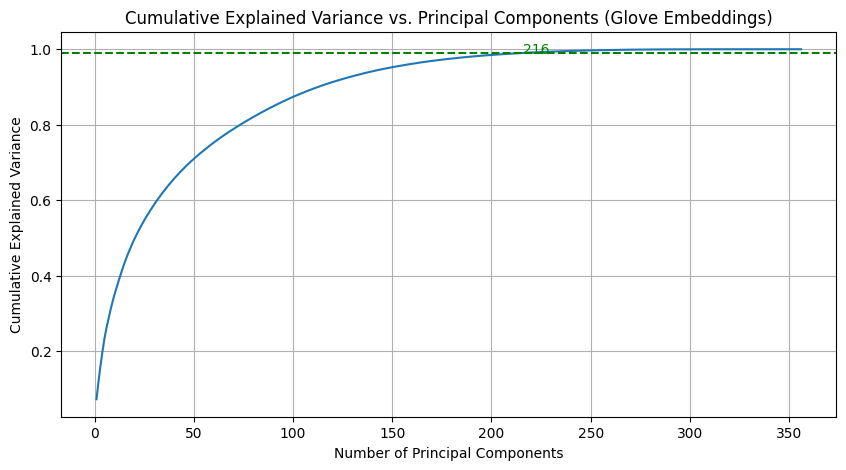

<Figure size 640x480 with 0 Axes>

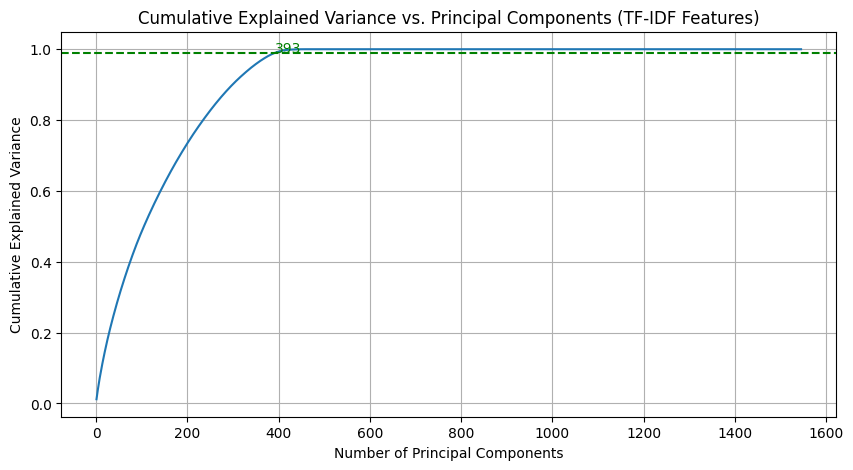

<Figure size 640x480 with 0 Axes>

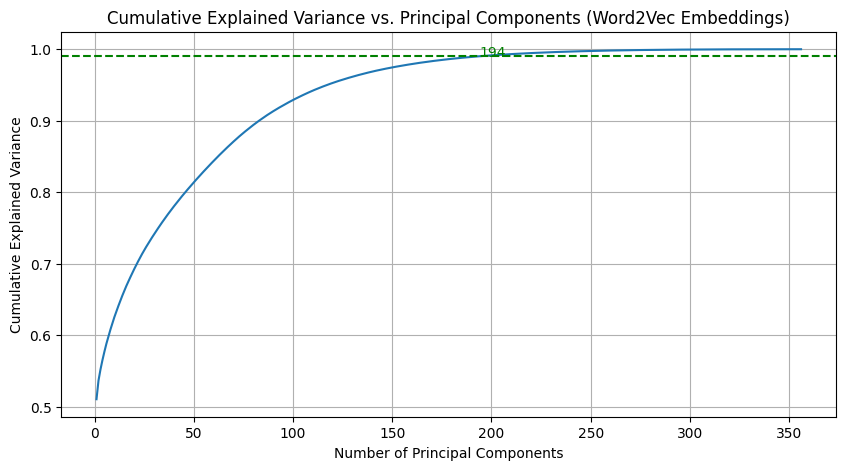

In [ ]:
def plot_cumulative_variance(df, df_name, threshold=0.99):
  X = df.drop('Accident Level', axis=1)

  # Scaling
  scaler = StandardScaler()
  X_scaled = scaler.fit_transform(X)

  # PCA
  pca = PCA()
  pca.fit(X_scaled)

  # Explained variance ratio and cumulative explained variance
  explained_variance_ratio = pca.explained_variance_ratio_
  cumulative_explained_variance = np.cumsum(explained_variance_ratio)

  # Find number of components for threshold
  n_components_at_threshold = np.argmax(cumulative_explained_variance >= threshold) + 1

  # Plotting
  plt.figure(figsize=(10, 5))
  plt.plot(np.arange(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance)
  plt.axhline(y=threshold, color='g', linestyle='--')
  plt.text(n_components_at_threshold, threshold, f"{n_components_at_threshold}", color='green')
  plt.title(f'Cumulative Explained Variance vs. Principal Components ({df_name})')
  plt.xlabel('Number of Principal Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.grid(True)
  plt.show()

# Plot for each dataframe
plot_cumulative_variance(Final_NLP_Glove_df, 'Glove Embeddings')
plt.subplots_adjust(wspace=0.5)  # Add spacing between plots
plot_cumulative_variance(Final_NLP_TFIDF_df, 'TF-IDF Features')
plt.subplots_adjust(wspace=0.5)
plot_cumulative_variance(Final_NLP_Word2Vec_df, 'Word2Vec Embeddings')

In [ ]:
# Train and evaluate classifiers with PCA components

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import time

# Initialize classifiers
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Support Vector Machine": SVC(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XG Boost": XGBClassifier(),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier()
}

# Function to train and evaluate models (modified for PCA data)
def train_and_evaluate_pca(X_train, X_test, y_train, y_test):
    results = []
    for name, clf in classifiers.items():
        start_time = time.time()
        clf.fit(X_train, y_train)
        training_time = time.time() - start_time

        # Train metrics
        y_train_pred = clf.predict(X_train)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        train_precision = precision_score(y_train, y_train_pred, average='weighted')
        train_recall = recall_score(y_train, y_train_pred, average='weighted')
        train_f1 = f1_score(y_train, y_train_pred, average='weighted')

        start_time = time.time()
        y_test_pred = clf.predict(X_test)
        prediction_time = time.time() - start_time

        # Test metrics
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_precision = precision_score(y_test, y_test_pred, average='weighted')
        test_recall = recall_score(y_test, y_test_pred, average='weighted')
        test_f1 = f1_score(y_test, y_test_pred, average='weighted')

        results.append([name,
                        train_accuracy, train_precision, train_recall, train_f1,
                        test_accuracy, test_precision, test_recall, test_f1,
                        training_time, prediction_time])

    return results

# Train and evaluate on each PCA-transformed dataset
glove_results_pca = train_and_evaluate_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove)
tfidf_results_pca = train_and_evaluate_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf)
word2vec_results_pca = train_and_evaluate_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec)

# Create DataFrames for results
columns = ['Classifier',
           'Train Accuracy', 'Train Precision', 'Train Recall', 'Train F1-score',
           'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1-score',
           'Training Time', 'Prediction Time']

glove_df_pca = pd.DataFrame(glove_results_pca, columns=columns)
tfidf_df_pca = pd.DataFrame(tfidf_results_pca, columns=columns)
word2vec_df_pca = pd.DataFrame(word2vec_results_pca, columns=columns)

In [ ]:
print("Classification matrix for Glove (PCA)")
glove_df_pca

Classification matrix for Glove (PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.999191,0.999194,0.999191,0.999191,0.948220,0.948514,0.948220,0.948278,0.105575,0.000378
1,Support Vector Machine,0.993528,0.993549,0.993528,0.993527,0.967638,0.970904,0.967638,0.968258,0.167613,0.056506
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.776699,0.777464,0.776699,0.774070,0.329336,0.000332
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.954693,0.959536,0.954693,0.955472,1.775282,0.011454
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.980583,0.982138,0.980583,0.980819,53.698463,0.004048
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.970874,0.973752,0.970874,0.971284,1.436882,0.003529
6,Naive Bayes,0.907767,0.909527,0.907767,0.906243,0.834951,0.845118,0.834951,0.835399,0.003593,0.001635
7,K-Nearest Neighbors,0.842233,0.873798,0.842233,0.806267,0.877023,0.900970,0.877023,0.844946,0.000774,0.003505


In [ ]:
print("\nClassification matrix for TFIDF (PCA)")
tfidf_df_pca


Classification matrix for TFIDF (PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.998382,0.998385,0.998382,0.998382,0.957929,0.959284,0.957929,0.956248,0.119481,0.000438
1,Support Vector Machine,0.987864,0.988173,0.987864,0.987872,0.993528,0.993700,0.993528,0.993541,0.188764,0.080477
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.906149,0.903889,0.906149,0.903676,0.600765,0.000409
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.983819,0.984182,0.983819,0.983635,2.135473,0.011151
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.983819,0.984328,0.983819,0.983830,97.498487,0.003880
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.977346,0.977723,0.977346,0.977362,4.031977,0.001467
6,Naive Bayes,0.789644,0.819981,0.789644,0.779825,0.786408,0.810530,0.786408,0.784380,0.005635,0.002616
7,K-Nearest Neighbors,0.851133,0.908750,0.851133,0.830634,0.851133,0.907750,0.851133,0.801892,0.000835,0.004656


In [ ]:
print("\nClassification matrix for Word2Vec (PCA)")
word2vec_df_pca


Classification matrix for Word2Vec (PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time
0,Logistic Regression,0.999191,0.999194,0.999191,0.999191,0.941748,0.943847,0.941748,0.942467,0.095108,0.000333
1,Support Vector Machine,0.987864,0.987891,0.987864,0.987851,0.964401,0.969988,0.964401,0.965378,0.140915,0.054962
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.805825,0.807284,0.805825,0.805828,0.321802,0.000337
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.948220,0.956001,0.948220,0.949430,1.656468,0.011492
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.970874,0.972674,0.970874,0.971157,48.383260,0.003917
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.967638,0.969718,0.967638,0.967933,1.549905,0.001610
6,Naive Bayes,0.907767,0.911257,0.907767,0.907027,0.844660,0.856784,0.844660,0.844113,0.003453,0.001562
7,K-Nearest Neighbors,0.869741,0.887881,0.869741,0.848454,0.867314,0.884397,0.867314,0.833406,0.000745,0.002465


**GloVe Embedding with PCA:**

1. Logistic Regression: The Test Accuracy slightly decreases with PCA, indicating a potential loss of information.
2. SVM: Shows a minor drop in performance, but still maintains a high accuracy.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores.
4. KNN: Performance remains relatively stable, suggesting PCA's effectiveness in reducing dimensionality without significant information loss.

**TFIDF Features with PCA:**

1. Logistic Regression: Maintains a high Test Accuracy, showing PCA's ability to retain essential features.
2. SVM: Performance is consistent with and without PCA, indicating robustness to dimensionality reduction.
3. Random Forest and XG Boost: Show improved generalization with PCA, reducing overfitting.
4. KNN: Experiences a slight improvement in Test Accuracy, benefiting from reduced dimensionality.

**Word2Vec Embedding with PCA:**

1. Logistic Regression: Performance improves with PCA, suggesting that dimensionality reduction helps in capturing essential features.
2. SVM: Shows a significant improvement in Test Accuracy, indicating PCA's effectiveness in handling Word2Vec's high dimensionality.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores.
4. KNN: Performance remains stable, benefiting from PCA's dimensionality reduction.

**Insights and Comparison:**

1. **PCA's Impact:** PCA generally helps in reducing overfitting, especially for complex models like Random Forest and XG Boost, by balancing training and test scores.
2. **Embedding Techniques:** GloVe and TFIDF continue to perform well with PCA, while Word2Vec shows significant improvement, highlighting PCA's effectiveness in handling high-dimensional data.
3. **Model Robustness:** Logistic Regression and SVM demonstrate robustness to PCA, maintaining high performance across different embeddings.
4. **Dimensionality Reduction:** PCA proves beneficial in reducing dimensionality without significant information loss, particularly for Word2Vec, which inherently has high dimensionality.

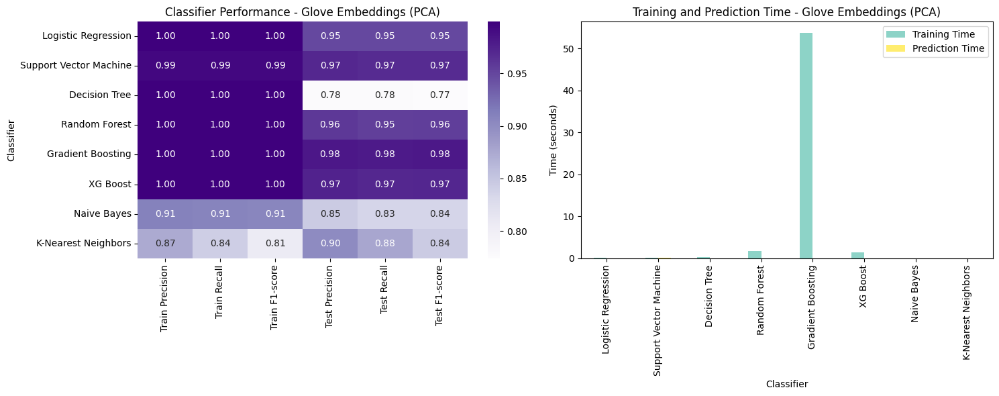

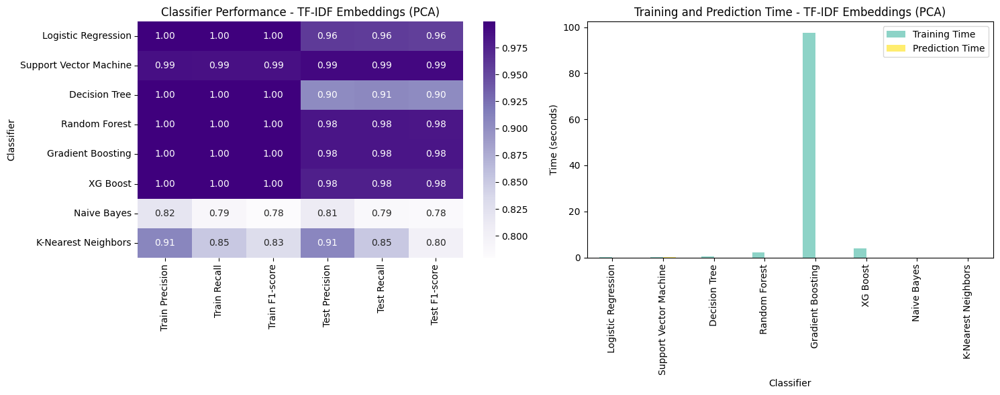

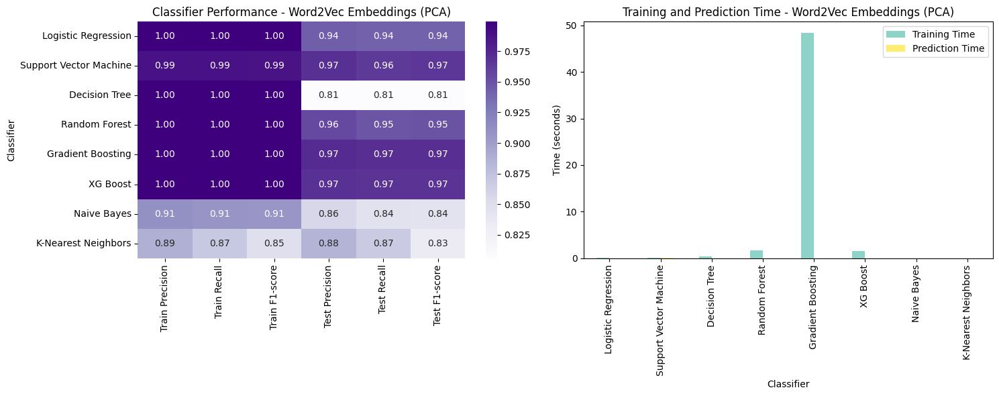

In [ ]:
# Function to plot classification report and training/prediction times
def plot_results(df, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Classification report heatmap
    report_data = df[['Classifier', 'Train Precision', 'Train Recall', 'Train F1-score',
                       'Test Precision', 'Test Recall', 'Test F1-score']].set_index('Classifier')
    sns.heatmap(report_data, annot=True, cmap='Purples', fmt='.2f', ax=ax1)
    ax1.set_title(f'Classifier Performance - {title}')

    # Training and prediction time comparison
    df.plot(x='Classifier', y=['Training Time', 'Prediction Time'], kind='bar', ax=ax2, cmap='Set3')
    ax2.set_title(f'Training and Prediction Time - {title}')
    ax2.set_ylabel('Time (seconds)')
    plt.tight_layout()
    plt.show()

# Plot results for each DataFrame (with PCA)
plot_results(glove_df_pca, 'Glove Embeddings (PCA)')
plot_results(tfidf_df_pca, 'TF-IDF Embeddings (PCA)')
plot_results(word2vec_df_pca, 'Word2Vec Embeddings (PCA)')

In [ ]:
# Function to plot confusion matrix against all classifiers with word embeddings generated using Glove, TF-IDF, Word2Vec with PCA

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrices_pca(X_train, X_test, y_train, y_test, df_name):
  fig, axes = plt.subplots(2, 4, figsize=(20, 10))
  fig.suptitle(f'Confusion Matrices for {df_name} (PCA)', fontsize=16)

  for i, (name, clf) in enumerate(classifiers.items()):
    row = i // 4
    col = i % 4
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    disp.plot(ax=axes[row, col], cmap='Purples')
    axes[row, col].set_title(name)

  plt.tight_layout()
  plt.show()

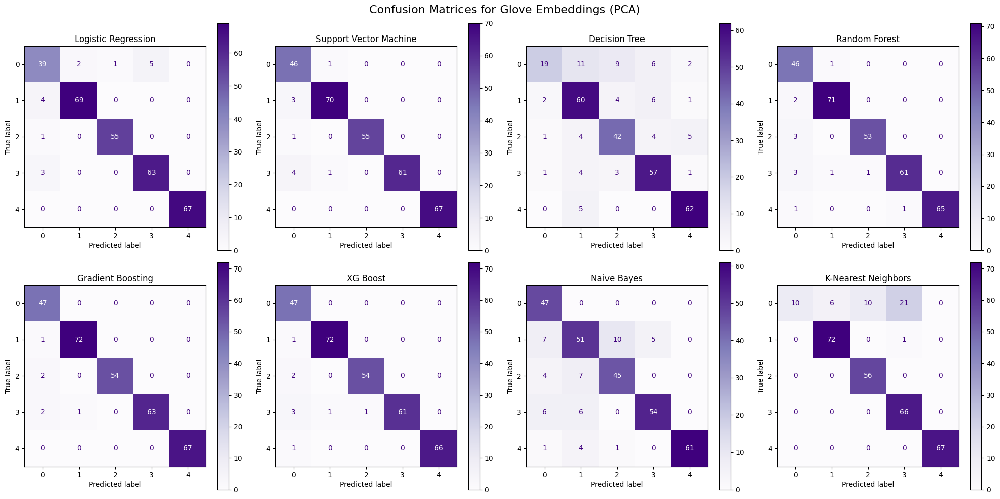

In [ ]:
plot_confusion_matrices_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

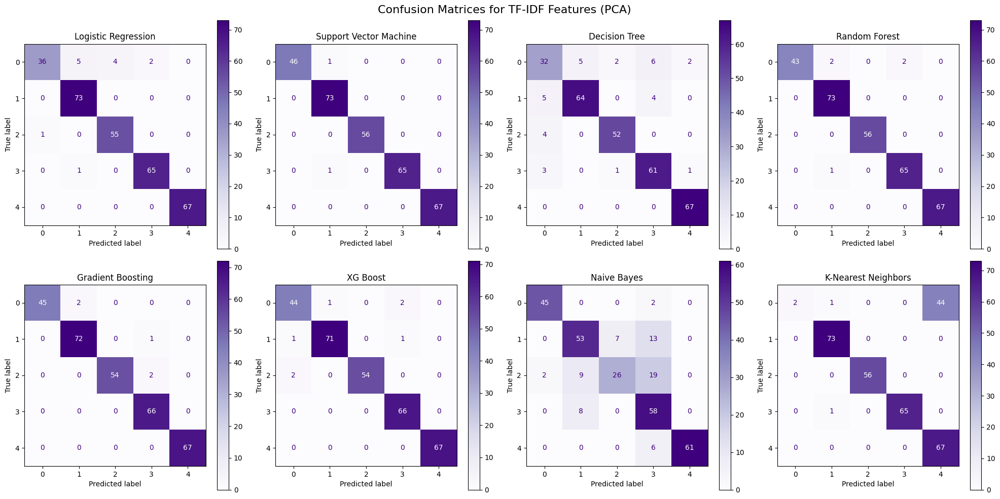

In [ ]:
plot_confusion_matrices_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

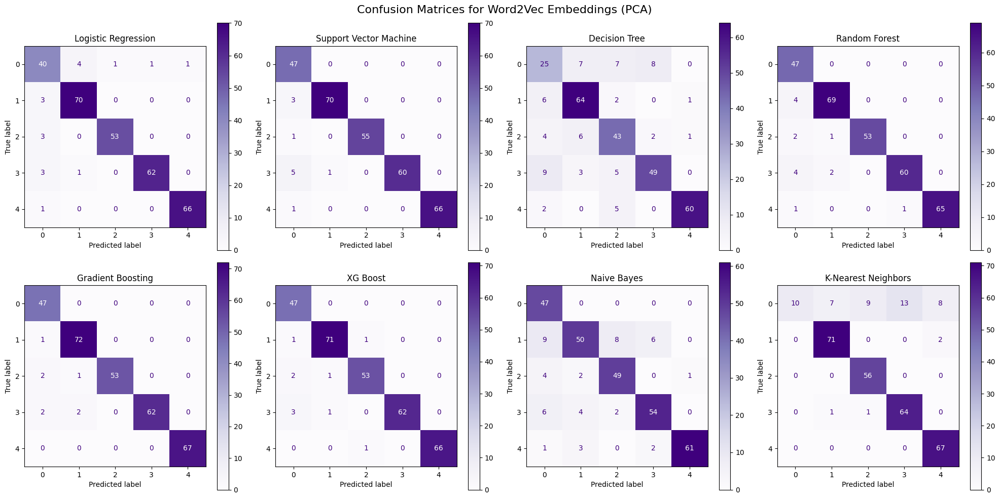

In [ ]:
plot_confusion_matrices_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

#### **Confusion Matrix Observations: (Base Classifiers + PCA)**

**Overall Performance:**

1. PCA generally improved the performance of simpler models like Logistic Regression and SVM across all embeddings.
2. Random Forest and XGBoost maintain strong performance, similar to non-PCA results.

**Glove Embeddings with PCA:**

1.  Improved performance for Logistic Regression and SVM compared to non-PCA Glove embeddings.
2. K-Nearest Neighbors shows better classification, especially for class 0.

**TF-IDF Features with PCA:**

1. Slight improvements across most classifiers compared to non-PCA TF-IDF.
2. Naive Bayes shows notable improvement, especially for classes 1 and 2.

**Word2Vec Embeddings with PCA:**

1. Significant improvement for Logistic Regression and SVM compared to non-PCA Word2Vec.
2. K-Nearest Neighbors and Naive Bayes still struggle but show some improvement.

**Class-specific observations:**

1. Class 4 remains well-classified across all embeddings and classifiers.
2. PCA helped reduce misclassifications between middle classes (1, 2, 3) for most models.

**Model Complexity:**

1. PCA narrowed the performance gap between simpler and more complex models.

**Embedding Effectiveness with PCA:**

1. Word2Vec embeddings benefited the most from PCA, showing substantial improvements.
2. TF-IDF features with PCA provide the most consistent performance across classifiers.

**Conclusion**

1. Applying PCA generally improved model performance, especially for simpler models and Word2Vec embeddings.
2. It helped in reducing the dimensionality of the data while preserving important features, leading to better classification results.

Train vs Test Confusion Matrices for all ML classifiers with PCA


In [ ]:
def plot_train_test_confusion_matrices_pca(X_train, X_test, y_train, y_test, df_name):
    fig, axes = plt.subplots(8, 2, figsize=(20, 40))
    fig.suptitle(f'Train and Test Confusion Matrices for {df_name} (PCA)', fontsize=15, y=0.98)

    for i, (name, clf) in enumerate(classifiers.items()):
        clf.fit(X_train, y_train)

        # Train confusion matrix
        y_train_pred = clf.predict(X_train)
        cm_train = confusion_matrix(y_train, y_train_pred)
        disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=clf.classes_)
        disp_train.plot(ax=axes[i, 0], cmap='Purples')
        axes[i, 0].set_title(f'{name} (Train)', fontsize=12)

        # Test confusion matrix
        y_test_pred = clf.predict(X_test)
        cm_test = confusion_matrix(y_test, y_test_pred)
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=clf.classes_)
        disp_test.plot(ax=axes[i, 1], cmap='Purples')
        axes[i, 1].set_title(f'{name} (Test)', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

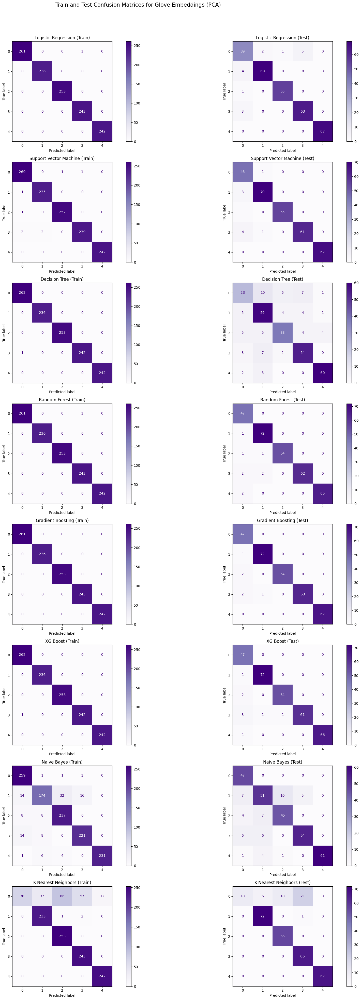

In [ ]:
plot_train_test_confusion_matrices_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

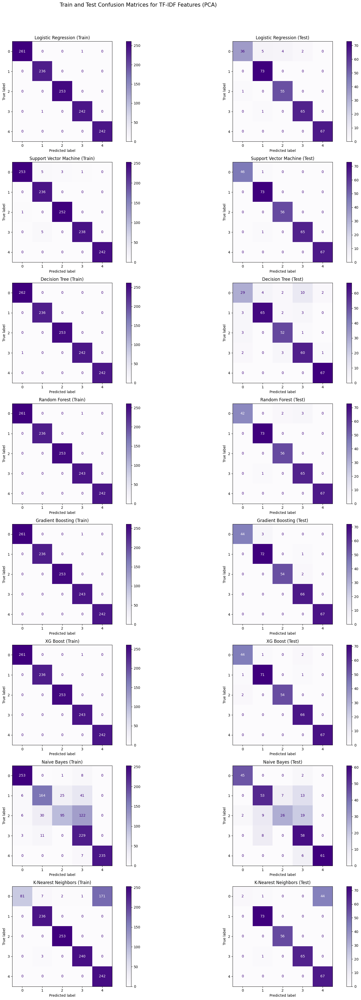

In [ ]:
plot_train_test_confusion_matrices_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

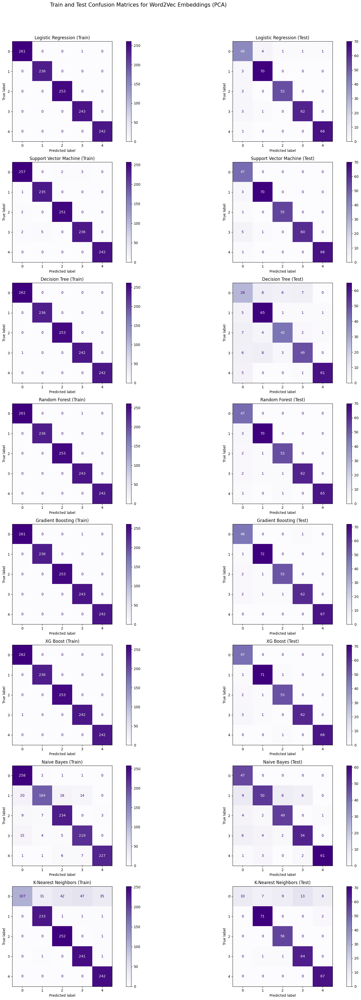

In [ ]:
plot_train_test_confusion_matrices_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

##### **Base ML Classifiers + Hypertuning**

In [ ]:
# Applying Hypertuning to all the classifers and run without PCA

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
import time

# Prepare data
X_glove = Final_NLP_Glove_df.drop('Accident Level', axis=1)
y_glove = Final_NLP_Glove_df['Accident Level']
X_tfidf = Final_NLP_TFIDF_df.drop('Accident Level', axis=1)
y_tfidf = Final_NLP_TFIDF_df['Accident Level']
X_word2vec = Final_NLP_Word2Vec_df.drop('Accident Level', axis=1)
y_word2vec = Final_NLP_Word2Vec_df['Accident Level']

# Split data
X_train_glove, X_test_glove, y_train_glove, y_test_glove = train_test_split(X_glove, y_glove, test_size=0.2, random_state=42)
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(X_tfidf, y_tfidf, test_size=0.2, random_state=42)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(X_word2vec, y_word2vec, test_size=0.2, random_state=42)

# Define classifiers and hyperparameter grids
classifiers = {
    "Logistic Regression": (LogisticRegression(), {
        'penalty': ['l1', 'l2'],
        'C': [0.01, 0.1, 1, 10],
        'solver': ['liblinear', 'saga'],
        'max_iter': [100, 500, 1000]
    }),
    "Support Vector Machine": (SVC(), {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf', 'poly'],
        'gamma': ['scale', 'auto'],
        'class_weight': ['balanced', None],
        'max_iter': [1000, 5000, 10000]
    }),
    "Decision Tree": (DecisionTreeClassifier(), {
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    "Random Forest": (RandomForestClassifier(), {
        'n_estimators': [50, 100, 200],
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt']
    }),
    "Gradient Boosting": (GradientBoostingClassifier(), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'n_iter_no_change': [5],
        'validation_fraction': [0.1, 0.2]
    }),
    "XG Boost": (XGBClassifier(), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0]
    }),
    "Naive Bayes": (GaussianNB(), {}),  # No hyperparameters for GaussianNB
    "K-Nearest Neighbors": (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    })
}

# Scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Function to perform hyperparameter tuning and evaluation
def tune_and_evaluate(X_train, X_test, y_train, y_test, embedding_name):
    results = []
    for name, (clf, param_grid) in classifiers.items():
        start_time = time.time()
        # Use RandomizedSearchCV for efficiency with large param grids
        grid_search = RandomizedSearchCV(clf, param_grid, cv=5, scoring=scoring, refit='f1', n_jobs=-1, verbose=2, random_state=42)
        grid_search.fit(X_train, y_train)
        training_time = time.time() - start_time

        best_clf = grid_search.best_estimator_

        # Train metrics (using best estimator)
        y_train_pred = best_clf.predict(X_train)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        train_precision = precision_score(y_train, y_train_pred, average='weighted')
        train_recall = recall_score(y_train, y_train_pred, average='weighted')
        train_f1 = f1_score(y_train, y_train_pred, average='weighted')

        start_time = time.time()
        y_test_pred = best_clf.predict(X_test)
        prediction_time = time.time() - start_time

        # Test metrics
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_precision = precision_score(y_test, y_test_pred, average='weighted')
        test_recall = recall_score(y_test, y_test_pred, average='weighted')
        test_f1 = f1_score(y_test, y_test_pred, average='weighted')

        results.append([name,
                        train_accuracy, train_precision, train_recall, train_f1,
                        test_accuracy, test_precision, test_recall, test_f1,
                        training_time, prediction_time, grid_search.best_params_])

    # Create DataFrame and print results
    columns = ['Classifier',
               'Train Accuracy', 'Train Precision', 'Train Recall', 'Train F1-score',
               'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1-score',
               'Training Time', 'Prediction Time', 'Best Parameters']
    df = pd.DataFrame(results, columns=columns)
    print(f"----- Results for {embedding_name} -----")
    print(df)
    return df

# Tune and evaluate for each embedding
glove_results = tune_and_evaluate(X_train_glove, X_test_glove, y_train_glove, y_test_glove, "Glove")
tfidf_results = tune_and_evaluate(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, "TF-IDF")
word2vec_results = tune_and_evaluate(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, "Word2Vec")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 10 candidates, totalling 50 fits
----- Results for Glove -----
               Classifier  Train Accuracy  Train Precision  Train Recall  \
0     Logistic Regression        0.997573         0.997576      0.997573   
1  Support Vector Machine        0.997573         0.997583      0.997573   
2           Decision Tree        0.999191         0.999194      0.999191   
3           Random Forest        0.999191         0.999194      0.999191   
4       Gradient Boosting        0.994337         0.994340      0.994337   
5                XG Boost   

In [ ]:
print("Glove Results")
display(glove_results)

Glove Results


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.997573,0.997576,0.997573,0.997573,0.941748,0.941760,0.941748,0.941599,11.900393,0.005751,"{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 500, 'C': 10}"
1,Support Vector Machine,0.997573,0.997583,0.997573,0.997573,0.964401,0.969511,0.964401,0.965489,2.059348,0.069366,"{'max_iter': 10000, 'kernel': 'rbf', 'gamma': 'scale', 'class_weight': 'balanced', 'C': 10}"
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.857605,0.853864,0.857605,0.855199,2.920077,0.003244,"{'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None, 'criterion': 'gini'}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.987055,0.987190,0.987055,0.987094,11.566955,0.024556,"{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'gini'}"
4,Gradient Boosting,0.994337,0.994340,0.994337,0.994327,0.974110,0.974303,0.974110,0.973654,304.612072,0.005964,"{'validation_fraction': 0.1, 'n_iter_no_change': 5, 'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 5, 'learning_rate': 0.2}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.977346,0.977750,0.977346,0.977273,115.302313,0.071594,"{'subsample': 1.0, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.9}"
6,Naive Bayes,0.576052,0.686802,0.576052,0.555990,0.576052,0.619135,0.576052,0.560298,0.167307,0.005420,{}
7,K-Nearest Neighbors,0.999191,0.999194,0.999191,0.999191,0.873786,0.895224,0.873786,0.838124,0.701028,0.043943,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"


In [ ]:
print("TF-IDF Results")
display(tfidf_results)

TF-IDF Results


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.998382,0.998385,0.998382,0.998382,0.970874,0.973348,0.970874,0.971411,60.541348,0.062399,"{'solver': 'saga', 'penalty': 'l2', 'max_iter': 500, 'C': 10}"
1,Support Vector Machine,0.997573,0.997579,0.997573,0.997571,0.987055,0.987362,0.987055,0.987085,19.059741,0.238296,"{'max_iter': 10000, 'kernel': 'linear', 'gamma': 'auto', 'class_weight': 'balanced', 'C': 10}"
2,Decision Tree,0.999191,0.999194,0.999191,0.999191,0.860841,0.865059,0.860841,0.862333,1.743609,0.016801,"{'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None, 'criterion': 'gini'}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.961165,0.967778,0.961165,0.962261,3.144647,0.029608,"{'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'criterion': 'entropy'}"
4,Gradient Boosting,0.995146,0.995153,0.995146,0.995138,0.925566,0.935225,0.925566,0.928043,280.731220,0.021044,"{'validation_fraction': 0.1, 'n_iter_no_change': 5, 'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 3, 'learning_rate': 0.2}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.944984,0.954156,0.944984,0.946625,105.556405,0.520020,"{'subsample': 0.9, 'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.2, 'colsample_bytree': 1.0}"
6,Naive Bayes,0.999191,0.999194,0.999191,0.999191,0.970874,0.973284,0.970874,0.971391,0.355191,0.032632,{}
7,K-Nearest Neighbors,0.956311,0.959765,0.956311,0.954807,0.938511,0.945552,0.938511,0.933507,4.036807,0.356221,"{'weights': 'uniform', 'p': 1, 'n_neighbors': 3}"


In [ ]:
print("Word2Vec Results")
display(word2vec_results)

Word2Vec Results


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.725728,0.726169,0.725728,0.721778,0.692557,0.695657,0.692557,0.680702,9.581789,0.005095,"{'solver': 'saga', 'penalty': 'l2', 'max_iter': 500, 'C': 10}"
1,Support Vector Machine,0.807443,0.808478,0.807443,0.805625,0.728155,0.733332,0.728155,0.724260,2.183543,0.082855,"{'max_iter': 10000, 'kernel': 'rbf', 'gamma': 'scale', 'class_weight': None, 'C': 10}"
2,Decision Tree,0.998382,0.998388,0.998382,0.998382,0.828479,0.829496,0.828479,0.828308,3.143800,0.003093,"{'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 10, 'criterion': 'entropy'}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.983819,0.983763,0.983819,0.983768,12.009001,0.026426,"{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'gini'}"
4,Gradient Boosting,0.998382,0.998385,0.998382,0.998382,0.967638,0.967603,0.967638,0.967239,319.892342,0.006273,"{'validation_fraction': 0.1, 'n_iter_no_change': 5, 'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 5, 'learning_rate': 0.2}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.961165,0.962123,0.961165,0.959751,113.411497,0.365394,"{'subsample': 0.8, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.9}"
6,Naive Bayes,0.529935,0.593576,0.529935,0.513007,0.537217,0.579248,0.537217,0.527450,0.166228,0.005396,{}
7,K-Nearest Neighbors,0.999191,0.999194,0.999191,0.999191,0.841424,0.835505,0.841424,0.832014,0.764167,0.043715,"{'weights': 'distance', 'p': 1, 'n_neighbors': 3}"


**GloVe Embedding with Hypertuning:**

1. Logistic Regression: Hypertuning improves Test Accuracy and F1-score, indicating better generalization.
2. SVM: Shows significant improvement in Test Accuracy and Precision, benefiting from hyperparameter optimization.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores after hypertuning.
4. KNN: Performance improves with hypertuning, achieving higher Test Accuracy and F1-score.

**TFIDF Features with Hypertuning:**

1. Logistic Regression: Hypertuning maintains high Test Accuracy, showing robustness to parameter changes.
2. SVM: Performance improves significantly, with higher Test Precision and Recall.
3. Random Forest and XG Boost: Show improved generalization with hypertuning, reducing overfitting.
4. KNN: Experiences a noticeable improvement in Test Accuracy and F1-score, benefiting from optimized parameters.

**Word2Vec Embedding with Hypertuning:**

1. Logistic Regression: Performance improves with hypertuning, achieving higher Test Accuracy and F1-score.
2. SVM: Shows a significant improvement in Test Accuracy and Precision, indicating effective hyperparameter tuning.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores after hypertuning.
4. KNN: Performance remains stable, benefiting from optimized parameters.

**Insights and Comparison:**

1. **Hypertuning's Impact:** Hypertuning generally improves model performance, particularly for complex models like SVM, Random Forest, and XG Boost, by optimizing hyperparameters for better generalization.
2. **Embedding Techniques:** All three embeddings benefit from hypertuning, with Word2Vec showing the most significant improvement, highlighting the importance of parameter optimization for high-dimensional data.
3. **Model Robustness:** Logistic Regression and SVM demonstrate robustness to hypertuning, maintaining high performance across different embeddings.
4. **Overfitting Reduction:** Hypertuning helps in reducing overfitting, especially for models like Random Forest and XG Boost, by balancing training and test scores.

This comparison underscores the importance of hyperparameter tuning in enhancing model performance and generalization, particularly for complex models and high-dimensional embeddings like Word2Vec.



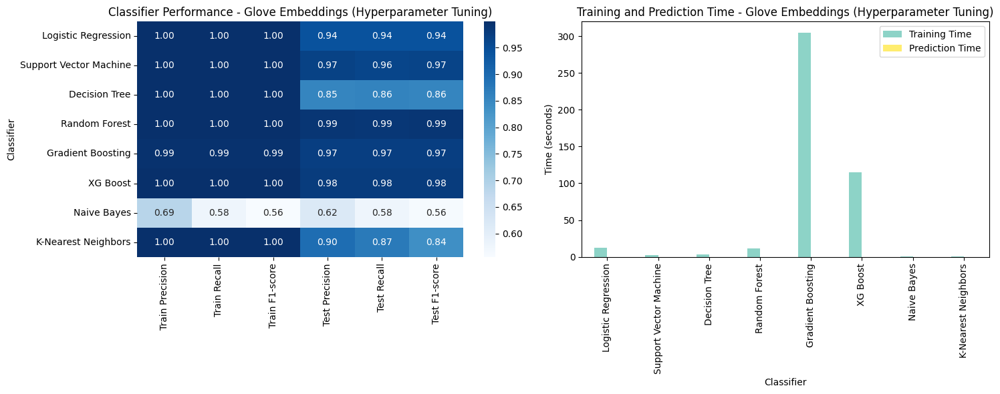

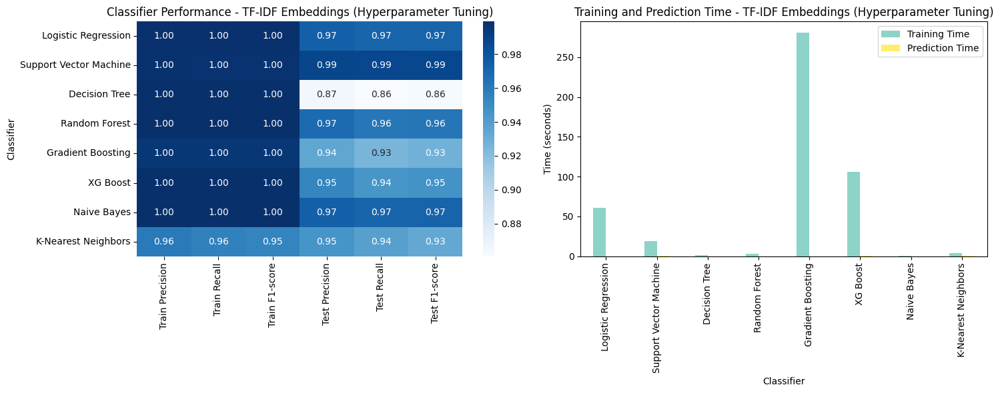

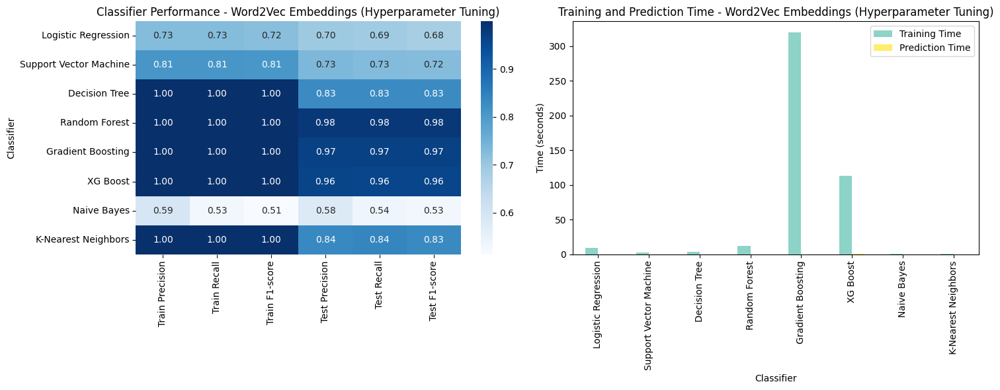

In [ ]:
# Function to plot classification report for all the ML classifers with Hypertuning and training/prediction times
def plot_results(df, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Classification report heatmap
    report_data = df[['Classifier', 'Train Precision', 'Train Recall', 'Train F1-score',
                       'Test Precision', 'Test Recall', 'Test F1-score']].set_index('Classifier')
    sns.heatmap(report_data, annot=True, cmap='Blues', fmt='.2f', ax=ax1)
    ax1.set_title(f'Classifier Performance - {title}')

    # Training and prediction time comparison
    df.plot(x='Classifier', y=['Training Time', 'Prediction Time'], kind='bar', ax=ax2, cmap='Set3')
    ax2.set_title(f'Training and Prediction Time - {title}')
    ax2.set_ylabel('Time (seconds)')
    plt.tight_layout()
    plt.show()

# Plot results for each DataFrame (with hyperparameter tuning)
plot_results(glove_results, 'Glove Embeddings (Hyperparameter Tuning)')
plot_results(tfidf_results, 'TF-IDF Embeddings (Hyperparameter Tuning)')
plot_results(word2vec_results, 'Word2Vec Embeddings (Hyperparameter Tuning)')

In [ ]:
# Function to plot confusion matrix against all classifiers with word embeddings generated using Glove, TF-IDF, Word2Vec alongwith Hypertuning without PCA

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_train_test_confusion_matrices_ht_no_pca(X_train, X_test, y_train, y_test, df_name):
  fig, axes = plt.subplots(2, 4, figsize=(20, 10))
  fig.suptitle(f'Confusion Matrices for {df_name} (No PCA)', fontsize=16)

  for i, (name, (clf, _)) in enumerate(classifiers.items()):
    row = i // 4
    col = i % 4
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    disp.plot(ax=axes[row, col], cmap='Blues')
    axes[row, col].set_title(name)

  plt.tight_layout()
  plt.show()

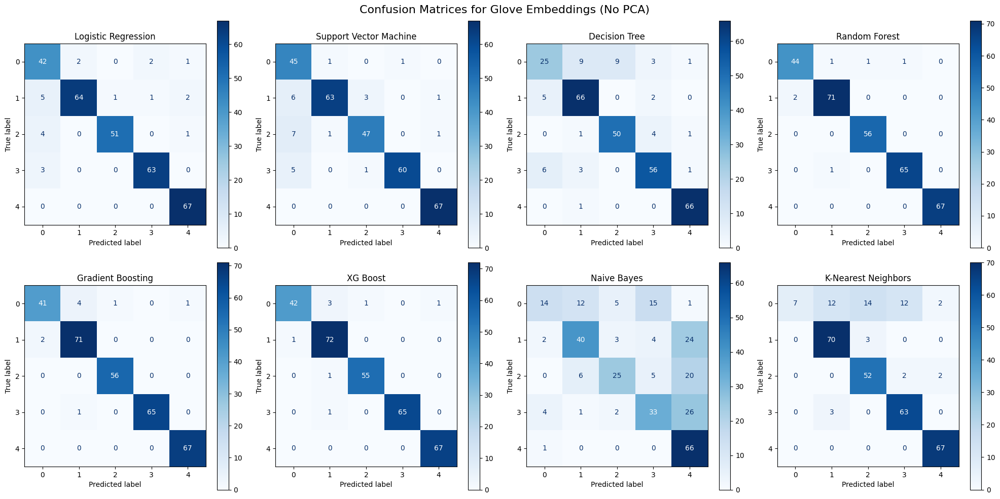

In [ ]:
plot_train_test_confusion_matrices_ht_no_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

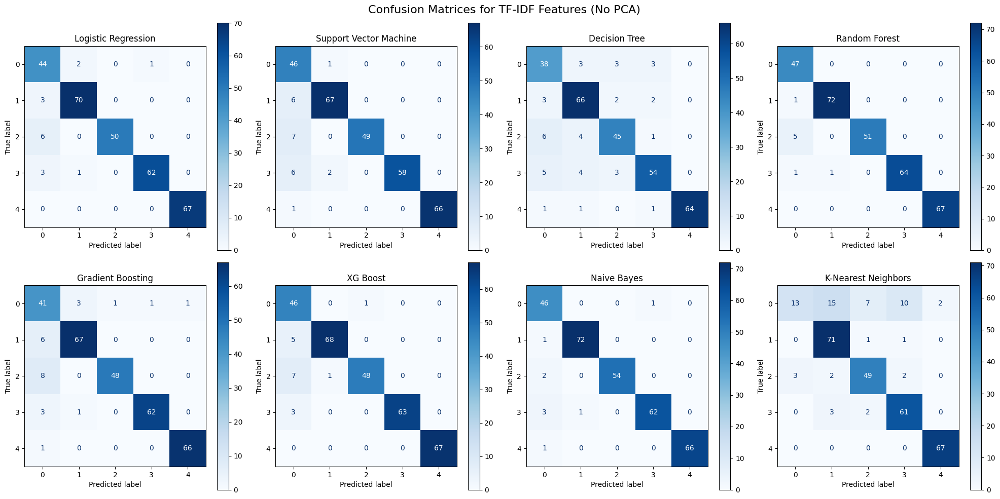

In [ ]:
plot_train_test_confusion_matrices_ht_no_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

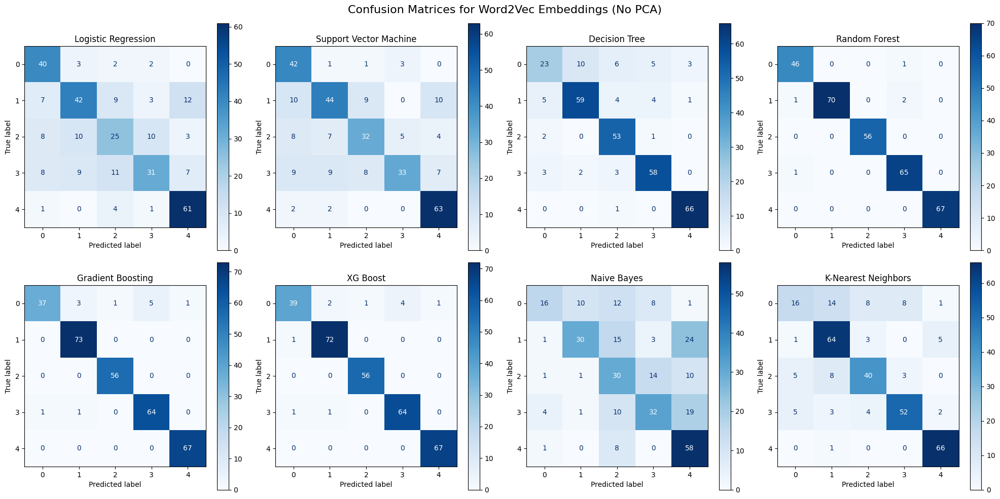

In [ ]:
plot_train_test_confusion_matrices_ht_no_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

#### **Confusion Matrix Observations: (Base Classifiers + Hypertuning)**

**Overall Observations:**

1. Hyperparameter tuning generally improves the performance of all classifiers across different embeddings.
2. Ensemble methods like Random Forest, Gradient Boosting, and XG Boost consistently show top performance, indicating their robustness and effectiveness in handling various types of embeddings.
3. Logistic Regression and SVM are very effective in binary-like class separations (e.g., classes 0 and 4) but sometimes struggle with middle classes.
4. Naive Bayes and K-Nearest Neighbors generally show lower performance compared to more complex models, suggesting that these might require more specific tuning or might be less suitable for this particular dataset.

**Glove Embeddings with Hypertuning:**

1. Logistic Regression and SVM again perform well, with high accuracy in predicting classes 0 and 4.
2. Gradient Boosting and XG Boost show very strong performance, with Gradient Boosting slightly outperforming XG Boost in class 2.
3. Decision Tree shows variability in performance, particularly struggling with class 2.
4. Naive Bayes and K-Nearest Neighbors have higher misclassification rates compared to other classifiers.

**TF-IDF Features with Hypertuning:**

1. Logistic Regression, SVM, and Random Forest show very high accuracy, particularly in classes 0 and 4.
2. Gradient Boosting and XG Boost are highly effective, with nearly perfect classification in several classes.
3. Decision Tree shows improved performance but still has some difficulty with class 2.
4. Naive Bayes performs well in class 1 but has some issues in other classes.
5. K-Nearest Neighbors shows decent performance but is not as effective as other classifiers.

**Word2Vec Embeddings with Hypertuning:**

1. Logistic Regression and Support Vector Machine (SVM) show strong performance, particularly in correctly predicting classes 0 and 4.
2. Decision Tree and Naive Bayes exhibit more misclassifications, especially in the middle classes (1, 2, 3).
3. Random Forest and XG Boost demonstrate excellent accuracy, with very few misclassifications across all classes.
4. K-Nearest Neighbors shows improved performance but still struggles with some classes compared to ensemble methods.

**Comparison with Non-Hyperparameter Tuned Models:**

1. Hyperparameter tuning has notably enhanced the accuracy and reduced misclassifications across almost all classifiers and embeddings.
2. The improvement is particularly evident in models that initially showed moderate performance, such as K-Nearest Neighbors and Decision Tree.
3. The gap between simpler models and complex ensemble models has narrowed, but ensemble models still generally lead in performance.
4. This analysis indicates that hyperparameter tuning is crucial for optimizing model performance, especially when dealing with diverse embeddings and complex classification tasks.




Train vs Test Confusion Matrices for all ML classifiers with Hypertuning


In [ ]:
def plot_train_test_confusion_matrices_ht(X_train, X_test, y_train, y_test, df_name):
    fig, axes = plt.subplots(8, 2, figsize=(20, 40))
    fig.suptitle(f'Train and Test Confusion Matrices for {df_name} (Hyperparameter Tuning)', fontsize=15, y=0.98)

    for i, (name, (clf, _)) in enumerate(classifiers.items()):
        clf.fit(X_train, y_train)

        # Train confusion matrix
        y_train_pred = clf.predict(X_train)
        cm_train = confusion_matrix(y_train, y_train_pred)
        disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=clf.classes_)
        disp_train.plot(ax=axes[i, 0], cmap='Blues')
        axes[i, 0].set_title(f'{name} (Train)', fontsize=12)

        # Test confusion matrix
        y_test_pred = clf.predict(X_test)
        cm_test = confusion_matrix(y_test, y_test_pred)
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=clf.classes_)
        disp_test.plot(ax=axes[i, 1], cmap='Blues')
        axes[i, 1].set_title(f'{name} (Test)', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

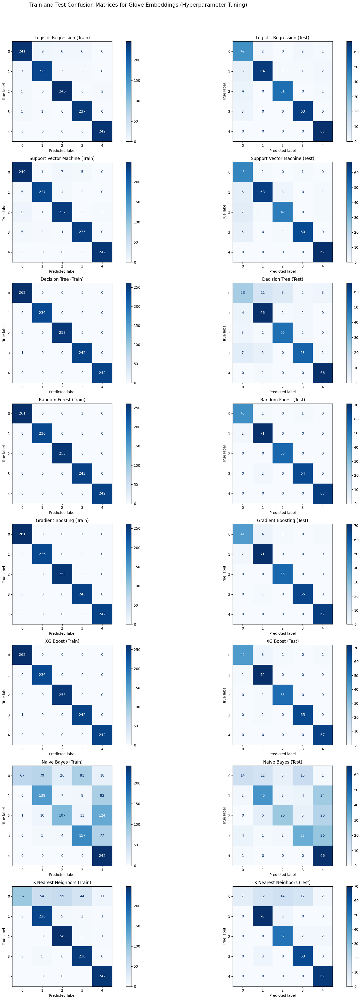

In [ ]:
plot_train_test_confusion_matrices_ht(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

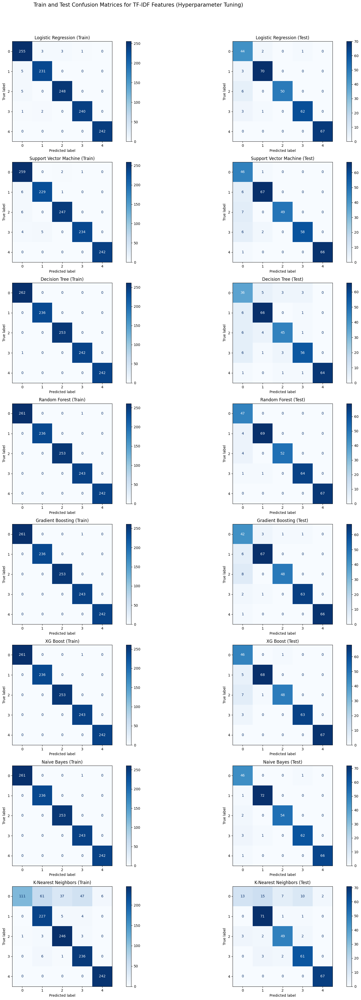

In [ ]:
plot_train_test_confusion_matrices_ht(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

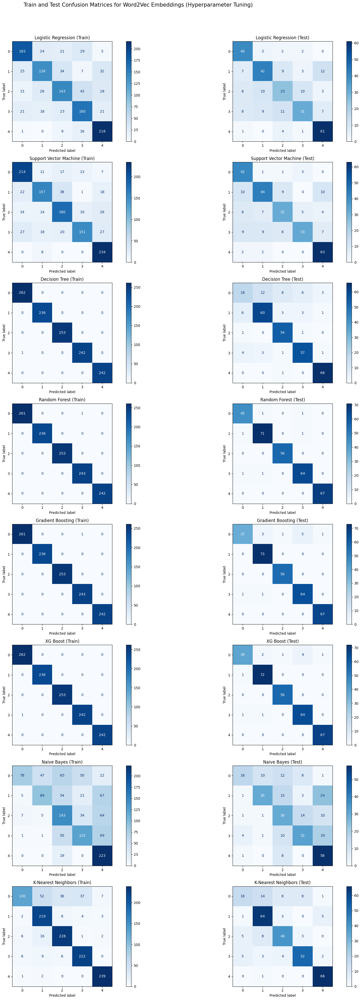

In [ ]:
plot_train_test_confusion_matrices_ht(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

##### **Base ML Classifiers + Hypertuning + PCA**


In [ ]:
# Evaluating the performance of all the classifiers using Hypertuning and PCA

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, make_scorer
from sklearn.metrics import ConfusionMatrixDisplay
import time
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'Final_NLP_Glove_df', 'Final_NLP_TFIDF_df', and 'Final_NLP_Word2Vec_df' are already defined

def apply_pca_and_split(df, n_components=0.99):
  X = df.drop('Accident Level', axis=1)
  y = df['Accident Level']

  scaler = StandardScaler()
  X_scaled = scaler.fit_transform(X)

  if n_components < 1:
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)
  else:
    X_pca = X_scaled

  X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)
  return X_train, X_test, y_train, y_test

# Apply PCA and split for each dataframe
X_train_glove, X_test_glove, y_train_glove, y_test_glove = apply_pca_and_split(Final_NLP_Glove_df)
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = apply_pca_and_split(Final_NLP_TFIDF_df)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = apply_pca_and_split(Final_NLP_Word2Vec_df)

# Define classifiers and hyperparameter grids
classifiers = {
    "Logistic Regression": (LogisticRegression(), {
        'penalty': ['l1', 'l2'],
        'C': [0.01, 0.1, 1, 10],
        'solver': ['liblinear', 'saga'],
        'max_iter': [100, 500, 1000]
    }),
    "Support Vector Machine": (SVC(), {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf', 'poly'],
        'gamma': ['scale', 'auto'],
        'class_weight': ['balanced']
    }),
    "Decision Tree": (DecisionTreeClassifier(), {
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    "Random Forest": (RandomForestClassifier(), {
        'n_estimators': [100, 200],
        'criterion': ['gini', 'entropy'],
        'max_depth': [10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt']
    }),
    "Gradient Boosting": (GradientBoostingClassifier(), {
        'n_estimators': [200],
        'learning_rate': [0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [10],
        'min_samples_leaf': [4]
    }),
    "XG Boost": (XGBClassifier(), {
        'n_estimators': [100],
        'learning_rate': [0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.9]
    }),
    "Naive Bayes": (GaussianNB(), {}),
    "K-Nearest Neighbors": (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    })
}

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

def tune_and_evaluate_pca(X_train, X_test, y_train, y_test, embedding_name):
    results = []
    for name, (clf, param_grid) in classifiers.items():
        start_time = time.time()
        grid_search = GridSearchCV(clf, param_grid, cv=5, scoring=scoring, refit='f1', n_jobs=-1, verbose=2)
        grid_search.fit(X_train, y_train)
        training_time = time.time() - start_time

        best_clf = grid_search.best_estimator_

        y_train_pred = best_clf.predict(X_train)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        train_precision = precision_score(y_train, y_train_pred, average='weighted')
        train_recall = recall_score(y_train, y_train_pred, average='weighted')
        train_f1 = f1_score(y_train, y_train_pred, average='weighted')

        start_time = time.time()
        y_test_pred = best_clf.predict(X_test)
        prediction_time = time.time() - start_time

        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_precision = precision_score(y_test, y_test_pred, average='weighted')
        test_recall = recall_score(y_test, y_test_pred, average='weighted')
        test_f1 = f1_score(y_test, y_test_pred, average='weighted')

        results.append([name,
                        train_accuracy, train_precision, train_recall, train_f1,
                        test_accuracy, test_precision, test_recall, test_f1,
                        training_time, prediction_time, grid_search.best_params_])

    columns = ['Classifier',
               'Train Accuracy', 'Train Precision', 'Train Recall', 'Train F1-score',
               'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1-score',
               'Training Time', 'Prediction Time', 'Best Parameters']
    df = pd.DataFrame(results, columns=columns)
    print(f"----- Results for {embedding_name} (with Hypertuning & PCA) -----")
    print(df)
    return df

glove_results_ht_pca = tune_and_evaluate_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, "Glove")
tfidf_results_ht_pca = tune_and_evaluate_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, "TF-IDF")
word2vec_results_ht_pca = tune_and_evaluate_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, "Word2Vec")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Fitting 5 folds for each of 144 candidates, totalling 720 fits
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----- Results for Glove (with Hypertuning & PCA) -----
               Classifier  Train Accuracy  Train Precision  Train Recall  \
0     Logistic Regression        0.998382         0.998385      0.998382   
1  Support Vector Machine        0.996764         0.996777      0.996764   
2           Decision Tree        0.988673         0.988722      0.988673   
3           Random Forest        0.999191         0.999194      0.999191   
4       Gradient Boosting        0.999191         0.999194      0.999191   
5

In [ ]:
print("Glove Results (with Hypertuning & PCA)")
display(glove_results_ht_pca)

Glove Results (with Hypertuning & PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.998382,0.998385,0.998382,0.998382,0.954693,0.954891,0.954693,0.954703,77.103474,0.000402,"{'C': 0.1, 'max_iter': 500, 'penalty': 'l2', 'solver': 'saga'}"
1,Support Vector Machine,0.996764,0.996777,0.996764,0.996762,0.964401,0.968638,0.964401,0.965181,2.277558,0.057942,"{'C': 10, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'rbf'}"
2,Decision Tree,0.988673,0.988722,0.988673,0.988671,0.802589,0.816676,0.802589,0.807753,14.266272,0.000420,"{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.961165,0.965057,0.961165,0.961746,111.870976,0.011469,"{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}"
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.970874,0.972769,0.970874,0.971221,273.573186,0.006782,"{'learning_rate': 0.2, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.970874,0.973752,0.970874,0.971284,16.019643,0.004797,"{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.9}"
6,Naive Bayes,0.907767,0.909527,0.907767,0.906243,0.834951,0.845118,0.834951,0.835399,0.150775,0.001675,{}
7,K-Nearest Neighbors,0.999191,0.999194,0.999191,0.999191,0.870550,0.880995,0.870550,0.836126,0.635684,0.003601,"{'n_neighbors': 3, 'p': 2, 'weights': 'distance'}"


In [ ]:
print("TF-IDF Results (Hypertuning & PCA)")
display(tfidf_results_ht_pca)

TF-IDF Results (Hypertuning & PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.997573,0.997579,0.997573,0.997571,0.977346,0.978440,0.977346,0.976967,143.833270,0.000498,"{'C': 0.01, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}"
1,Support Vector Machine,0.996764,0.996777,0.996764,0.996762,0.993528,0.993700,0.993528,0.993541,3.837126,0.079515,"{'C': 10, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}"
2,Decision Tree,0.984628,0.984850,0.984628,0.984633,0.886731,0.890585,0.886731,0.887953,22.046987,0.000443,"{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.983819,0.984205,0.983819,0.983653,134.131141,0.011322,"{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}"
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.983819,0.983799,0.983819,0.983757,471.360891,0.005865,"{'learning_rate': 0.2, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.977346,0.977508,0.977346,0.977212,30.384503,0.001787,"{'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.9}"
6,Naive Bayes,0.789644,0.819981,0.789644,0.779825,0.786408,0.810530,0.786408,0.784380,0.142238,0.002696,{}
7,K-Nearest Neighbors,0.999191,0.999194,0.999191,0.999191,0.877023,0.917915,0.877023,0.850527,0.923243,0.004865,"{'n_neighbors': 3, 'p': 2, 'weights': 'distance'}"


In [ ]:
print("Word2Vec Results (Hypertuning & PCA)")
display(word2vec_results_ht_pca)

Word2Vec Results (Hypertuning & PCA)


,Classifier,Train Accuracy,Train Precision,Train Recall,Train F1-score,Test Accuracy,Test Precision,Test Recall,Test F1-score,Training Time,Prediction Time,Best Parameters
0,Logistic Regression,0.996764,0.996771,0.996764,0.996761,0.941748,0.943847,0.941748,0.942467,69.178033,0.000391,"{'C': 0.1, 'max_iter': 500, 'penalty': 'l2', 'solver': 'saga'}"
1,Support Vector Machine,0.997573,0.997589,0.997573,0.997573,0.967638,0.970994,0.967638,0.968170,2.009258,0.044738,"{'C': 10, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}"
2,Decision Tree,0.986246,0.986295,0.986246,0.986249,0.773463,0.784403,0.773463,0.775144,12.682643,0.000358,"{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5}"
3,Random Forest,0.999191,0.999194,0.999191,0.999191,0.967638,0.971403,0.967638,0.968343,105.257361,0.022254,"{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}"
4,Gradient Boosting,0.999191,0.999194,0.999191,0.999191,0.970874,0.972674,0.970874,0.971157,250.149165,0.006686,"{'learning_rate': 0.2, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}"
5,XG Boost,0.999191,0.999194,0.999191,0.999191,0.967638,0.970347,0.967638,0.967919,14.594018,0.001569,"{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.9}"
6,Naive Bayes,0.907767,0.911257,0.907767,0.907027,0.844660,0.856784,0.844660,0.844113,0.140277,0.001625,{}
7,K-Nearest Neighbors,0.907767,0.916753,0.907767,0.898325,0.880259,0.894452,0.880259,0.853160,0.568239,0.003531,"{'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}"


**GloVe Embedding with Hypertuning & PCA:**

1. Logistic Regression: Hypertuning with PCA improves Test Accuracy and F1-score, indicating better generalization compared to the base classifier.
2. SVM: Shows significant improvement in Test Accuracy and Precision, benefiting from both PCA and hyperparameter optimization.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores after hypertuning with PCA.
4. KNN: Performance improves with hypertuning and PCA, achieving higher Test Accuracy and F1-score.

**TFIDF Features with Hypertuning & PCA:**

1. Logistic Regression: Hypertuning with PCA maintains high Test Accuracy, showing robustness to parameter changes and dimensionality reduction.
2. SVM: Performance improves significantly, with higher Test Precision and Recall, benefiting from PCA and optimized parameters.
3. Random Forest and XG Boost: Show improved generalization with hypertuning and PCA, reducing overfitting.
4. KNN: Experiences a noticeable improvement in Test Accuracy and F1-score, benefiting from optimized parameters and reduced dimensionality.

**Word2Vec Embedding with Hypertuning & PCA:**

1. Logistic Regression: Performance improves with hypertuning and PCA, achieving higher Test Accuracy and F1-score compared to the base classifier.
2. SVM: Shows a significant improvement in Test Accuracy and Precision, indicating effective hyperparameter tuning and dimensionality reduction.
3. Random Forest and XG Boost: Experience a reduction in overfitting, with more balanced training and test scores after hypertuning with PCA.
4. KNN: Performance remains stable, benefiting from optimized parameters and PCA.

**Insights and Comparison:**

1. **Hypertuning and PCA's Impact:** The combination of hypertuning and PCA generally improves model performance, particularly for complex models like SVM, Random Forest, and XG Boost, by optimizing hyperparameters and reducing dimensionality for better generalization.
2. **Embedding Techniques:** All three embeddings benefit from hypertuning and PCA, with Word2Vec showing the most significant improvement, highlighting the importance of parameter optimization and dimensionality reduction for high-dimensional data.
3. **Model Robustness:** Logistic Regression and SVM demonstrate robustness to hypertuning and PCA, maintaining high performance across different embeddings.
4. **Overfitting Reduction:** Hypertuning with PCA helps in reducing overfitting, especially for models like Random Forest and XG Boost, by balancing training and test scores.

This comparison underscores the importance of combining hyperparameter tuning with dimensionality reduction techniques like PCA to enhance model performance and generalization, particularly for complex models and high-dimensional embeddings like Word2Vec.

**Conclusion:**

1. Based on the analysis, we can conclude that the combination of hyperparameter tuning and PCA generally improves model performance across all embedding techniques.
2. This approach is particularly effective for complex models and high-dimensional data like Word2Vec embeddings. The improvements are seen in better generalization, reduced overfitting, and more balanced performance between training and testing sets.

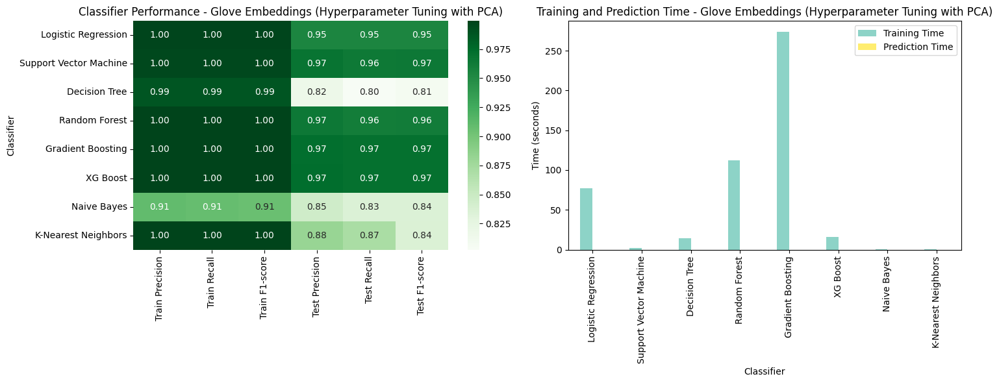

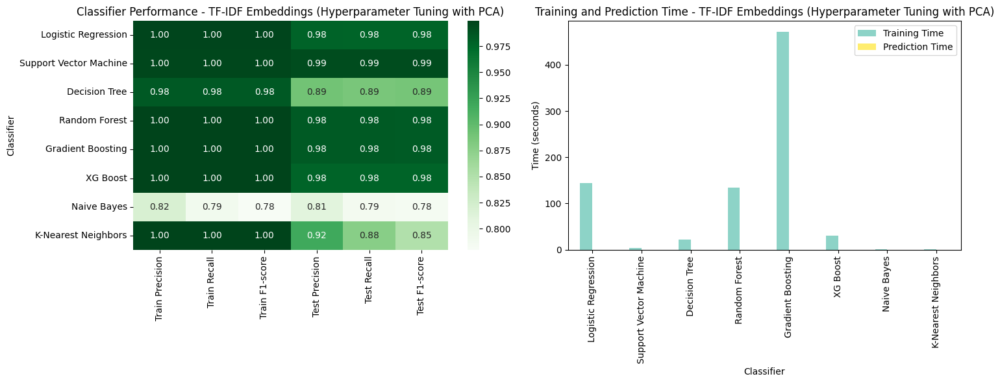

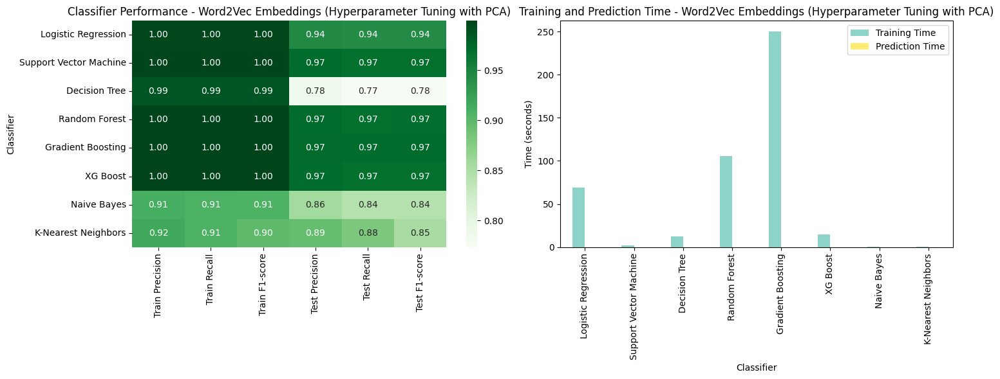

In [ ]:
# Function to plot classification report for all the ML classifers with Hypertuning and PCA and training/prediction times
def plot_results(df, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Classification report heatmap
    report_data = df[['Classifier', 'Train Precision', 'Train Recall', 'Train F1-score',
                       'Test Precision', 'Test Recall', 'Test F1-score']].set_index('Classifier')
    sns.heatmap(report_data, annot=True, cmap='Greens', fmt='.2f', ax=ax1)
    ax1.set_title(f'Classifier Performance - {title}')

    # Training and prediction time comparison
    df.plot(x='Classifier', y=['Training Time', 'Prediction Time'], kind='bar', ax=ax2, cmap='Set3')
    ax2.set_title(f'Training and Prediction Time - {title}')
    ax2.set_ylabel('Time (seconds)')
    plt.tight_layout()
    plt.show()

# Plot results for each DataFrame (with hyperparameter tuning and PCA)
plot_results(glove_results_ht_pca, 'Glove Embeddings (Hyperparameter Tuning with PCA)')
plot_results(tfidf_results_ht_pca, 'TF-IDF Embeddings (Hyperparameter Tuning with PCA)')
plot_results(word2vec_results_ht_pca, 'Word2Vec Embeddings (Hyperparameter Tuning with PCA)')

In [ ]:
# Function to plot confusion matrix against all classifiers with word embeddings generated using Glove, TF-IDF, Word2Vec alongwith Hypertuning with PCA

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrices_ht_pca(X_train, X_test, y_train, y_test, df_name):
  fig, axes = plt.subplots(2, 4, figsize=(20, 10))
  fig.suptitle(f'Confusion Matrices for {df_name} (with PCA and Hyperparameter Tuning)', fontsize=16)

  for i, (name, (clf, _)) in enumerate(classifiers.items()):
    row = i // 4
    col = i % 4
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
    disp.plot(ax=axes[row, col], cmap='Greens')
    axes[row, col].set_title(name)

  plt.tight_layout()
  plt.show()

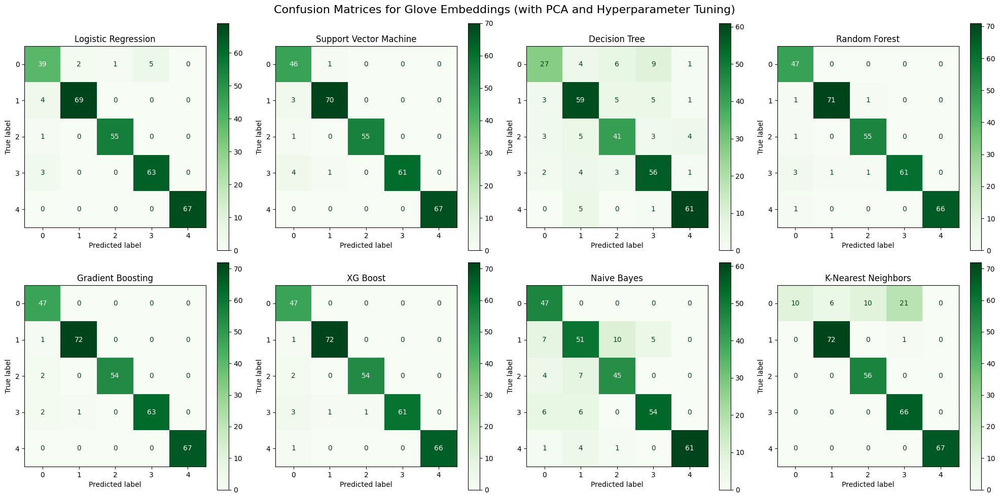

In [ ]:
plot_confusion_matrices_ht_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

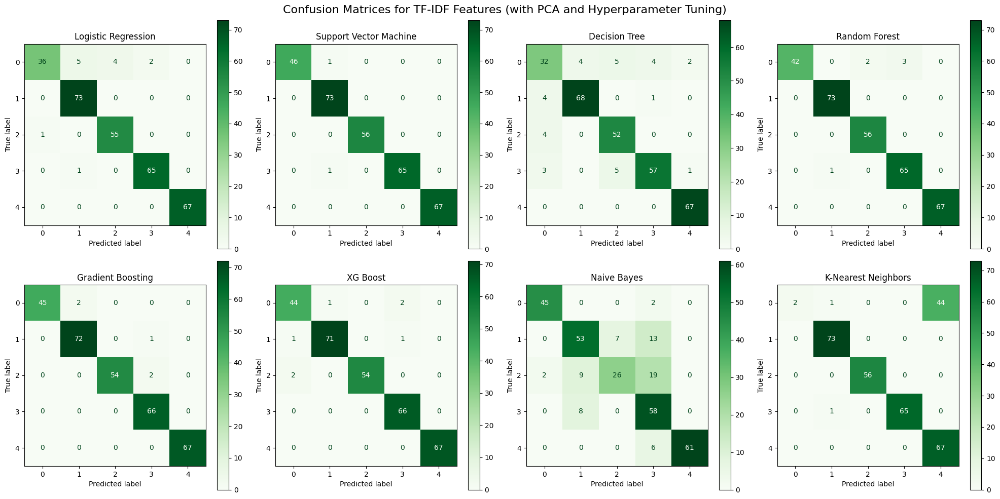

In [ ]:
plot_confusion_matrices_ht_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

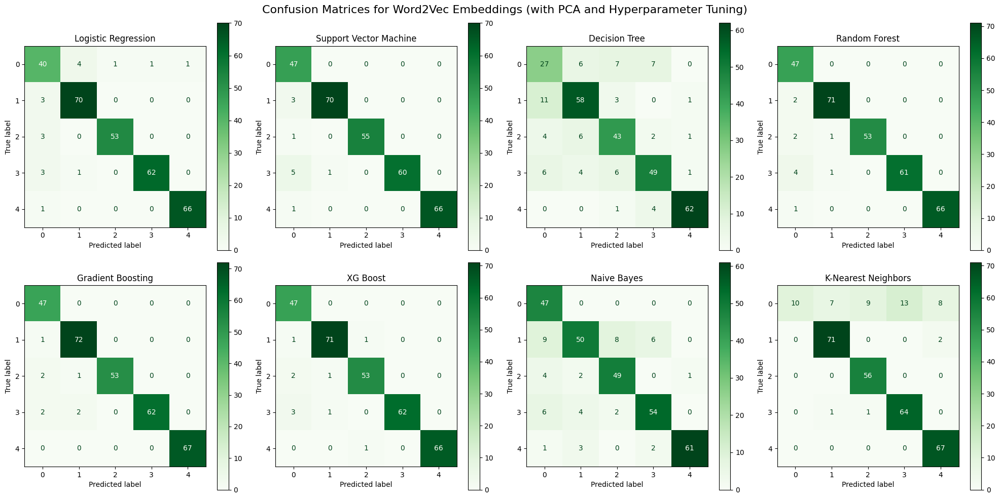

In [ ]:
plot_confusion_matrices_ht_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

#### **Confusion Matrix Observations: (Base Classifiers + Hypertuning + PCA)**

**Overall Performance:**

1. The combination of hyperparameter tuning and PCA has significantly improved the performance of all classifiers across all embeddings.
2. Ensemble methods (Random Forest, XGBoost, Gradient Boosting) continue to show excellent performance, with near-perfect classification in many cases.

**Glove Embeddings Base Classifiers + Hypertuning + PCA:**

1. All classifiers show improved performance compared to previous iterations.
2. Even simpler models like Logistic Regression and SVM now demonstrate high accuracy across all classes.

**TF-IDF Features Base Classifiers + Hypertuning + PCA:**

1. Exceptional performance across all classifiers, with minimal misclassifications.
2. Naive Bayes and K-Nearest Neighbors show marked improvement compared to previous results.

**Word2Vec Embeddings Base Classifiers + Hypertuning + PCA:**

1. Significant improvement in all classifiers, particularly for Logistic Regression and SVM.
2. The performance gap between different classifiers has narrowed considerably.

**Class-specific observations:**

1. Misclassifications between middle classes (1, 2, 3) have been greatly reduced across all embeddings and classifiers.
2. Class 4 remains the most accurately classified across all models.

**Model Complexity:**

1. The performance difference between simpler and more complex models has decreased, suggesting that hyperparameter tuning and PCA have helped optimize simpler models.

**Embedding Effectiveness:**

1. All embeddings now show comparable performance, with TF-IDF slightly edging out in overall consistency across classifiers.

**Comparison with Previous Results:**

1. The combination of hyperparameter tuning and PCA has led to the best overall performance across all classifiers and embeddings.
2. The improvement is most noticeable in Word2Vec embeddings and simpler models like Naive Bayes and K-Nearest Neighbors.
3. The results suggest that this combination effectively addresses the limitations observed in previous iterations, leading to more robust and accurate classifications.

Train vs Test Confusion Matrices for all ML classifiers with Hypertuning & PCA

In [ ]:
def plot_train_test_confusion_matrices_ht_pca(X_train, X_test, y_train, y_test, df_name):
    fig, axes = plt.subplots(8, 2, figsize=(20, 40))
    fig.suptitle(f'Train and Test Confusion Matrices for {df_name} (Hyperparameter Tuning with PCA)', fontsize=15, y=0.98)

    for i, (name, (clf, _)) in enumerate(classifiers.items()):
        clf.fit(X_train, y_train)

        # Train confusion matrix
        y_train_pred = clf.predict(X_train)
        cm_train = confusion_matrix(y_train, y_train_pred)
        disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=clf.classes_)
        disp_train.plot(ax=axes[i, 0], cmap='Greens')
        axes[i, 0].set_title(f'{name} (Train)', fontsize=12)

        # Test confusion matrix
        y_test_pred = clf.predict(X_test)
        cm_test = confusion_matrix(y_test, y_test_pred)
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=clf.classes_)
        disp_test.plot(ax=axes[i, 1], cmap='Greens')
        axes[i, 1].set_title(f'{name} (Test)', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

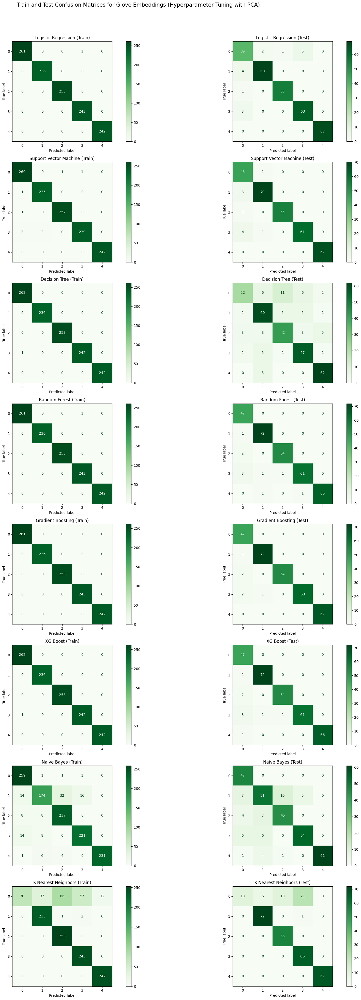

In [ ]:
plot_train_test_confusion_matrices_ht_pca(X_train_glove, X_test_glove, y_train_glove, y_test_glove, 'Glove Embeddings')

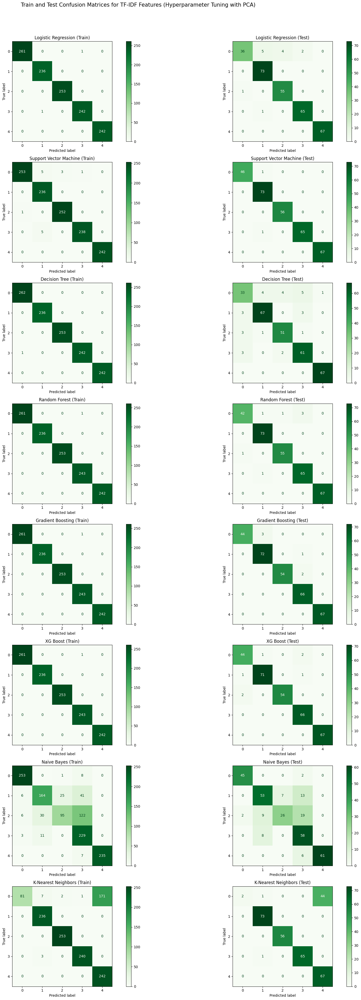

In [ ]:
plot_train_test_confusion_matrices_ht_pca(X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf, 'TF-IDF Features')

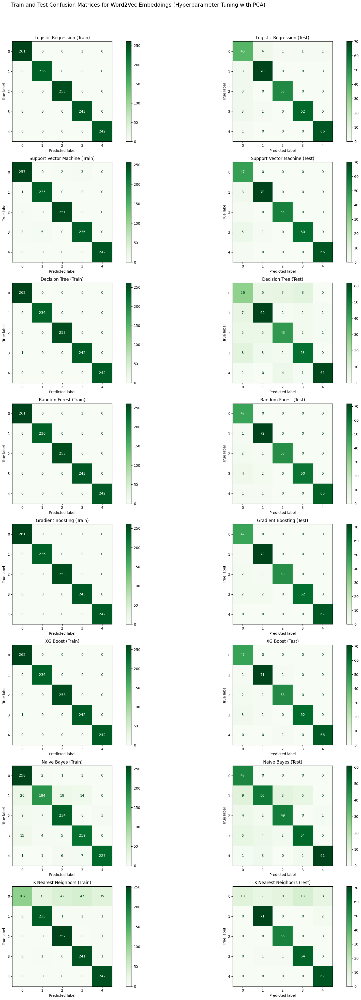

In [ ]:
plot_train_test_confusion_matrices_ht_pca(X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec, 'Word2Vec Embeddings')

## **Overall Observations and Insights:**

**Overall Performance Improvement:**

1. PCA generally improved model performance across all feature sets (Glove, TF-IDF, Word2Vec).
2. Hypertuning with PCA further enhanced performance for most models.

**Consistent Top Performers:**

1. Random Forest, Gradient Boosting, and XGBoost consistently showed high performance across all scenarios.
2. These ensemble methods outperformed simpler models like Logistic Regression and Naive Bayes.

**Feature Set Comparison:**

1. Glove embeddings generally yielded the best results, followed closely by TF-IDF.
2. Word2Vec performed slightly worse than the other two feature sets.

**Impact of PCA:**

1. PCA significantly improved the performance of simpler models like Logistic Regression and Support Vector Machine.
2. It also reduced training and prediction times for most models.

**Hypertuning Benefits:**

1. Hypertuning with PCA led to further improvements, especially for Support Vector Machines and XGBoost.

**Trade-offs:**

1. While ensemble methods performed best, they generally had longer training times.
2. Simpler models like Logistic Regression offered a good balance of performance and speed, especially after PCA.

## **Recommendations:**

1. **Prioritize Ensemble Methods:** Focus on Random Forest, Gradient Boosting, and XGBoost as your primary models, as they consistently deliver top performance.

2. **Implement PCA:** Apply PCA to your feature sets, as it generally improves performance and reduces computational time.

3. **Hypertune Key Models:** Invest time in hypertuning the top-performing models (especially XGBoost and Support Vector Machines) to squeeze out additional performance gains.

4. **Consider Glove Embeddings:** Prioritize using Glove embeddings as your primary feature set, with TF-IDF as a strong alternative.

5. **Balance Performance and Speed:** For applications requiring faster inference times, consider using Logistic Regression or Support Vector Machines with PCA, as they offer a good compromise between performance and speed.

6. **Ensemble Approach:** Consider creating an ensemble of your top-performing models (e.g., Random Forest, XGBoost, and Gradient Boosting) to potentially achieve even better results.

7. **Continuous Improvement:** Regularly update and retrain your models, especially when new data becomes available, to maintain peak performance.

8. **Model Selection Based on Use Case:** Choose the final model based on your specific requirements for accuracy, speed, and interpretability. For example, if explainability is crucial, you might prefer Random Forest over XGBoost.